# Final lead score case study

### Problem Statement

An X Education need help to select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires us to build a model wherein you need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.





### Goals of Case Study

Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.

# Step 1: Importing Data

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')


In [2]:
# Importing Pandas and NumPy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)

In [3]:
# Importing  dataset
df = pd.read_csv("Leads.csv")
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


# Step 2: Inspecting the Dataframe

In [4]:
df.shape

(9240, 37)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [6]:
df.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [7]:
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [8]:
# check  the missing values percetange in descending order of each column of telecom
null_per = (df.isnull().mean() * 100).sort_values(ascending=False)
round(null_per,2)

Lead Quality                                     51.59
Asymmetrique Activity Index                      45.65
Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Profile Index                       45.65
Tags                                             36.29
Lead Profile                                     29.32
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
How did you hear about X Education               23.89
Specialization                                   15.56
City                                             15.37
Page Views Per Visit                              1.48
TotalVisits                                       1.48
Last Activity                                     1.11
Lead Source                                       0.39
Receive More Updates About Our Courses            0.00
I agree to

### checking for duplicates

In [9]:
#Checking for duplicates:¶
df[df.duplicated()]

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity


#### No duplicates in our dataset.

# STEP 3 : DATA CLEANING AND DATA PREPARATION

### now as per the problem description and data info we can see there is category called "select" which needs to be handled because it is as good as a null value.


#### So we can convert these values to null values

In [10]:
#  lets check some columns if select category exist:-
print(df["Lead Profile"].nunique())
print(df["Lead Profile"].value_counts())
print(df["How did you hear about X Education"].nunique())
print(df["How did you hear about X Education"].value_counts())

6
Select                         4146
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: Lead Profile, dtype: int64
10
Select                   5043
Online Search             808
Word Of Mouth             348
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               67
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64


### A) Converting 'Select' values to NaN.

In [11]:
# Converting 'Select' values to NaN.
df = df.replace('Select', np.nan)

In [12]:
# Re-check  the missing values percetange in descending order of each column of telecom
null_per = (df.isnull().mean() * 100).sort_values(ascending=False)
round(null_per,2)

How did you hear about X Education               78.46
Lead Profile                                     74.19
Lead Quality                                     51.59
Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Activity Index                      45.65
Asymmetrique Profile Index                       45.65
City                                             39.71
Specialization                                   36.58
Tags                                             36.29
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
Page Views Per Visit                              1.48
TotalVisits                                       1.48
Last Activity                                     1.11
Lead Source                                       0.39
Receive More Updates About Our Courses            0.00
I agree to

### B) FIRST SET OF DROP OF COLUMNS >30 % MISSING VALUES

In [13]:
####  Certain columns have high percentage of missing values.

####  We can drop the columns with missing values greater than 40%.

In [14]:
# first we will list out the columns with  more than 40% null values..not great use for analysis.
# Columns with NULL Values greater than 40%

cols_to_drop = (df.isnull().mean()*100).sort_values()[df.isnull().mean()*100 > 39]
print(cols_to_drop)
len(cols_to_drop)

City                                  39.707792
Asymmetrique Activity Index           45.649351
Asymmetrique Profile Index            45.649351
Asymmetrique Activity Score           45.649351
Asymmetrique Profile Score            45.649351
Lead Quality                          51.590909
Lead Profile                          74.188312
How did you hear about X Education    78.463203
dtype: float64


8

In [15]:
# we can drop these columns in cols_to_drop (>40% missing values) and recheck shape: #before(9240, 37)
df = df.drop(columns = cols_to_drop.index, axis =1)
df.shape

(9240, 29)

### C) CHECKING THE REMAINING MISSING VALUES COLUMNS:

In [16]:
# After dropping columns - Again Re-check  the missing values percetange in descending order of each column of telecom
null_per = (df.isnull().mean() * 100).sort_values(ascending=False)
round(null_per,2)

Specialization                                   36.58
Tags                                             36.29
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
TotalVisits                                       1.48
Page Views Per Visit                              1.48
Last Activity                                     1.11
Lead Source                                       0.39
Update me on Supply Chain Content                 0.00
Get updates on DM Content                         0.00
X Education Forums                                0.00
I agree to pay the amount through cheque          0.00
A free copy of Mastering The Interview            0.00
Receive More Updates About Our Courses            0.00
Through Recommendations                           0.00
Digital Advertisement                             0.00
Newspaper                                         0.00
Prospect I

### List of remaining missing values:

In [17]:
rem_mv = ["Tags" ,"Specialization" ,"What matters most to you in choosing a course","What is your current occupation",
          "Country","TotalVisits","Page Views Per Visit","Last Activity","Lead Source"]

len(rem_mv)

9

### D) BEFORE IMPUTING - LETS DO COUNTPLOT & VALUECOUNT OF ALL REMAINING MISSING VALUES VARIABLES
        AND CHECK WHAT CAN BE DONE:

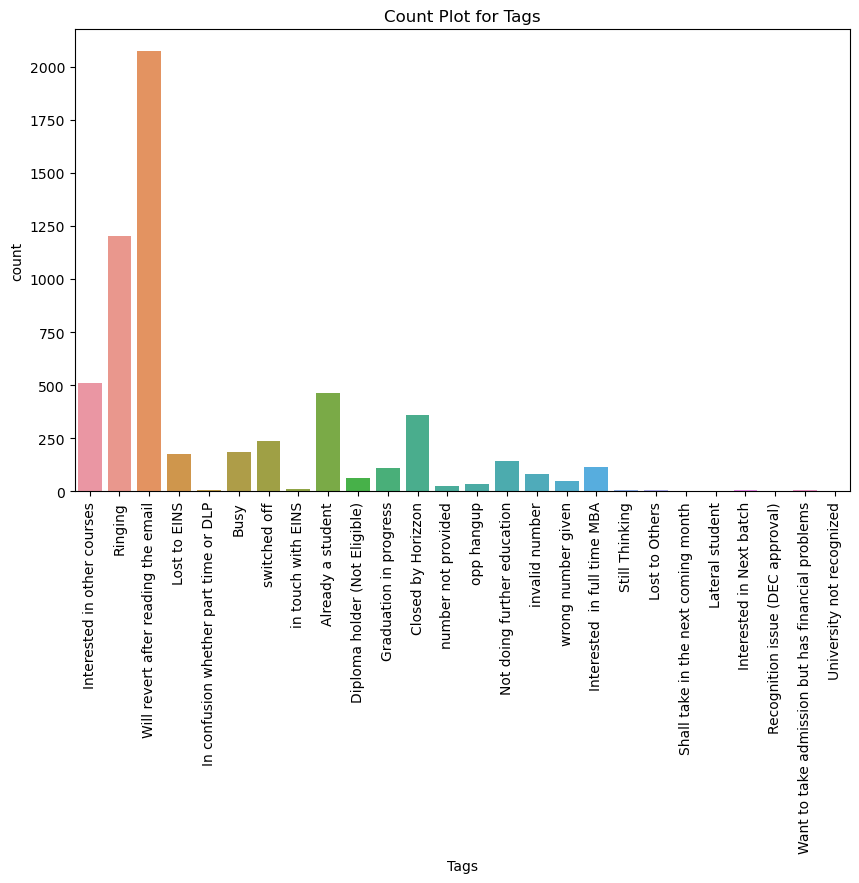

Value Counts for Tags:
Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with EINS                               

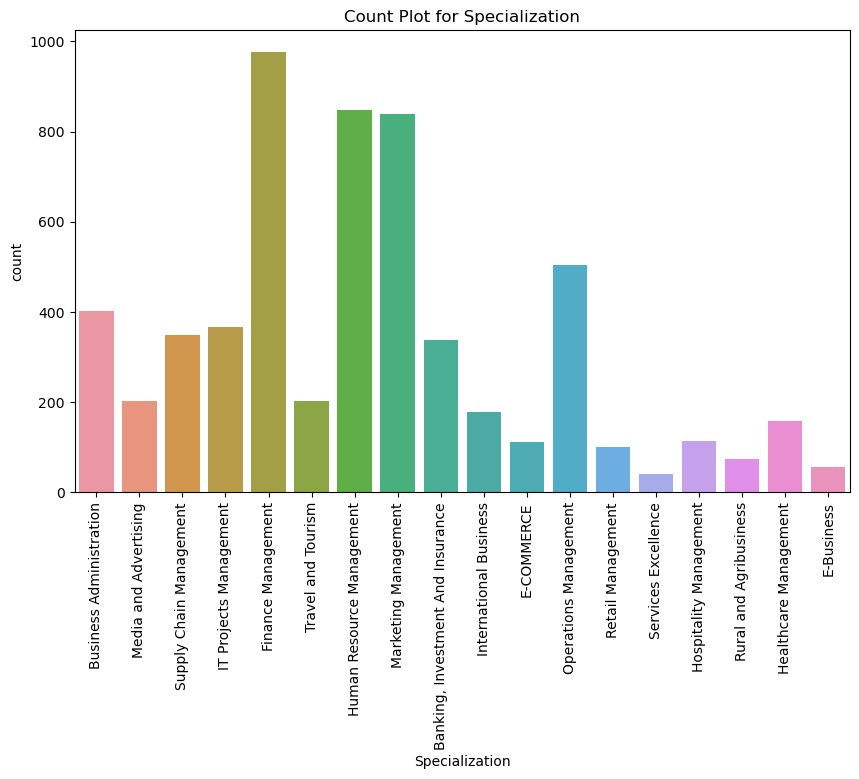

Value Counts for Specialization:
Finance Management                   976
Human Resource Management            848
Marketing Management                 838
Operations Management                503
Business Administration              403
IT Projects Management               366
Supply Chain Management              349
Banking, Investment And Insurance    338
Travel and Tourism                   203
Media and Advertising                203
International Business               178
Healthcare Management                159
Hospitality Management               114
E-COMMERCE                           112
Retail Management                    100
Rural and Agribusiness                73
E-Business                            57
Services Excellence                   40
Name: Specialization, dtype: int64



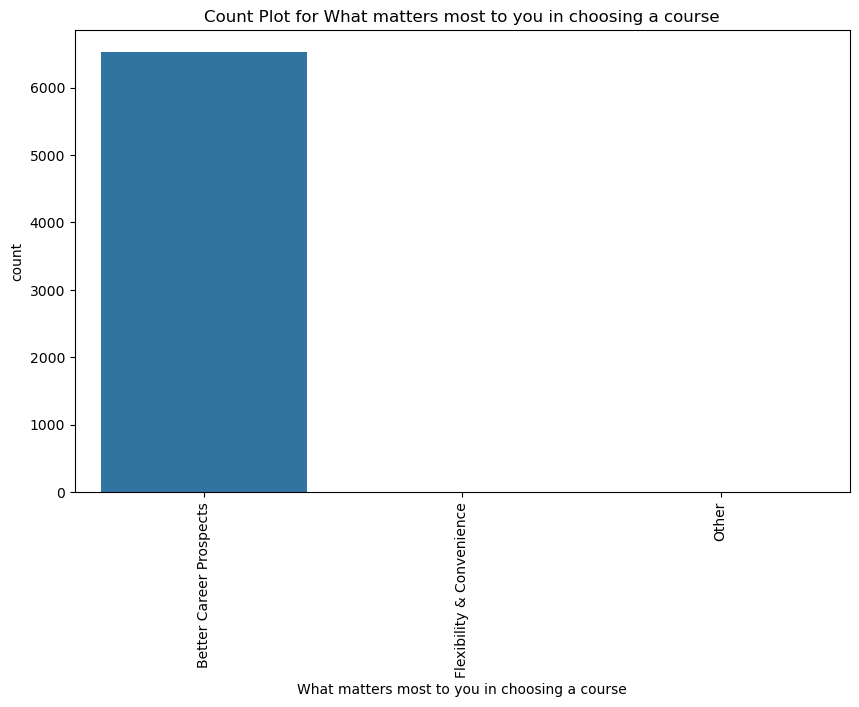

Value Counts for What matters most to you in choosing a course:
Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64



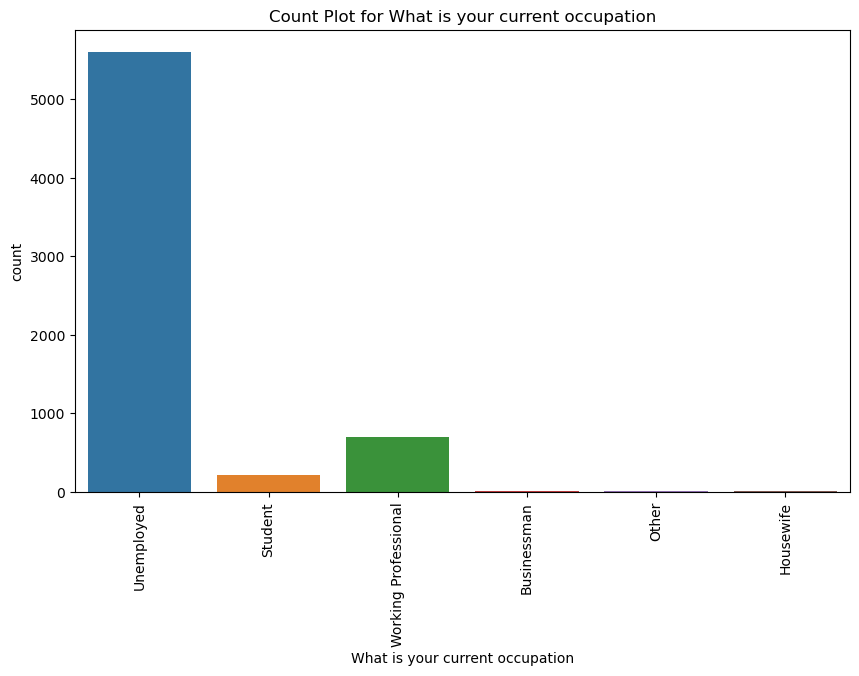

Value Counts for What is your current occupation:
Unemployed              5600
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64



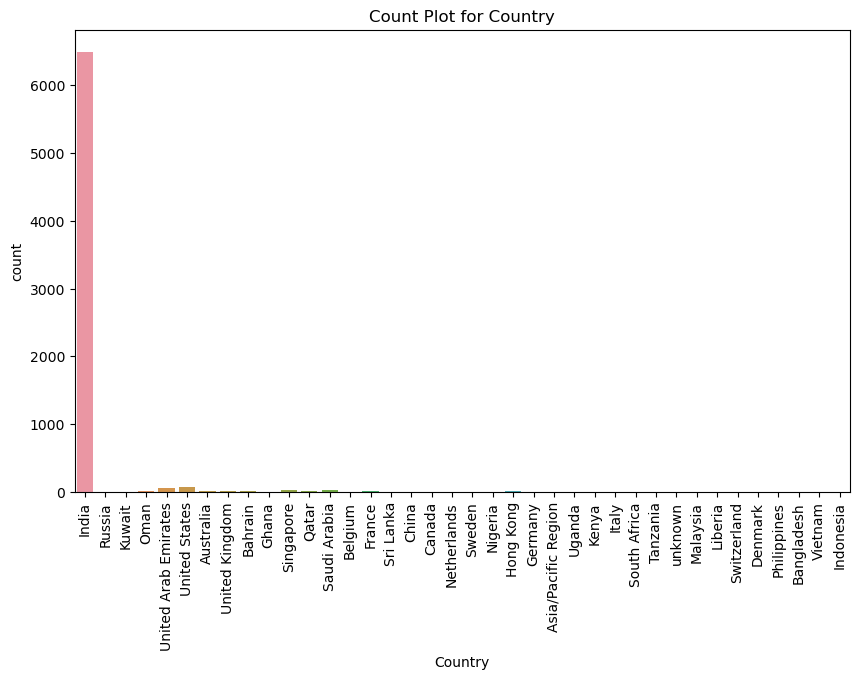

Value Counts for Country:
India                   6492
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia          

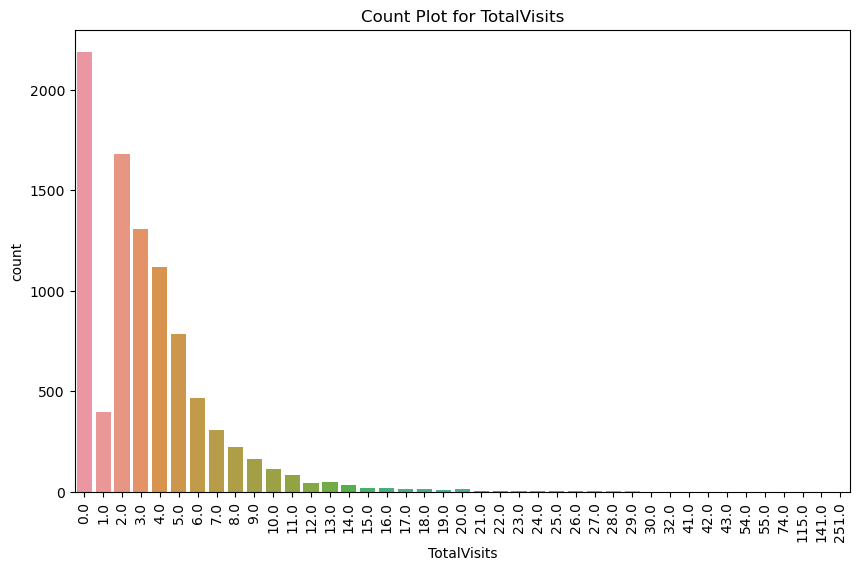

Value Counts for TotalVisits:
0.0      2189
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: TotalVisits, dtype: int64



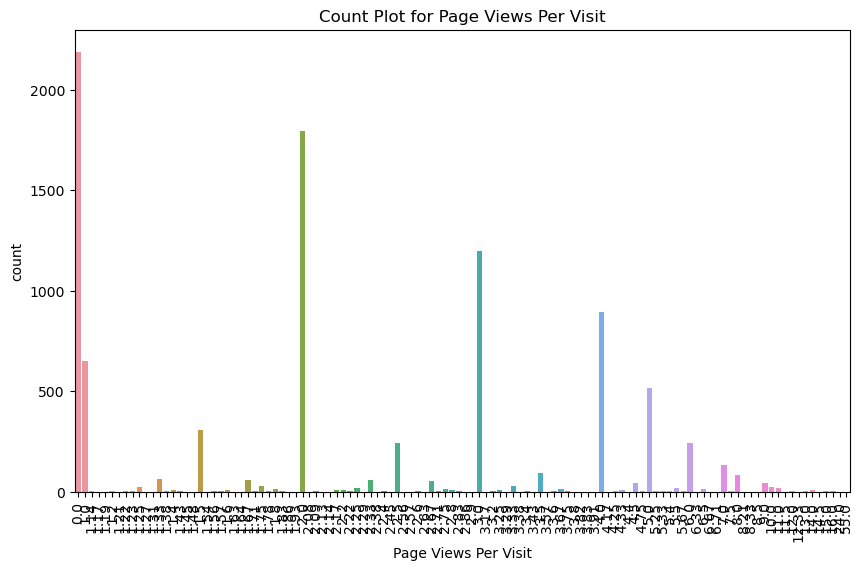

Value Counts for Page Views Per Visit:
0.00    2189
2.00    1795
3.00    1196
4.00     896
1.00     651
        ... 
3.43       1
2.56       1
6.33       1
1.64       1
2.08       1
Name: Page Views Per Visit, Length: 114, dtype: int64



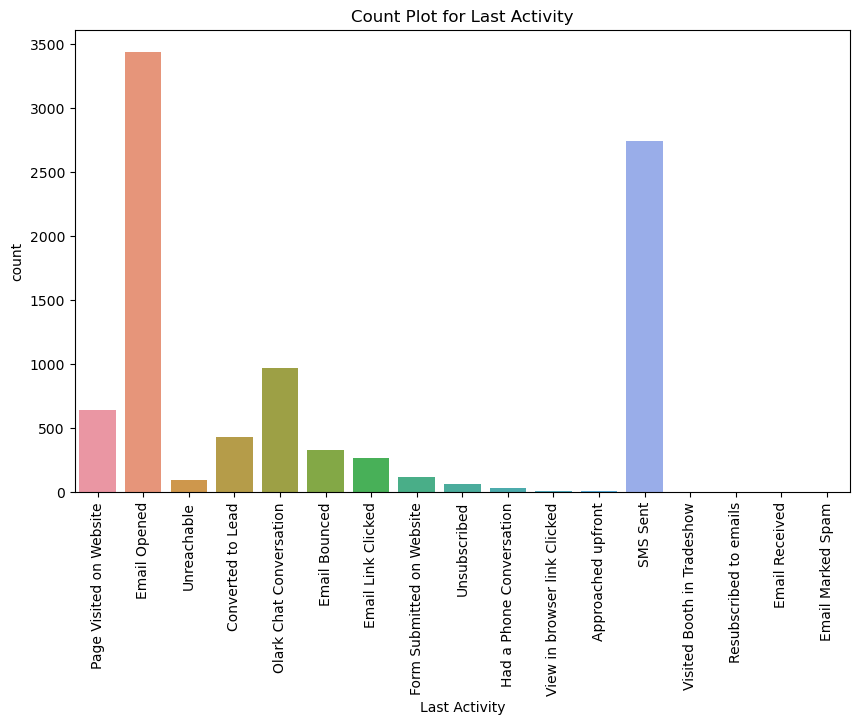

Value Counts for Last Activity:
Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    326
Email Link Clicked               267
Form Submitted on Website        116
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64



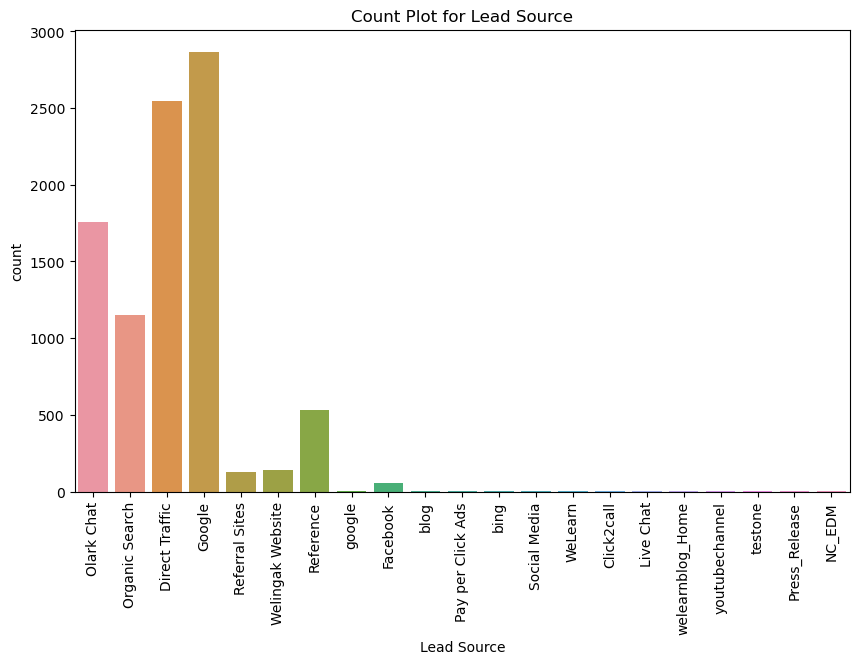

Value Counts for Lead Source:
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64



In [18]:
# countplot of all remaining missing value variables:
# Iterate through the columns
for column in rem_mv:
    # Plot a count plot
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=df)
    plt.title(f'Count Plot for {column}')
    plt.xticks(rotation=90)
    plt.show()

    # Get value counts
    value_counts = df[column].value_counts()
    print(f'Value Counts for {column}:\n{value_counts}\n')

In [19]:
# REMAINING MISSING VALUES

#Specialization                                   36.58
#Tags                                             36.29
#What matters most to you in choosing a course    29.32
#What is your current occupation                  29.11
#Country                                          26.63
#TotalVisits                                       1.48
#Page Views Per Visit                              1.48
#Last Activity                                     1.11
#Lead Source                                       0.39


### E) LETS IMPUTE THE REMAINING MISSING VALUES :

### since there is negligible amount of missing value in the following columns we can ignore thse values:


In [20]:
#TotalVisits                                  1.48
#Page Views Per Visit                         1.48
#Last Activity                                1.11
#Lead Source                                  0.39

In [21]:
# Drop the null value rows in last  4 columns mentioned above: since negligible missing value percentage 
df = df[~pd.isnull(df['TotalVisits'])]
df = df[~pd.isnull(df['Page Views Per Visit'])]
df = df[~pd.isnull(df['Last Activity'])]
df = df[~pd.isnull(df['Lead Source'])]


### F) LETS IMPUTE THE REMAINING MISSING VALUES :  categorical - 

In [22]:
#Tags                                             36.67
#Specialization                                   36.17
#What matters most to you in choosing a course    29.78
#What is your current occupation                  29.57
#Country                                          25.30

#### find the mode value for replacing the missing value in the column - since it is categorical:

In [23]:
# 1. Tags
# find the mode value for replacing the missing value in the column - since it is categorical:
print(df["Tags"].value_counts())
mod = df["Tags"].mode()[0]
print(mod)
# replace mode value to missing value in "Tags" col" 
df["Tags"] = df["Tags"].fillna(mod)

Will revert after reading the email                  2016
Ringing                                              1187
Interested in other courses                           509
Already a student                                     465
Closed by Horizzon                                    301
switched off                                          240
Busy                                                  185
Lost to EINS                                          172
Not doing further education                           145
Interested  in full time MBA                          116
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    25
in touch with EINS                                     12
Lost to Others

In [24]:
# 2. Specialization
# find the mode value for replacing the missing value in the column - since it is categorical:
print(df["Specialization"].value_counts())
mod = df["Specialization"].mode()[0]
print(mod)
# replace mode value to missing value in "Specialization" col
df["Specialization"] = df["Specialization"].fillna(mod)

Finance Management                   959
Human Resource Management            837
Marketing Management                 823
Operations Management                499
Business Administration              399
IT Projects Management               366
Supply Chain Management              346
Banking, Investment And Insurance    335
Travel and Tourism                   202
Media and Advertising                202
International Business               176
Healthcare Management                156
E-COMMERCE                           111
Hospitality Management               111
Retail Management                    100
Rural and Agribusiness                73
E-Business                            57
Services Excellence                   40
Name: Specialization, dtype: int64
Finance Management


In [25]:
#  3. What matters most to you in choosing a course
# find the mode value for replacing the missing value in the column - since it is categorical:
print(df["What matters most to you in choosing a course"].value_counts())
mod = df["What matters most to you in choosing a course"].mode()[0]
print(mod)
# replace mode value to missing value in "What matters most to you in choosing a course" col
df["What matters most to you in choosing a course"] = df["What matters most to you in choosing a course"].fillna(mod)


Better Career Prospects      6370
Flexibility & Convenience       1
Other                           1
Name: What matters most to you in choosing a course, dtype: int64
Better Career Prospects


In [26]:
# 4. What is your current occupation 
# find the mode value for replacing the missing value in the column - since it is categorical:
print(df["What is your current occupation"].value_counts())
mod = df["What is your current occupation"].mode()[0]
print(mod)
# replace mode value to missing value in "What is your current occupation" col
df["What is your current occupation"] = df["What is your current occupation"].fillna(mod)


Unemployed              5476
Working Professional     677
Student                  206
Other                     15
Housewife                  9
Businessman                8
Name: What is your current occupation, dtype: int64
Unemployed


In [27]:
# 5. Country
# find the mode value for replacing the missing value in the column - since it is categorical:
print(df["Country"].value_counts())
mod = df["Country"].mode()[0]
print(mod)
# replace mode value to missing value in "Country" col
df["Country"] = df["Country"].fillna(mod)


India                   6491
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malaysia      

### G) FINALLY RE-CHECK  THE MISSING VALUES PERCETANGE

In [28]:
# After dropping columns - Again Re-check  the missing values percetange in descending order of each column of telecom
null_per = (df.isnull().mean() * 100).sort_values(ascending=False)
round(null_per,2)

Prospect ID                                      0.0
Search                                           0.0
A free copy of Mastering The Interview           0.0
I agree to pay the amount through cheque         0.0
Get updates on DM Content                        0.0
Update me on Supply Chain Content                0.0
Tags                                             0.0
Receive More Updates About Our Courses           0.0
Through Recommendations                          0.0
Digital Advertisement                            0.0
Newspaper                                        0.0
X Education Forums                               0.0
Newspaper Article                                0.0
Magazine                                         0.0
What matters most to you in choosing a course    0.0
Lead Number                                      0.0
What is your current occupation                  0.0
Specialization                                   0.0
Country                                       

### Now the data doesn't have any missing values. 

In [29]:
print(len(df.index))
print(len(df.index)/9240)

9074
0.982034632034632


### H) THIRD SET OF DROP OF COLUMNS - ID columns

#### Let's drop ID columns from df for furthr analysis

In [30]:
# id_cols = ["Lead Number","Prospect ID"]

In [31]:
df = df.drop(["Lead Number","Prospect ID"] , axis = 1)

In [32]:
df.shape

(9074, 27)

### we might drop columns after after uni,bi,multi variate analysis -  depending on its insights and importance.

# STEP 4: EDA

In [33]:
# extract the numerical columns from df:
num_cols = ["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]
len(num_cols)

3

In [34]:
# extract the categorical columns from df:

cat_cols = [ 'Lead Origin', 'Lead Source','Do Not Email', 'Do Not Call', 'Converted',
      'Last Activity','Country', 'Specialization', 'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity']
len(cat_cols )

24

# 1. UNIVARIATE ANALYSIS:-

### A) BOXPLOT OF ALL NUMERICAL VARIABLES:

TotalVisits


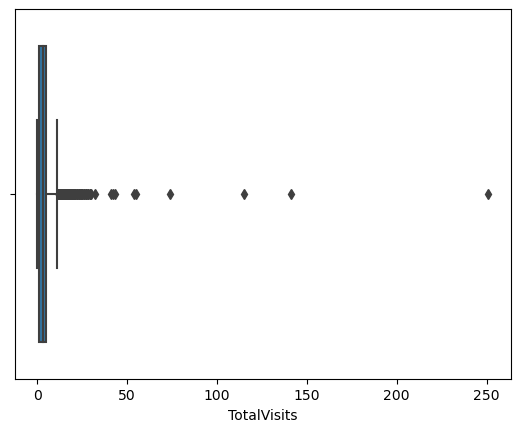

Total Time Spent on Website


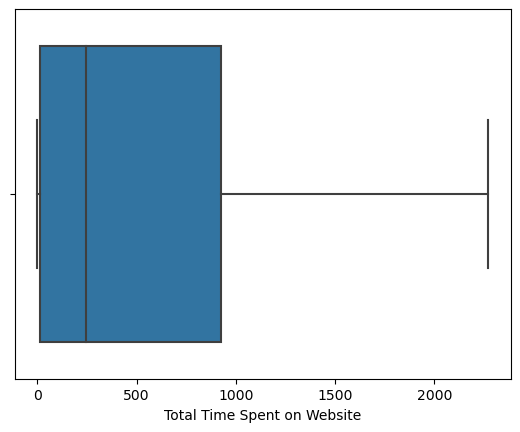

Page Views Per Visit


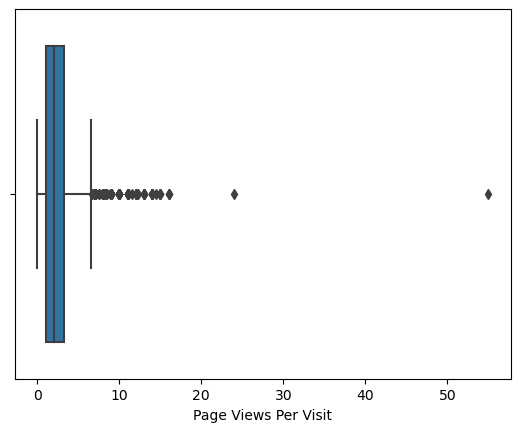

In [35]:
for i in num_cols:
    print(i)
    sns.boxplot(x=df[i])
    plt.show()

### OUTLIERS TREATMENT FOR NUMERICAL COLUMNS - CAP OUTLIERS


#### 1. for 'TotalVisits'

In [36]:
import pandas as pd

Q1 = df['TotalVisits'].quantile(0.25)
Q3 = df['TotalVisits'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap outliers
df['TotalVisits'] = df['TotalVisits'].clip(lower=lower_bound, upper=upper_bound)


#### 2. 'Page Views Per Visit'

In [37]:
import pandas as pd

Q1 = df['Page Views Per Visit'].quantile(0.25)
Q3 = df['Page Views Per Visit'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap outliers
df['Page Views Per Visit'] = df['Page Views Per Visit'].clip(lower=lower_bound, upper=upper_bound)


TotalVisits


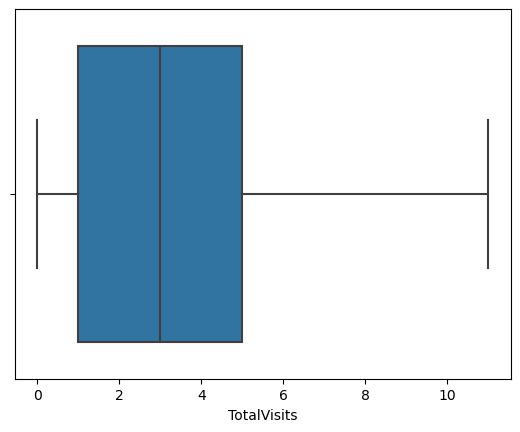

Total Time Spent on Website


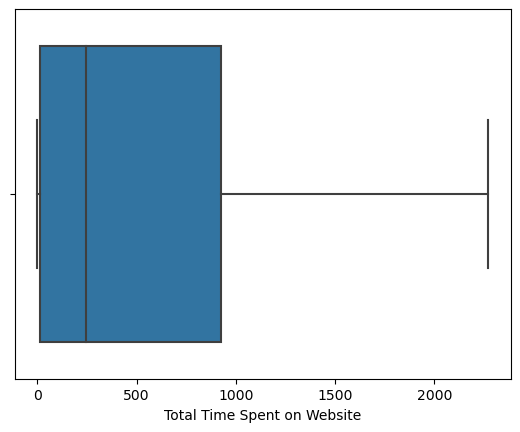

Page Views Per Visit


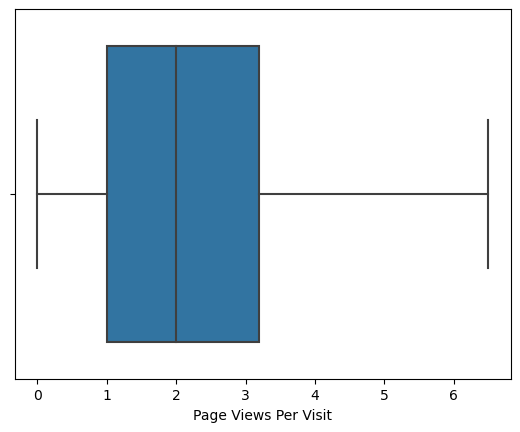

In [38]:
# recheck the nunerical columns boxplot after outliers treatment - 
for i in num_cols:
    print(i)
    sns.boxplot(x=df[i])
    plt.show()
    

### B)  HISTOGRAM -  TO SEE THE DISTRIBUTION OF ALL NUMERICAL VARIABLES:

TotalVisits


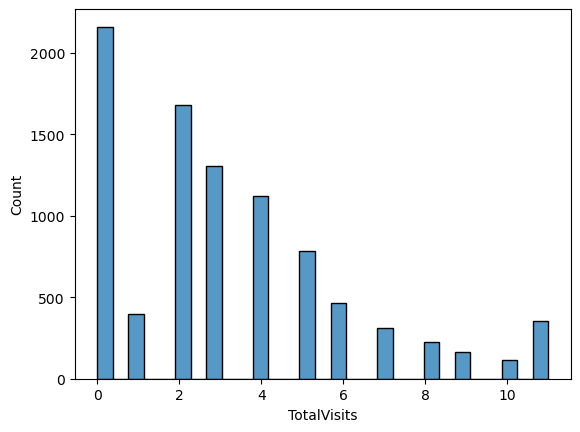

Total Time Spent on Website


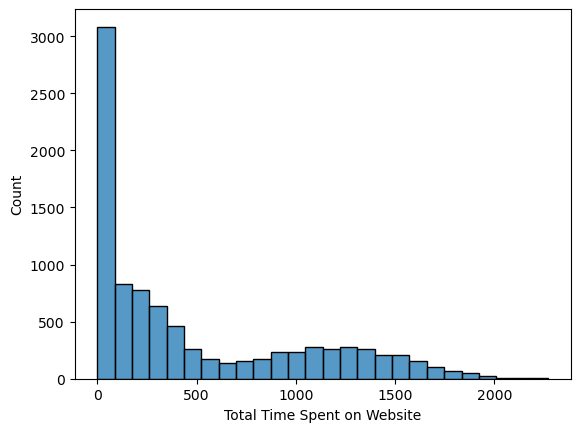

Page Views Per Visit


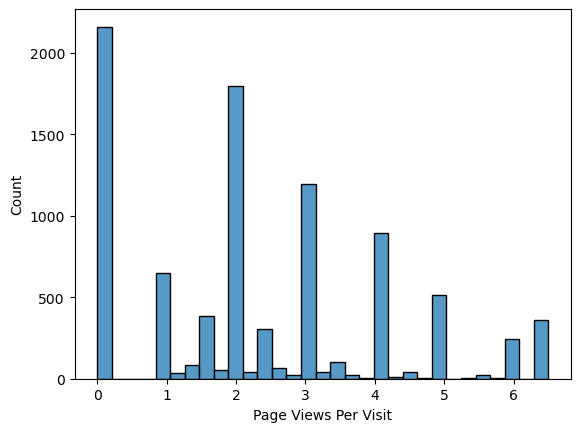

In [39]:
#Checking all numerical Variables and their count values in histogram -  to see the distribution:
for i in num_cols:
    print(i)
    sns.histplot(df[i])
    plt.show()

### C) # COUNTPLOT OF ALL CATEGORICAL VARIABLES:

Lead Origin


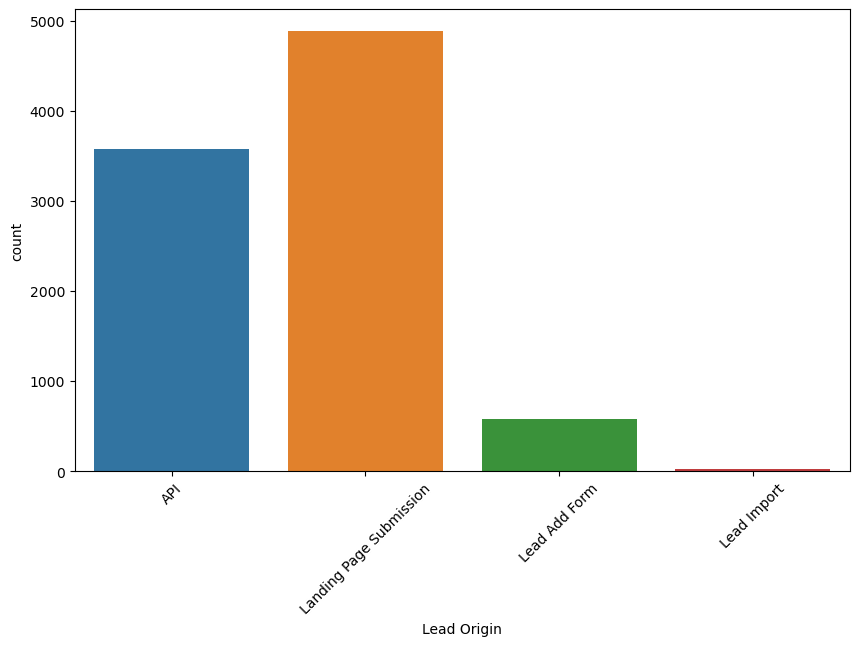

Lead Source


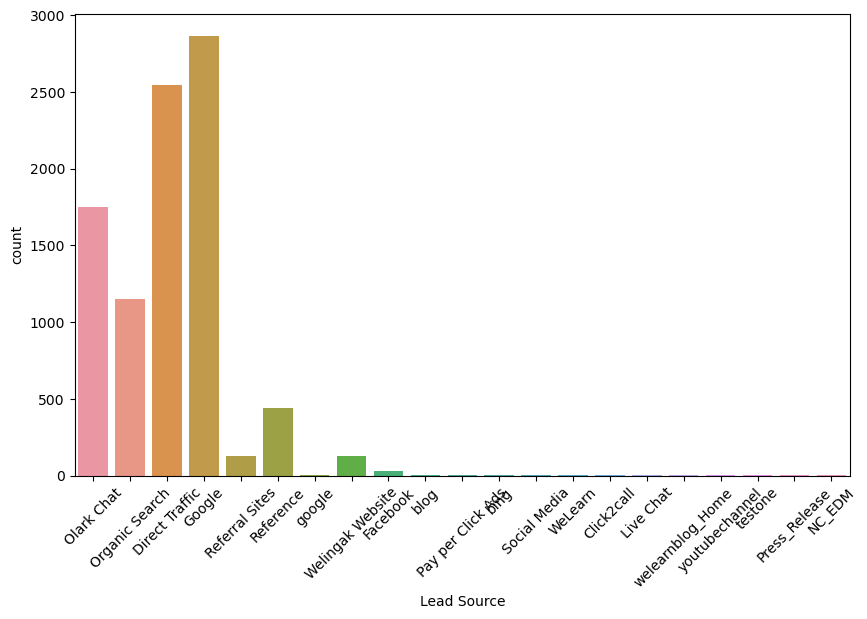

Do Not Email


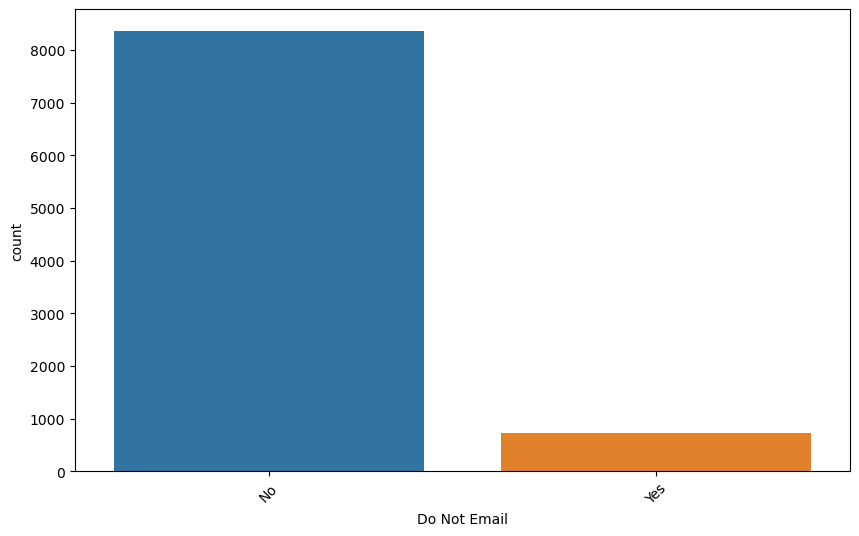

Do Not Call


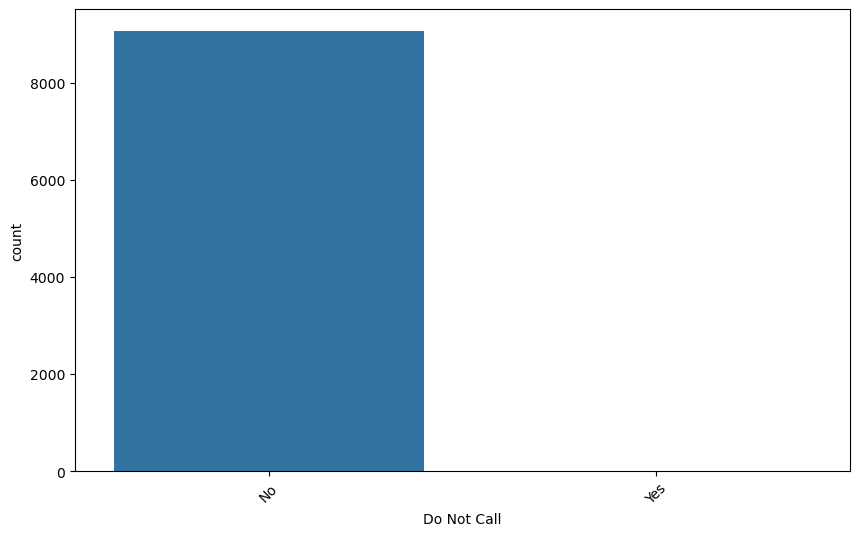

Converted


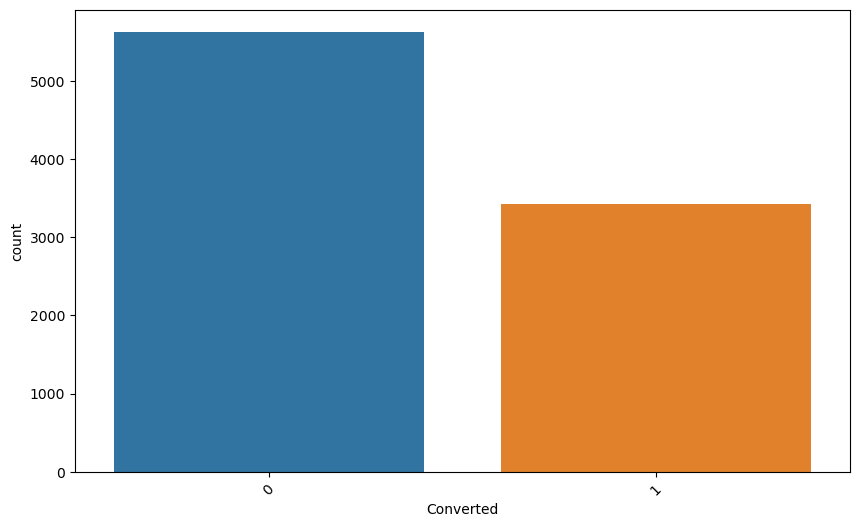

Last Activity


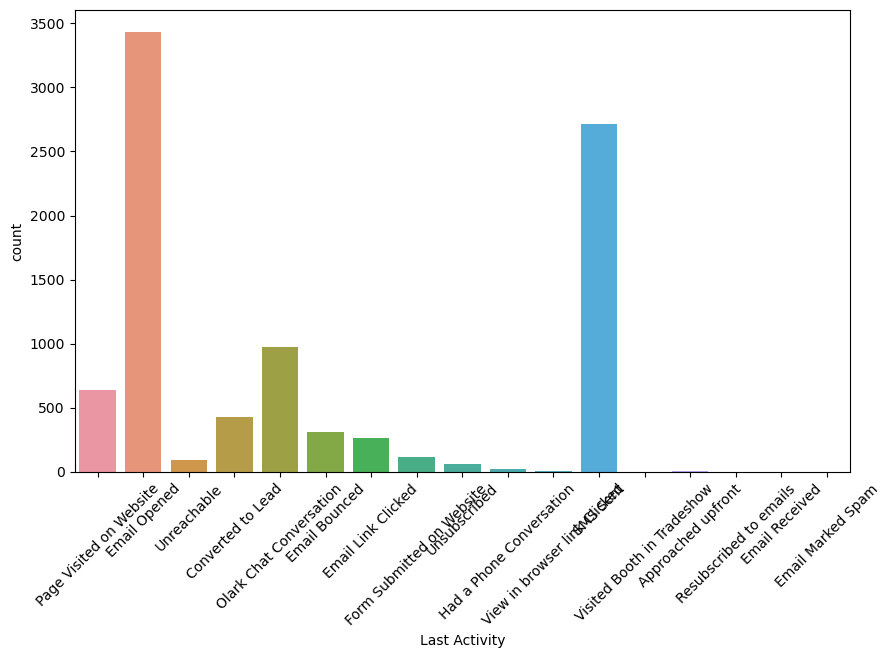

Country


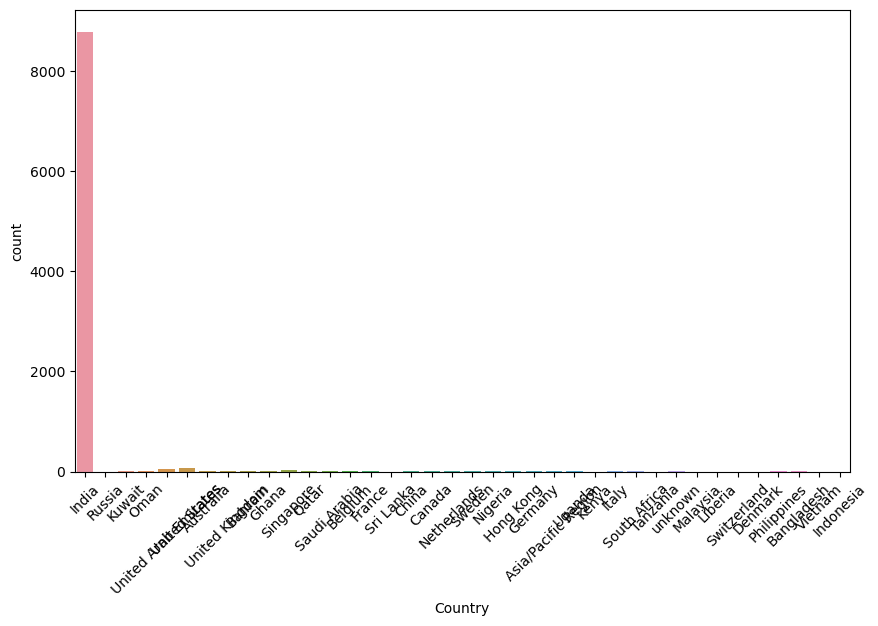

Specialization


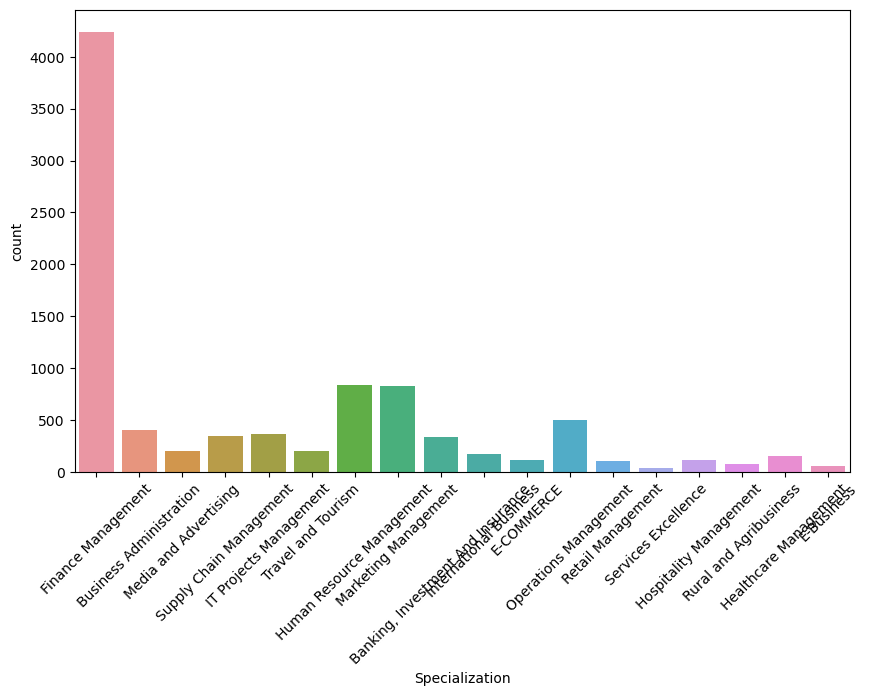

What is your current occupation


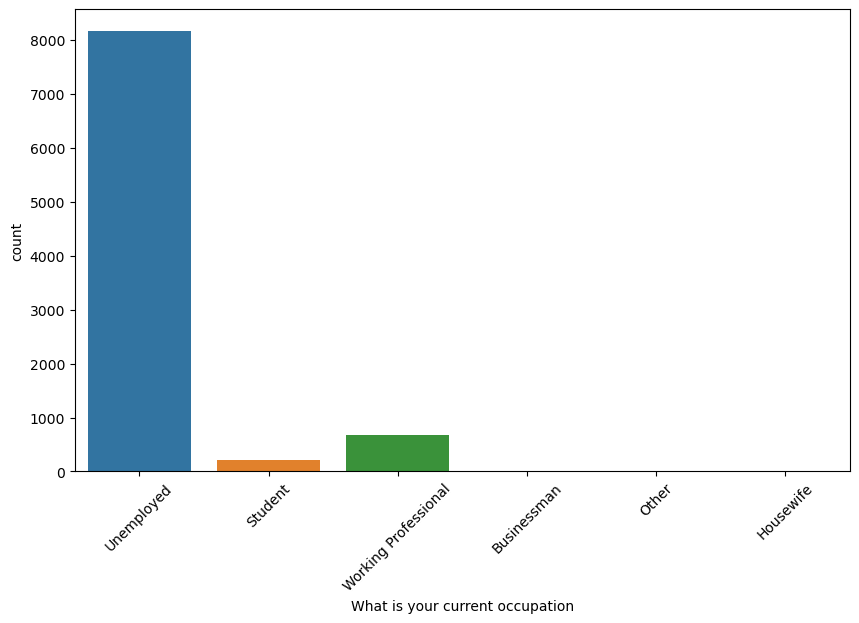

What matters most to you in choosing a course


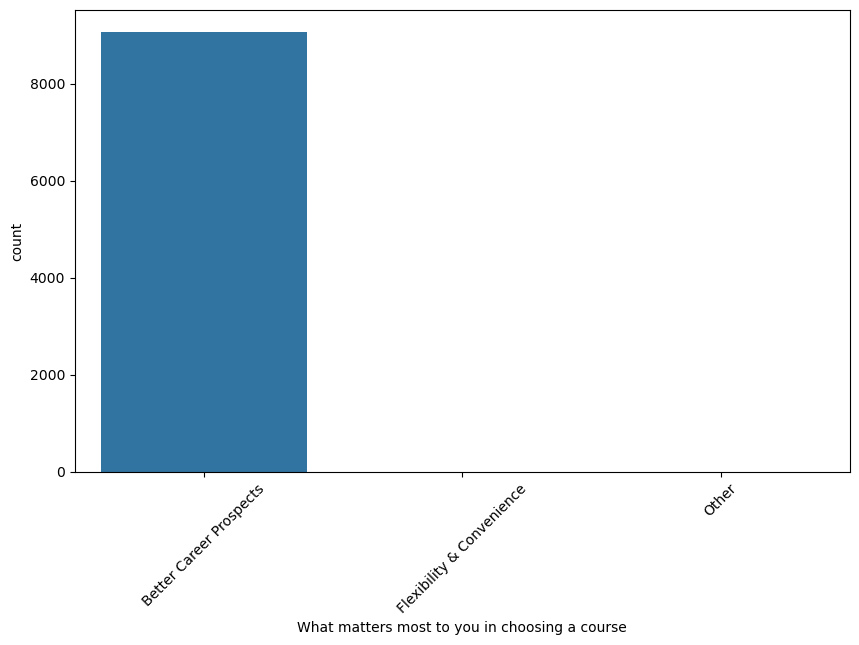

Search


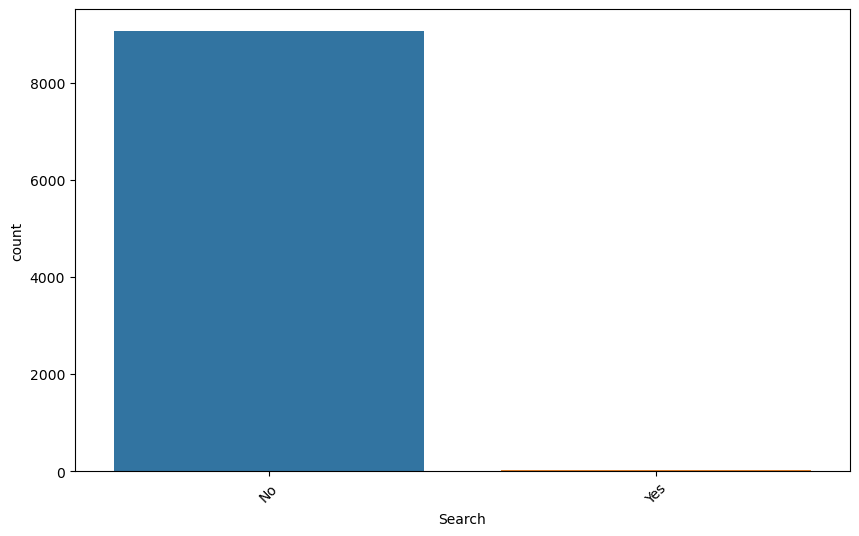

Magazine


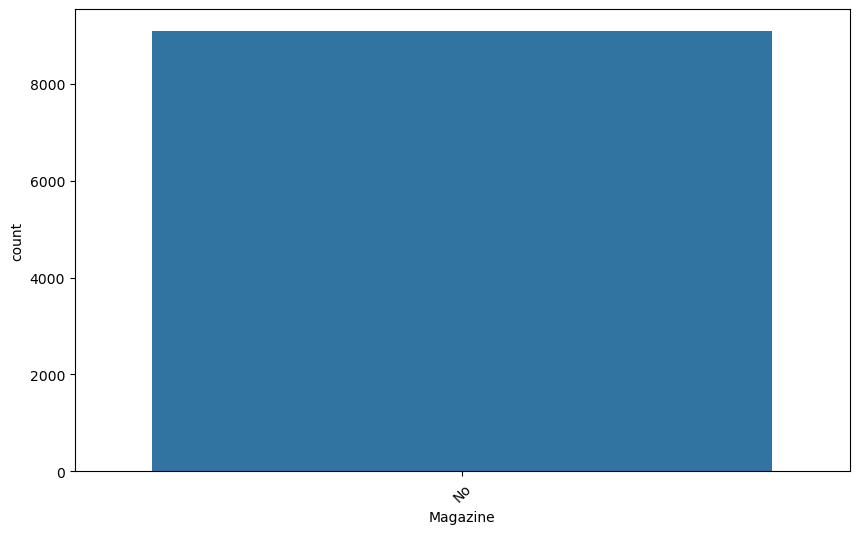

Newspaper Article


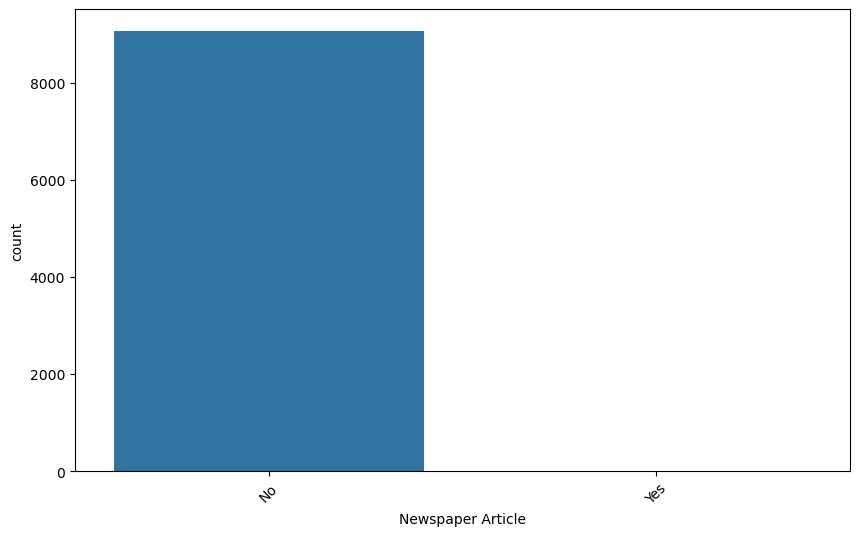

X Education Forums


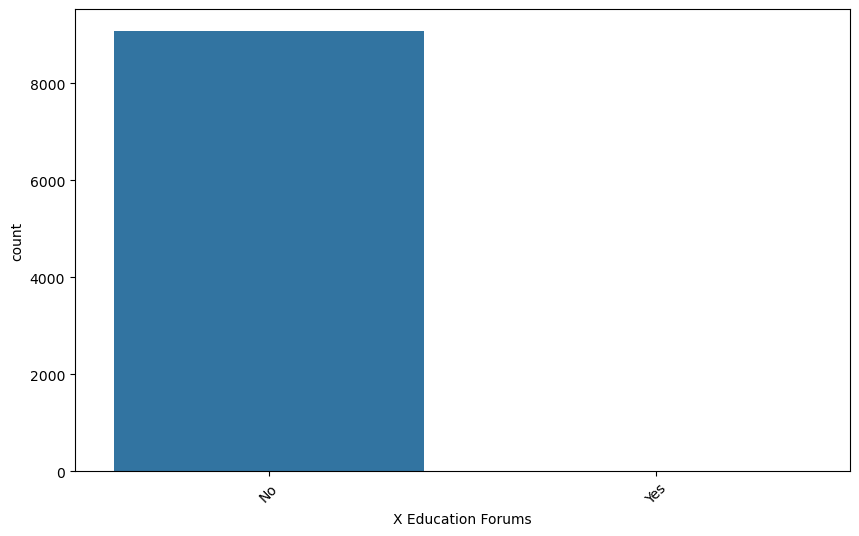

Newspaper


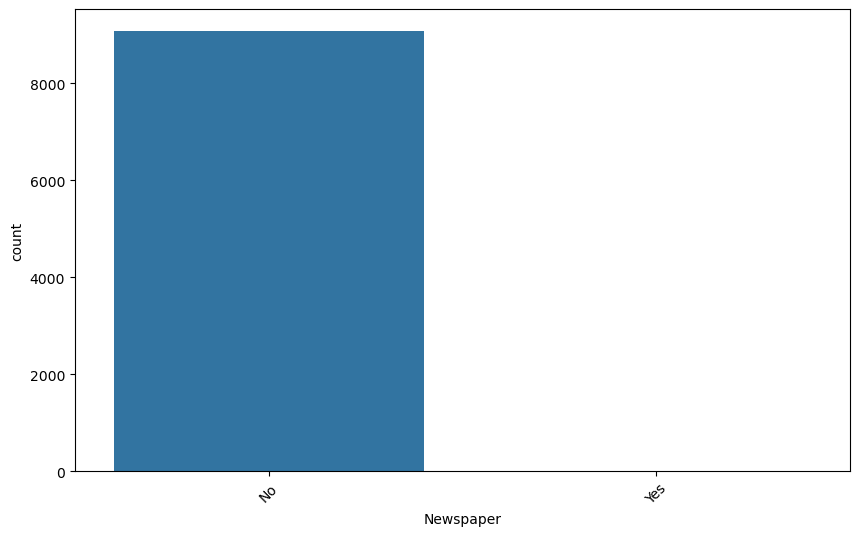

Digital Advertisement


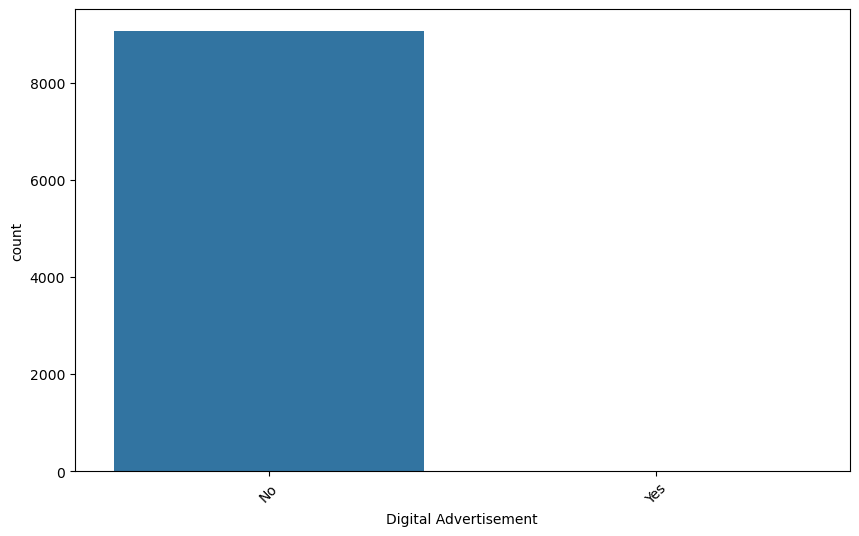

Through Recommendations


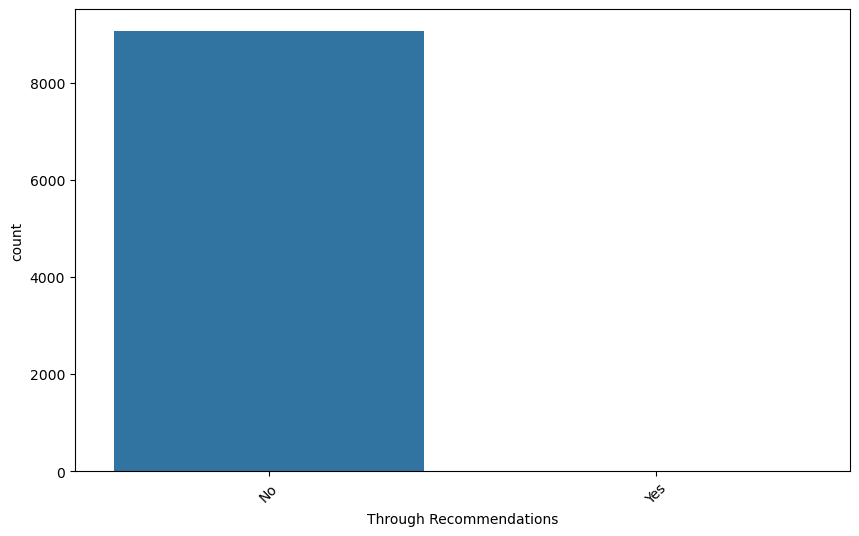

Receive More Updates About Our Courses


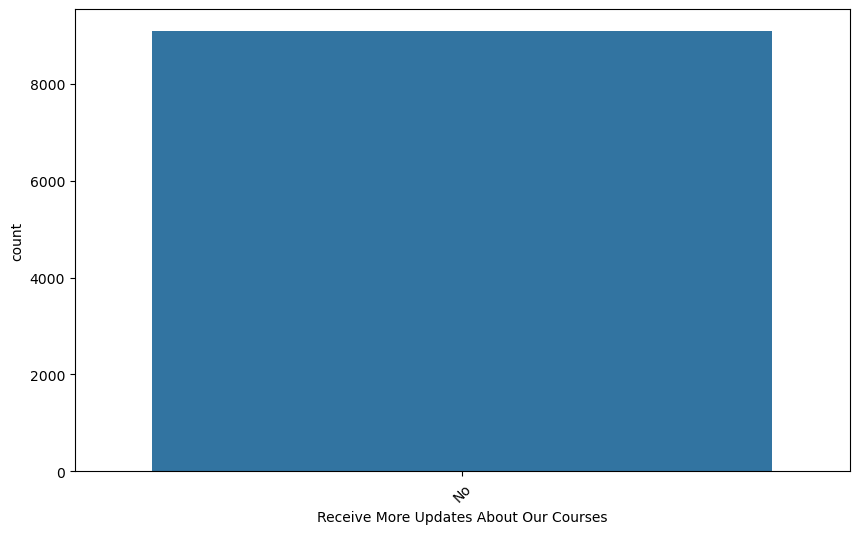

Tags


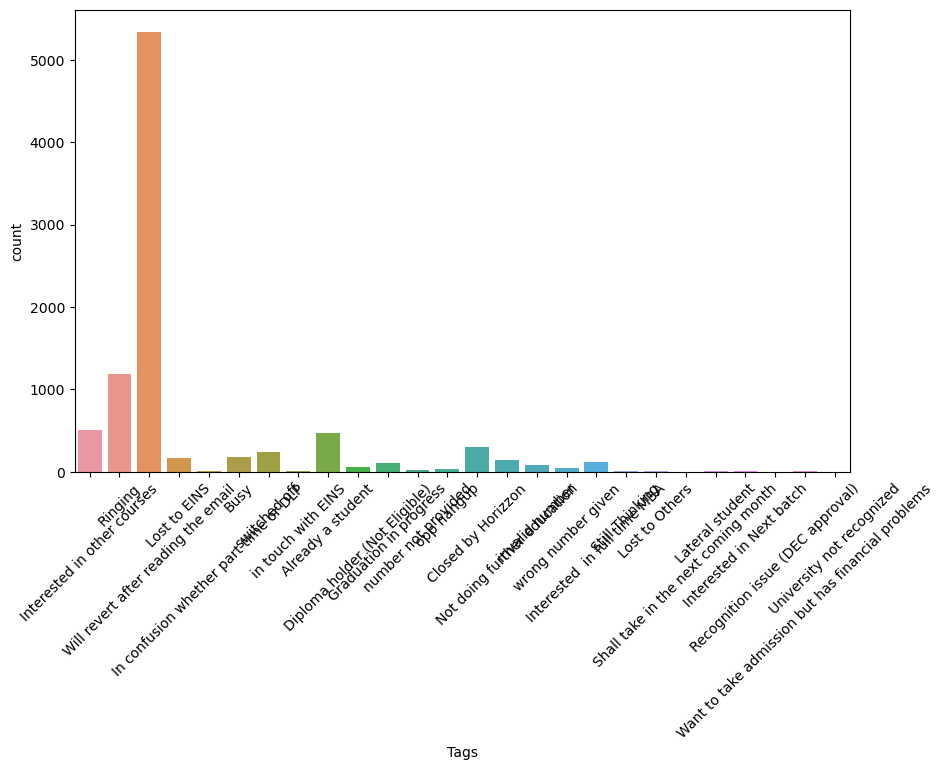

Update me on Supply Chain Content


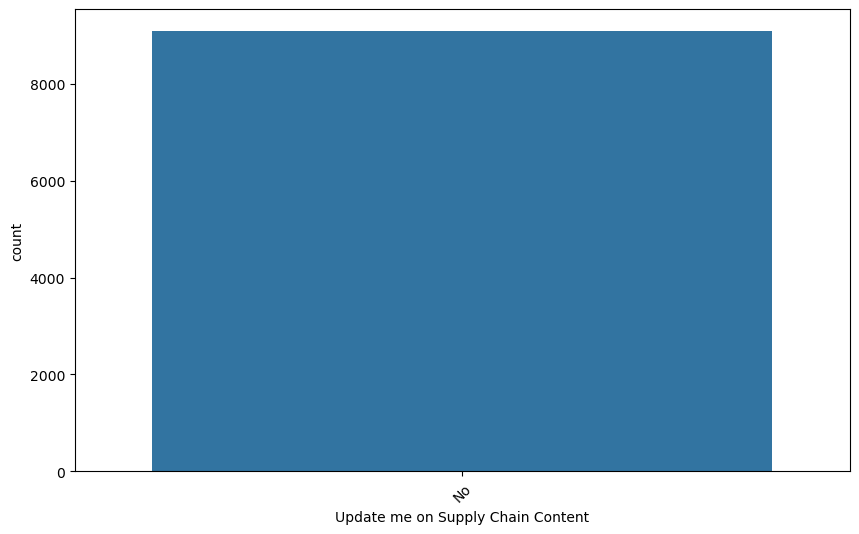

Get updates on DM Content


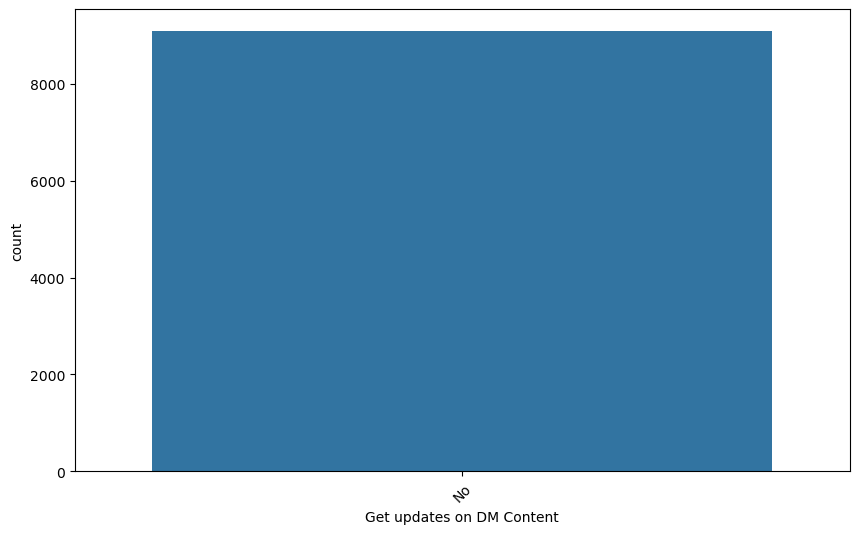

I agree to pay the amount through cheque


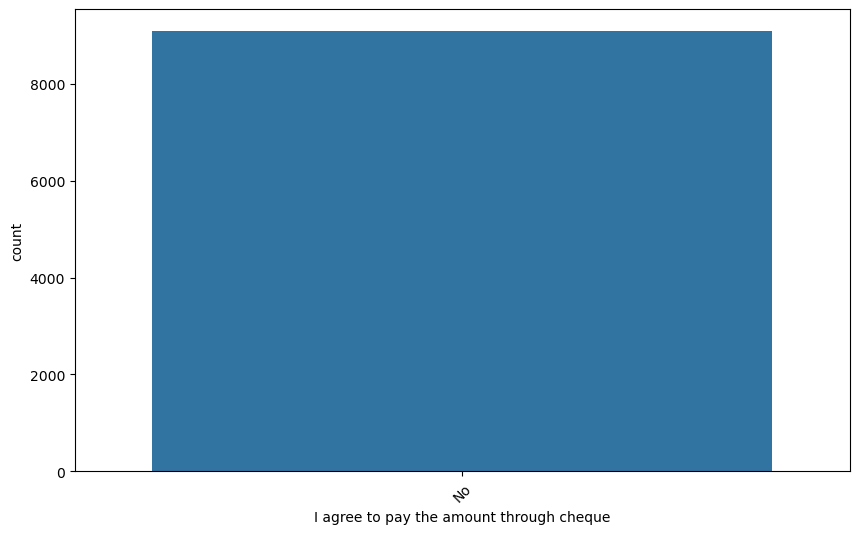

A free copy of Mastering The Interview


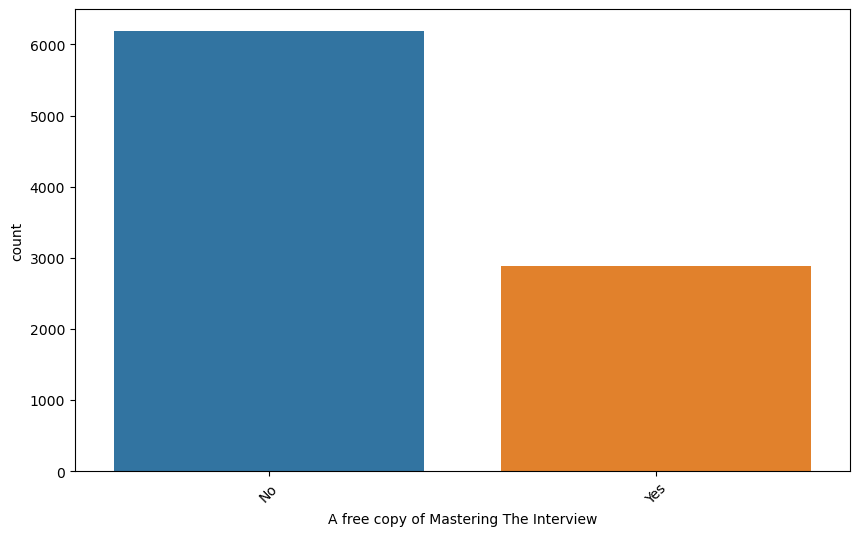

Last Notable Activity


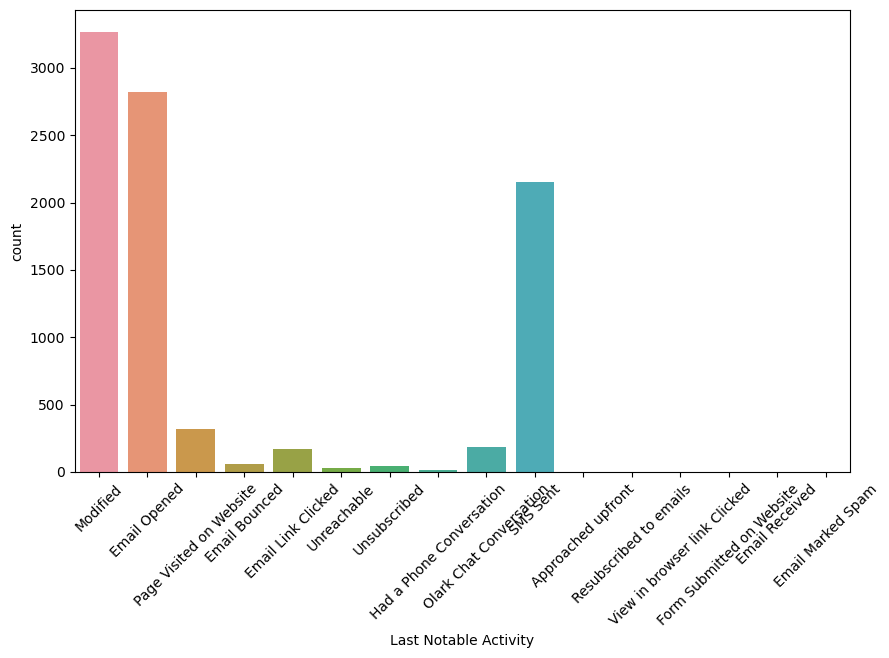

In [40]:
# countplot of all categorical variables:
for i in cat_cols:
    print(i)
    plt.figure(figsize=(10, 6))
    sns.countplot(df[i])
    plt.xticks(rotation=45)  
    plt.show()

## 2. BIVARIATE ANALYSIS:

### D) CREATE BOX PLOTS FOR THE RELATIONSHIP BETWEEN NUMERICAL AND CATEGORICAL VARIABLES.

boxplot TotalVisits Vs Lead Origin


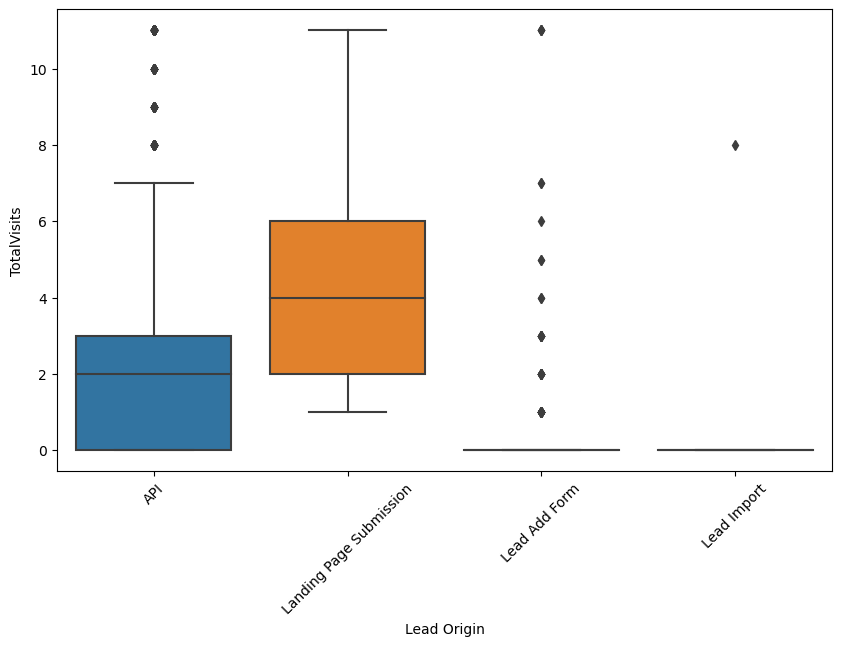

boxplot TotalVisits Vs Lead Source


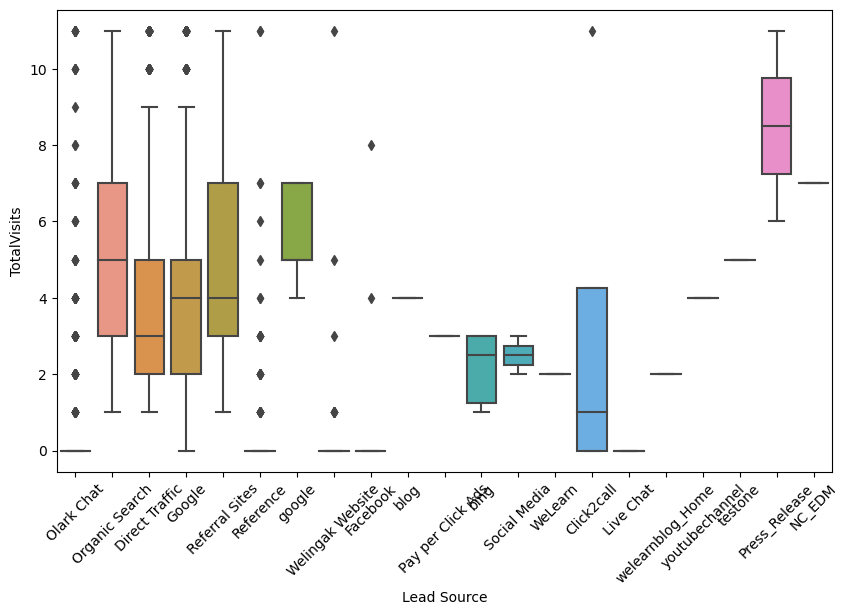

boxplot TotalVisits Vs Do Not Email


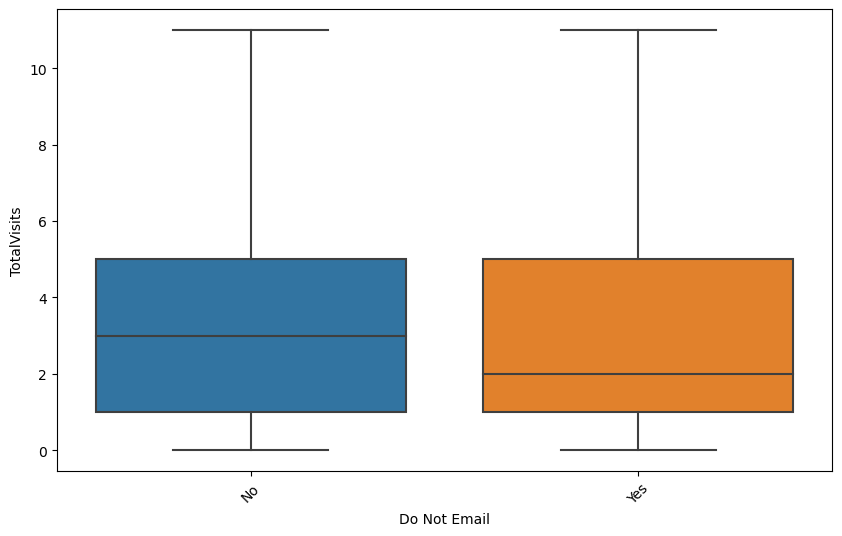

boxplot TotalVisits Vs Do Not Call


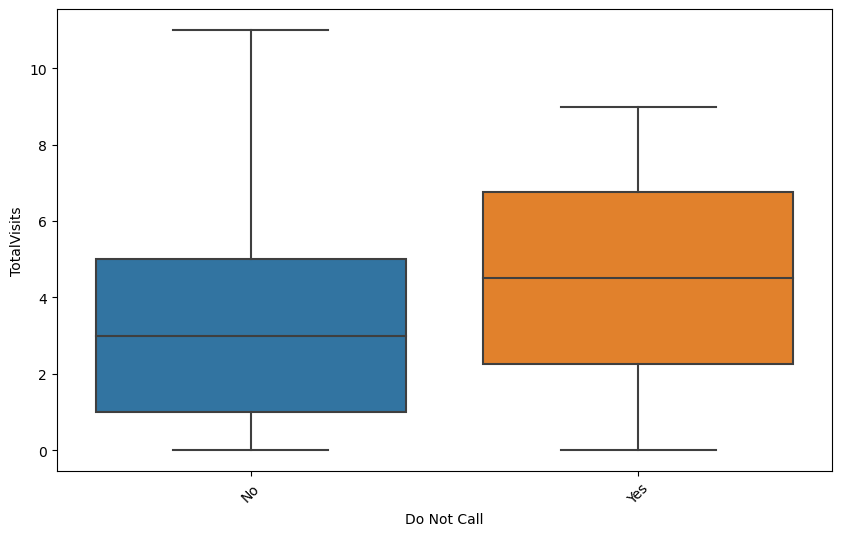

boxplot TotalVisits Vs Converted


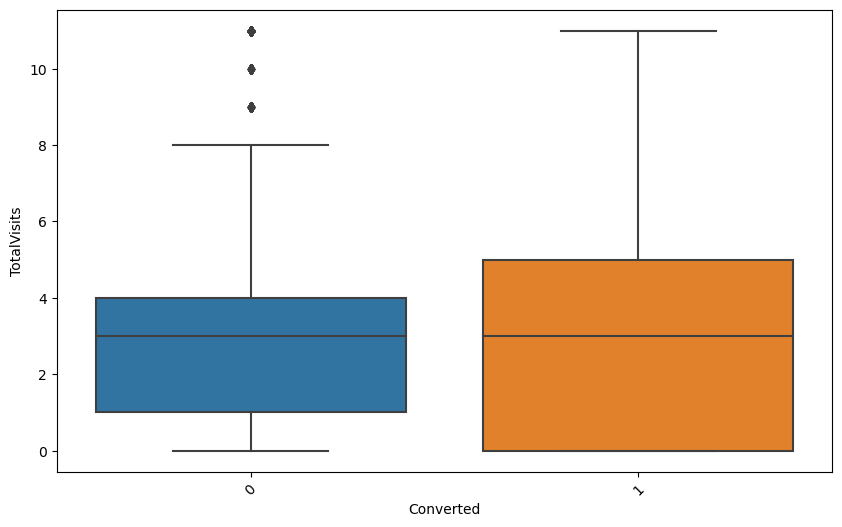

boxplot TotalVisits Vs Last Activity


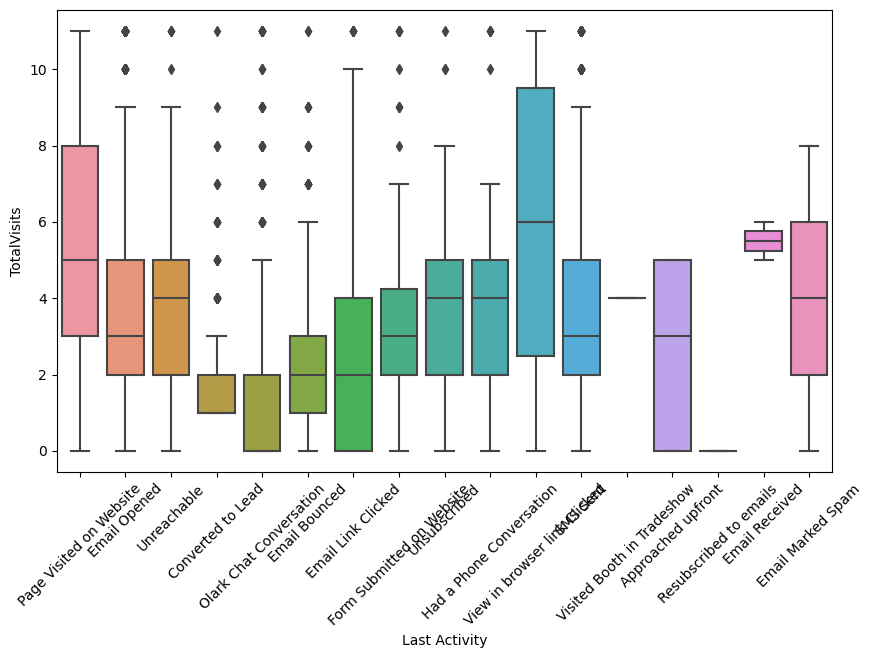

boxplot TotalVisits Vs Country


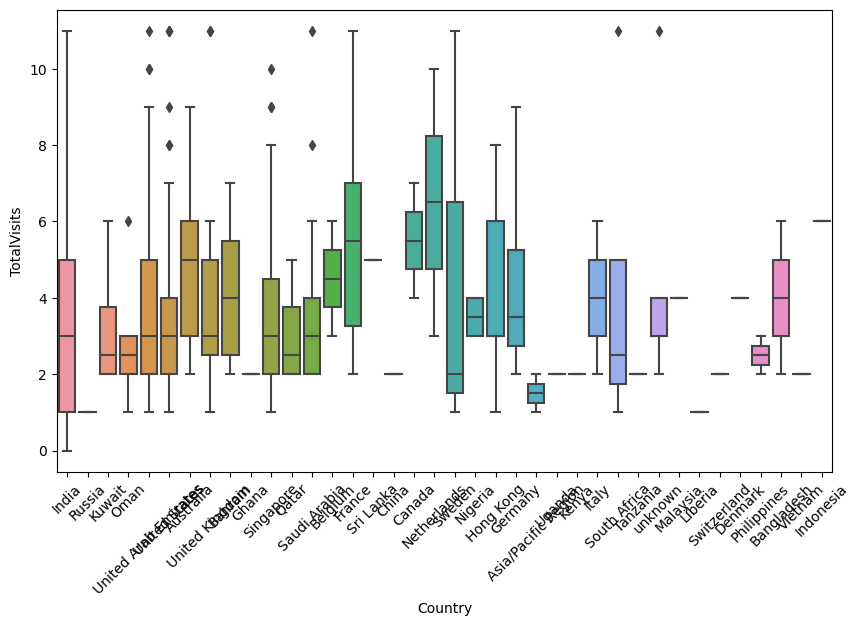

boxplot TotalVisits Vs Specialization


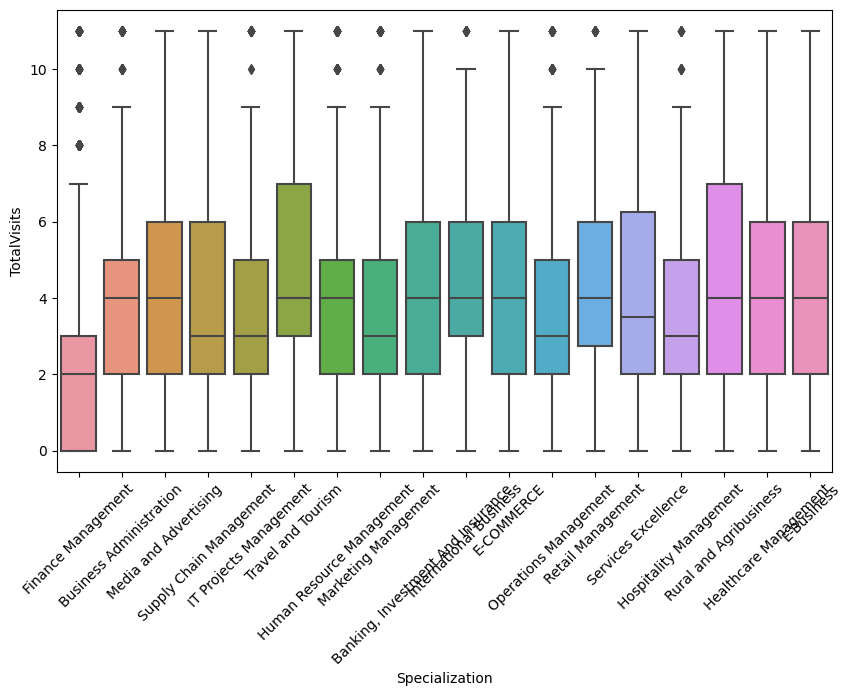

boxplot TotalVisits Vs What is your current occupation


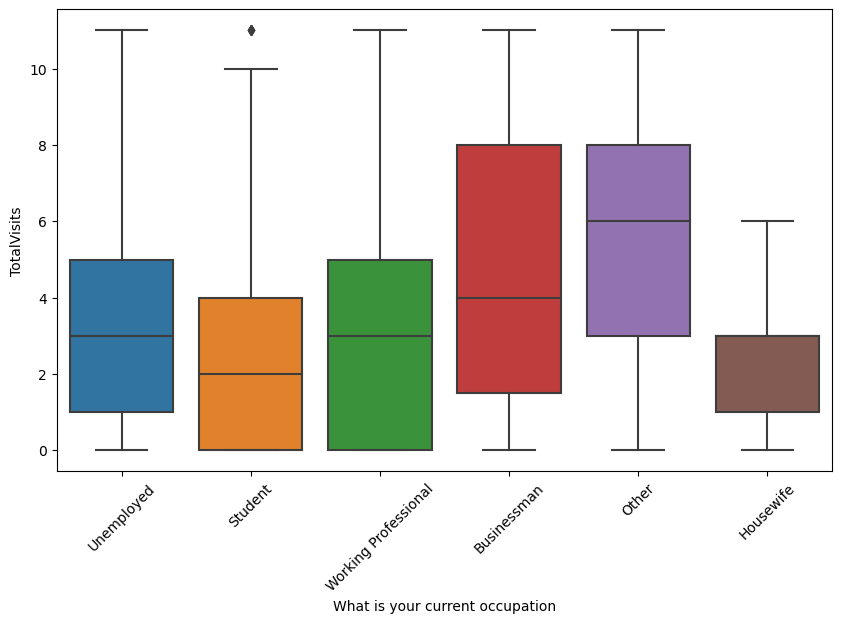

boxplot TotalVisits Vs What matters most to you in choosing a course


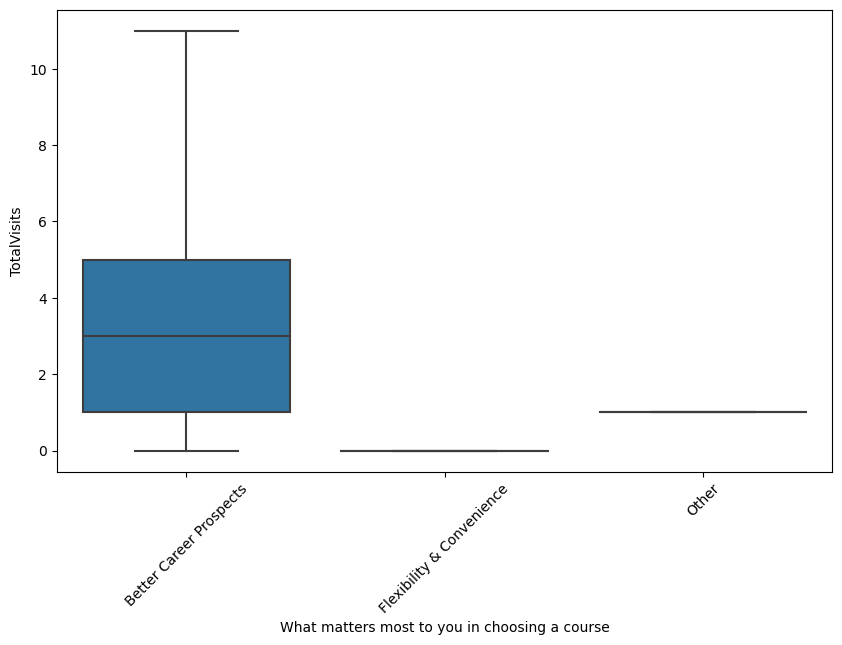

boxplot TotalVisits Vs Search


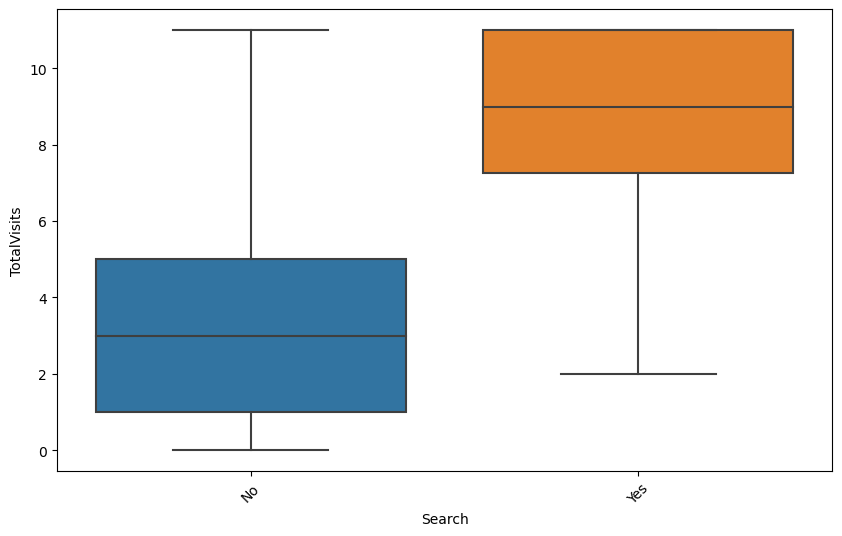

boxplot TotalVisits Vs Magazine


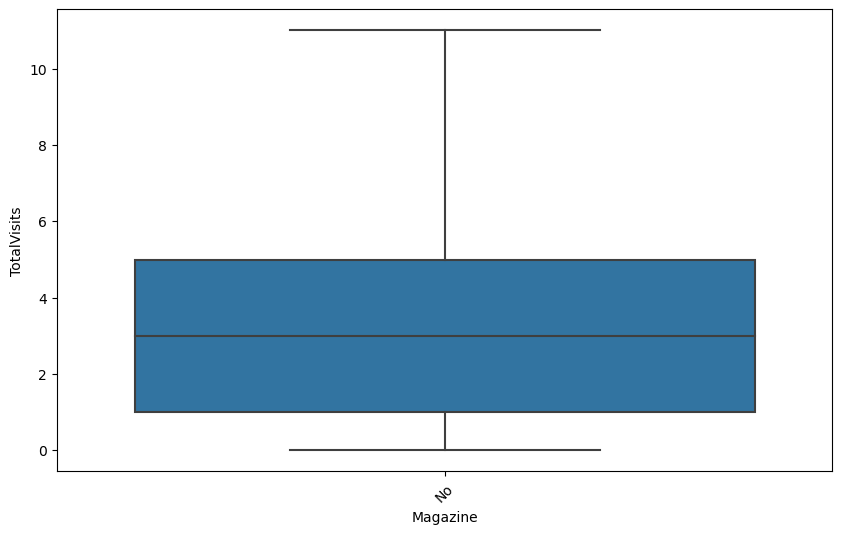

boxplot TotalVisits Vs Newspaper Article


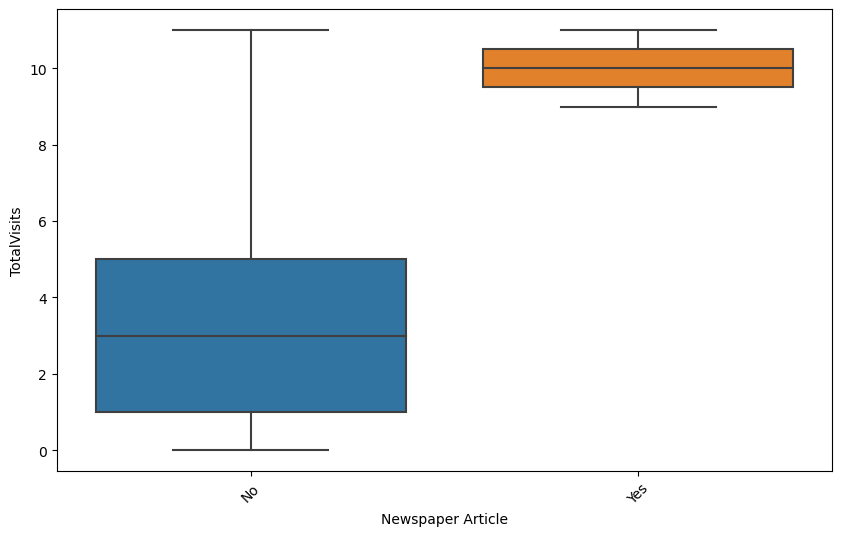

boxplot TotalVisits Vs X Education Forums


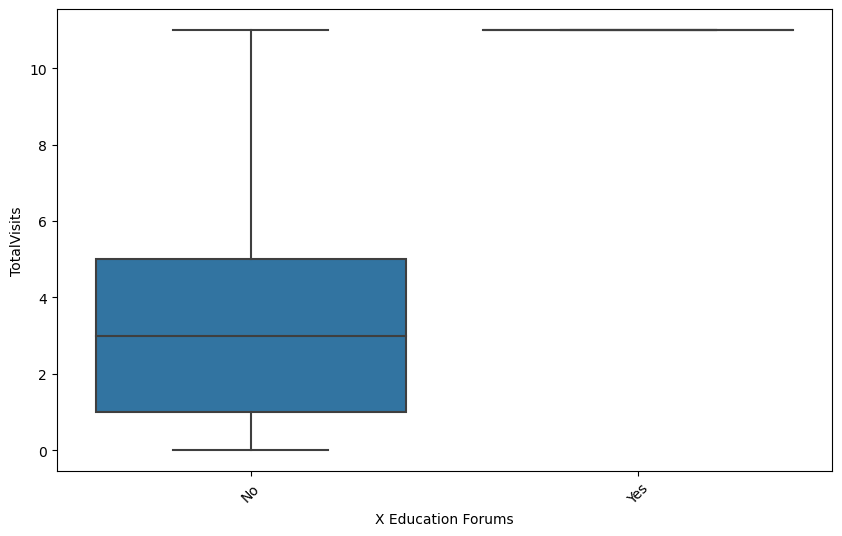

boxplot TotalVisits Vs Newspaper


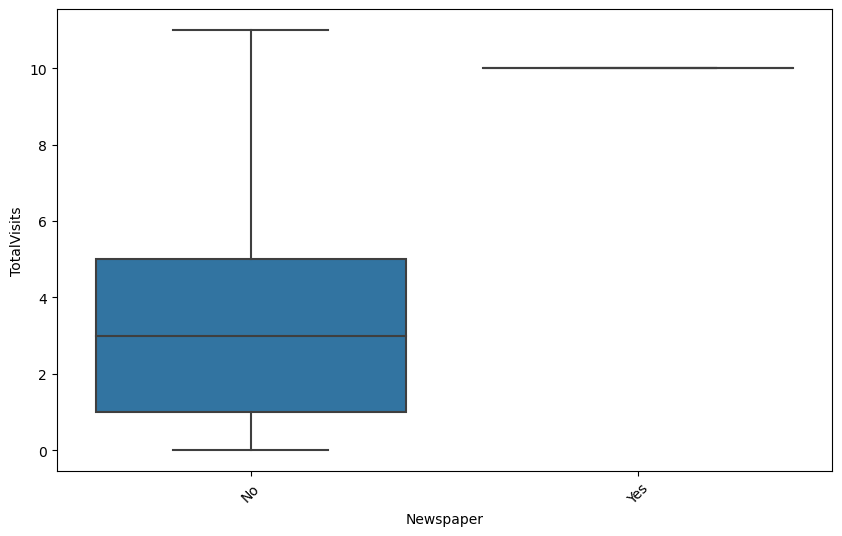

boxplot TotalVisits Vs Digital Advertisement


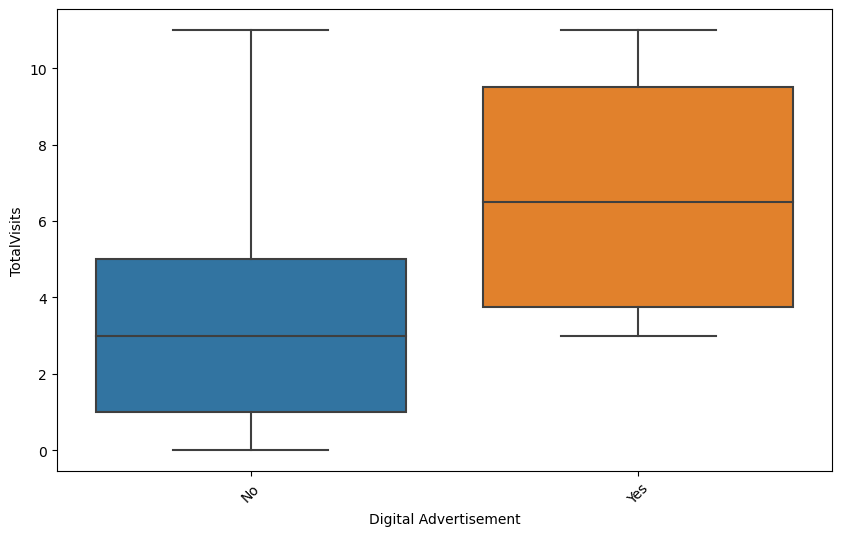

boxplot TotalVisits Vs Through Recommendations


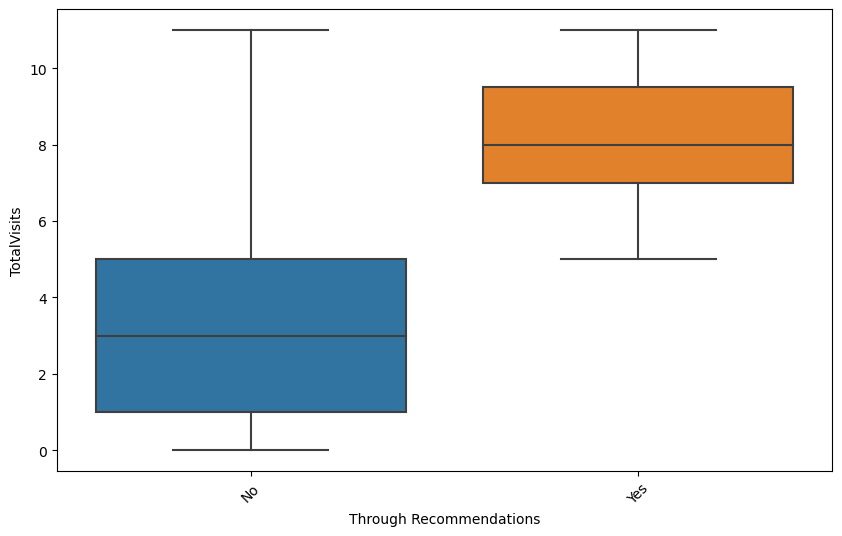

boxplot TotalVisits Vs Receive More Updates About Our Courses


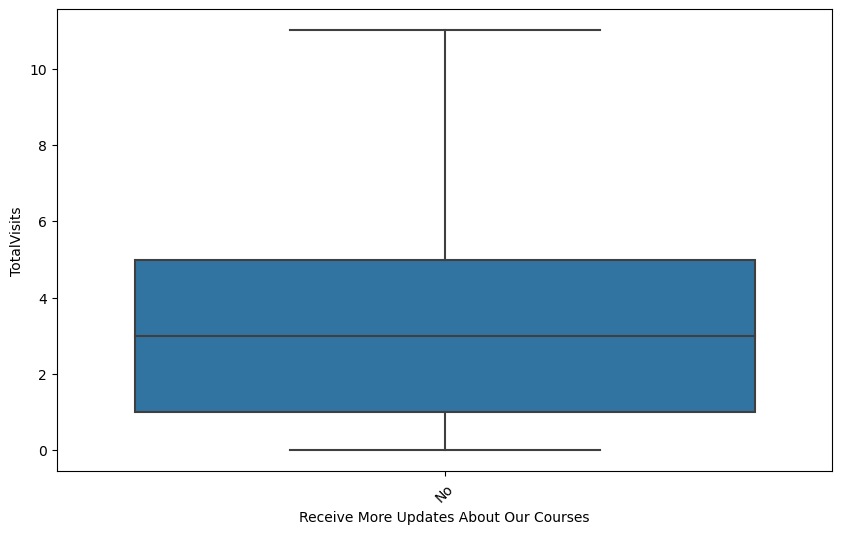

boxplot TotalVisits Vs Tags


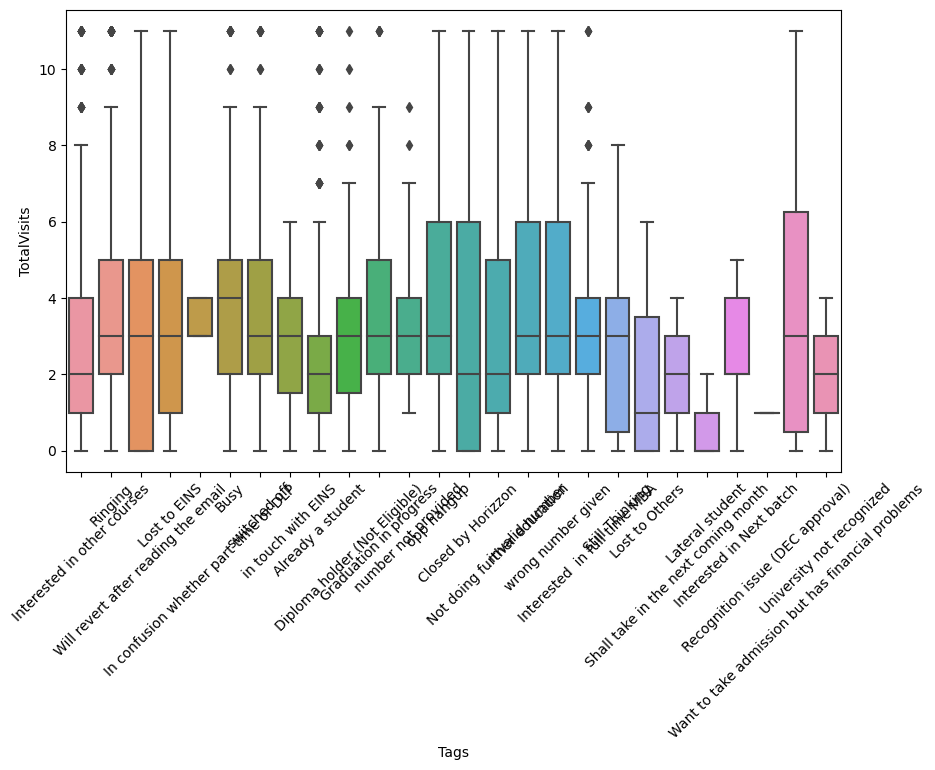

boxplot TotalVisits Vs Update me on Supply Chain Content


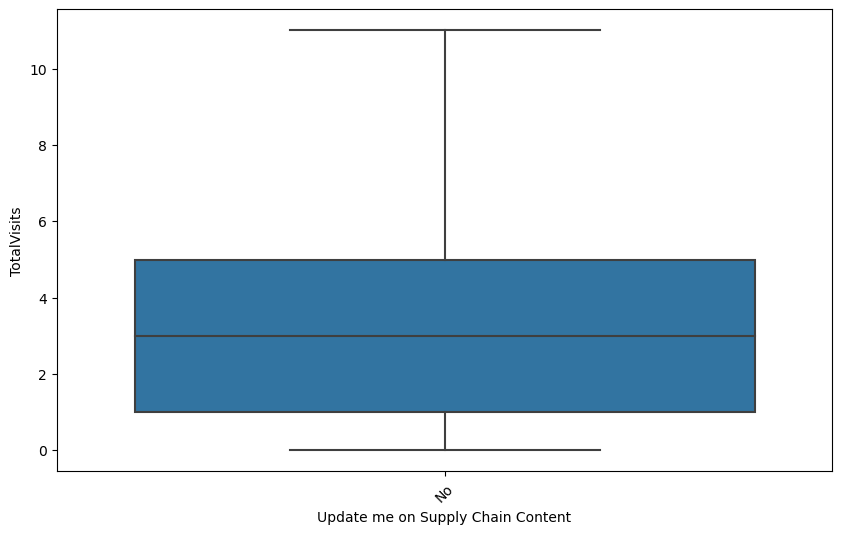

boxplot TotalVisits Vs Get updates on DM Content


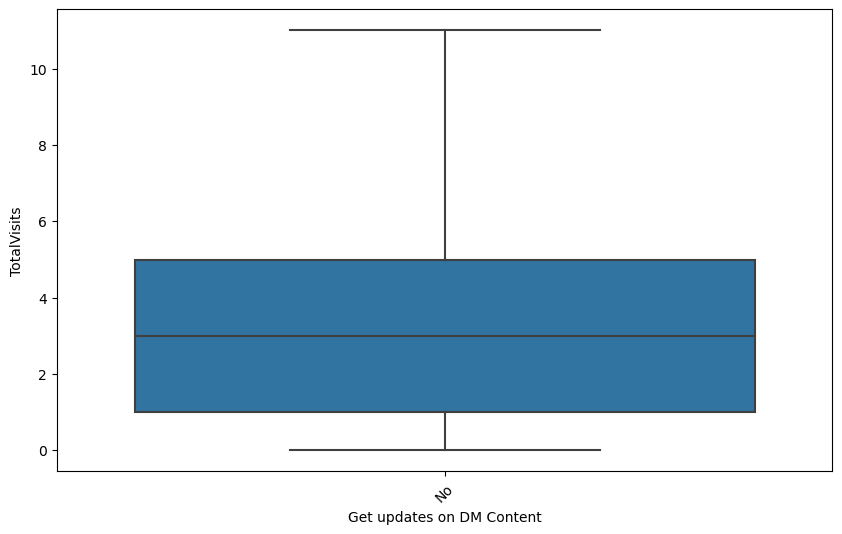

boxplot TotalVisits Vs I agree to pay the amount through cheque


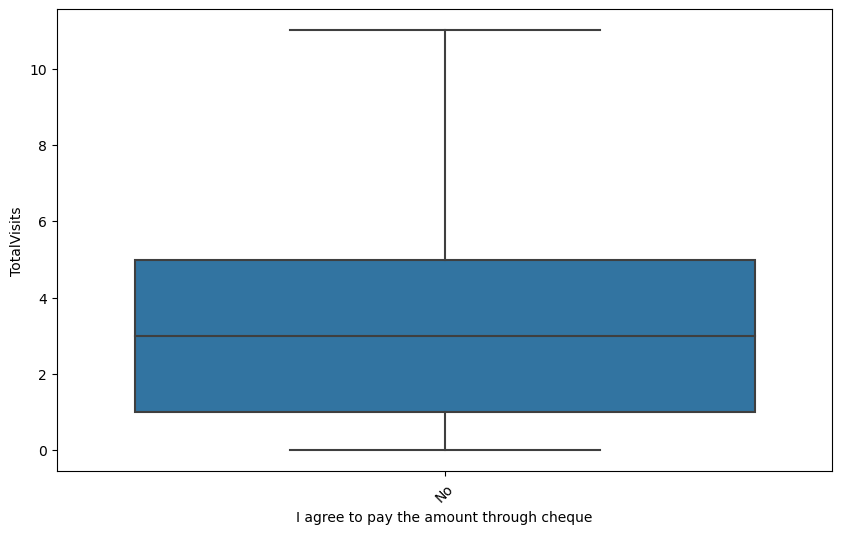

boxplot TotalVisits Vs A free copy of Mastering The Interview


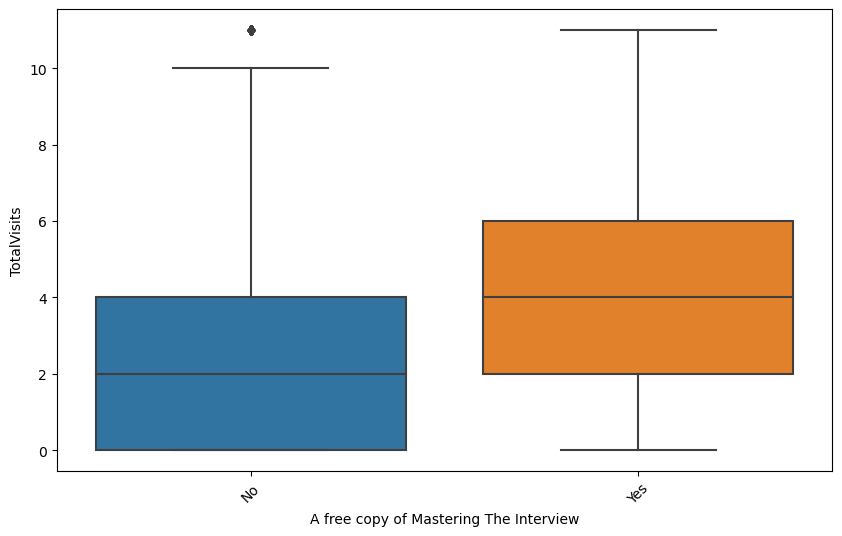

boxplot TotalVisits Vs Last Notable Activity


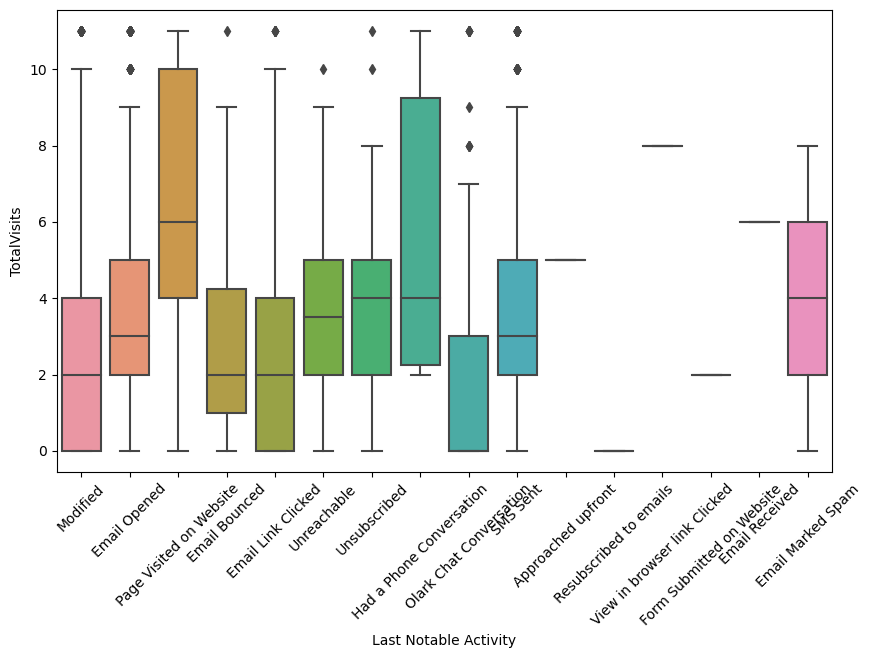

boxplot Total Time Spent on Website Vs Lead Origin


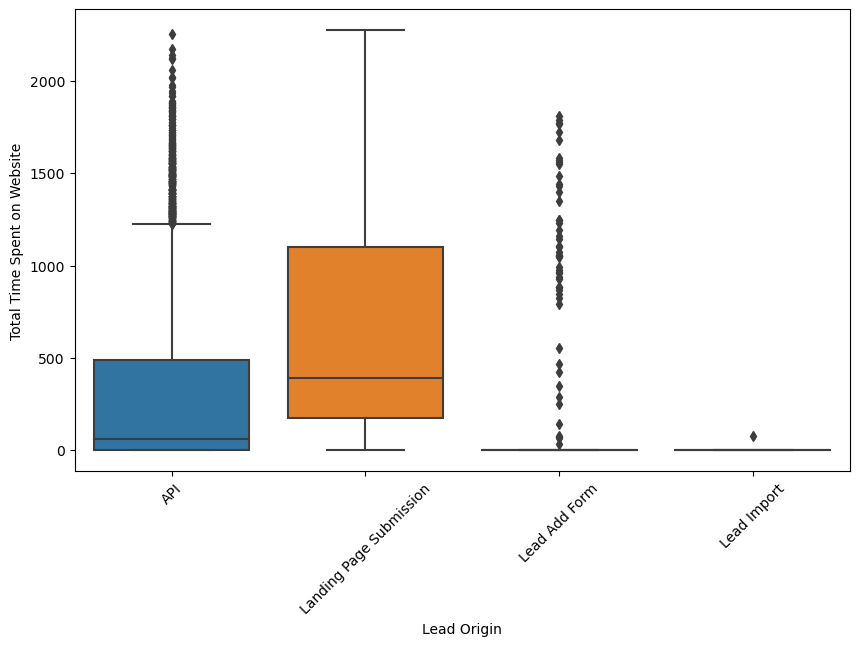

boxplot Total Time Spent on Website Vs Lead Source


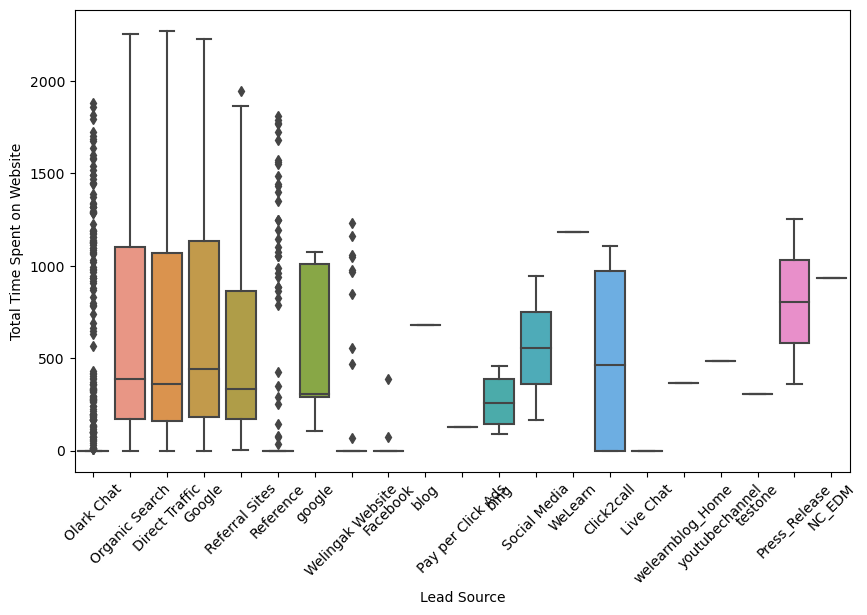

boxplot Total Time Spent on Website Vs Do Not Email


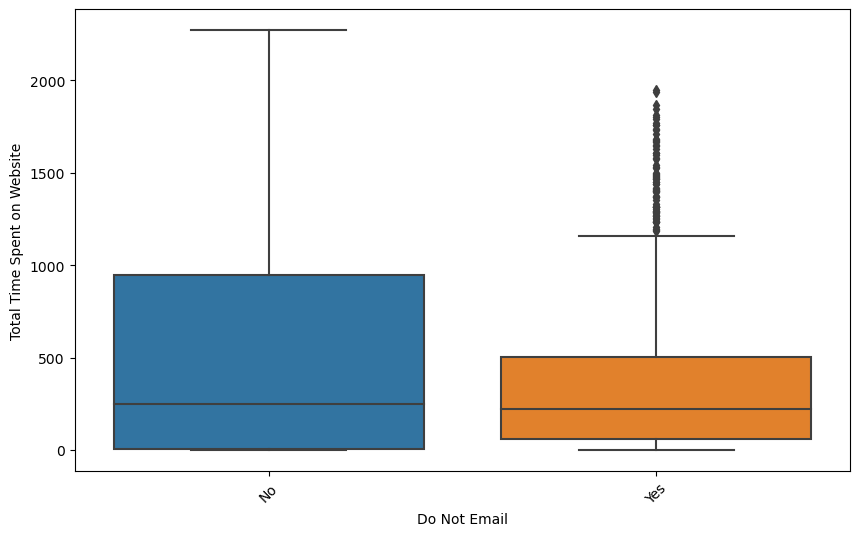

boxplot Total Time Spent on Website Vs Do Not Call


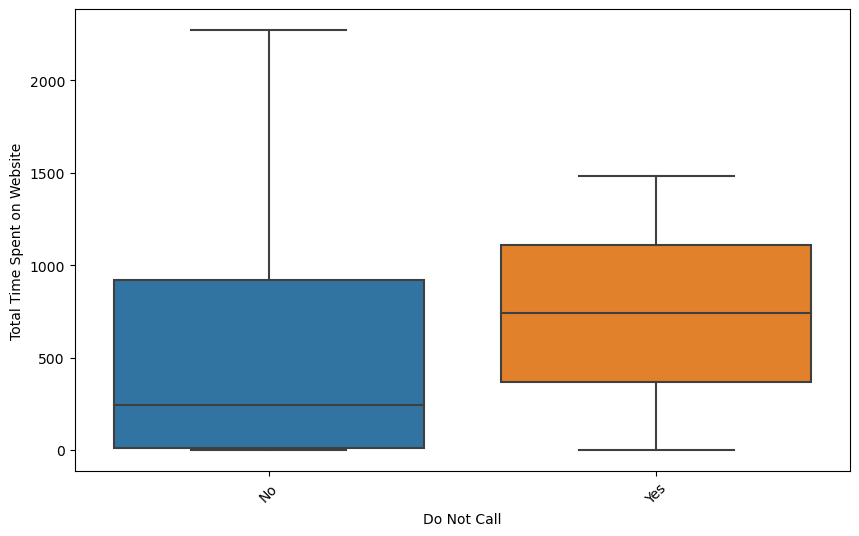

boxplot Total Time Spent on Website Vs Converted


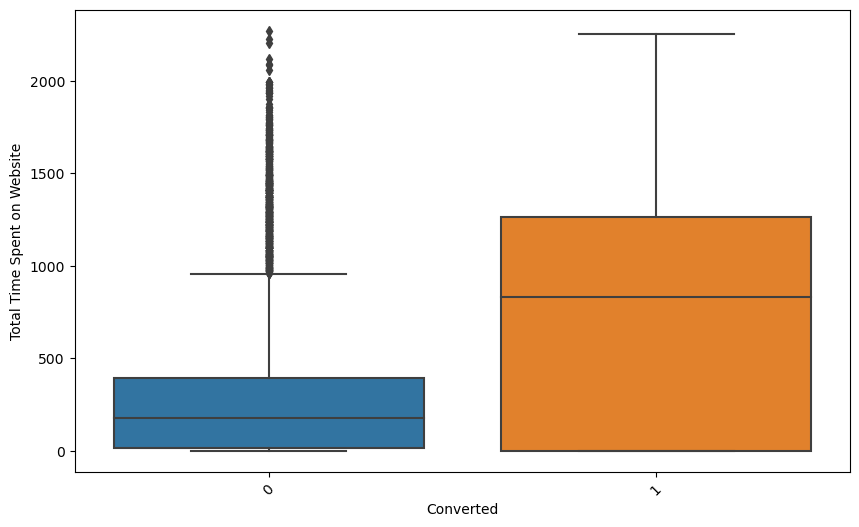

boxplot Total Time Spent on Website Vs Last Activity


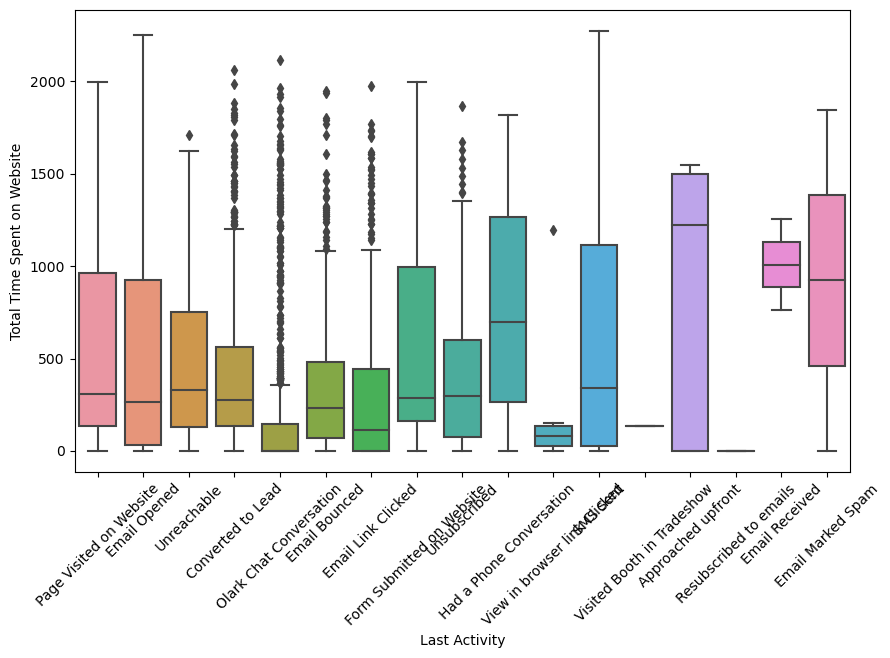

boxplot Total Time Spent on Website Vs Country


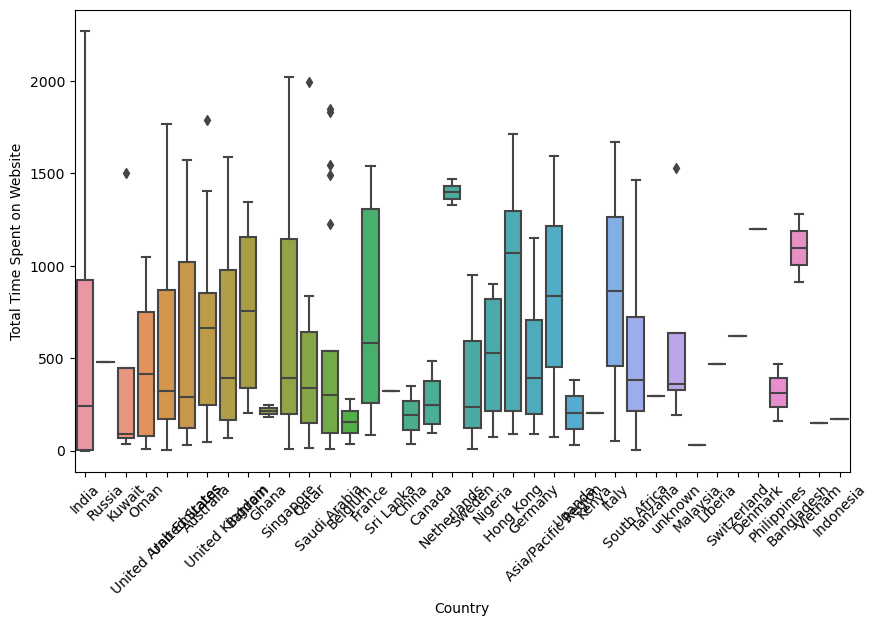

boxplot Total Time Spent on Website Vs Specialization


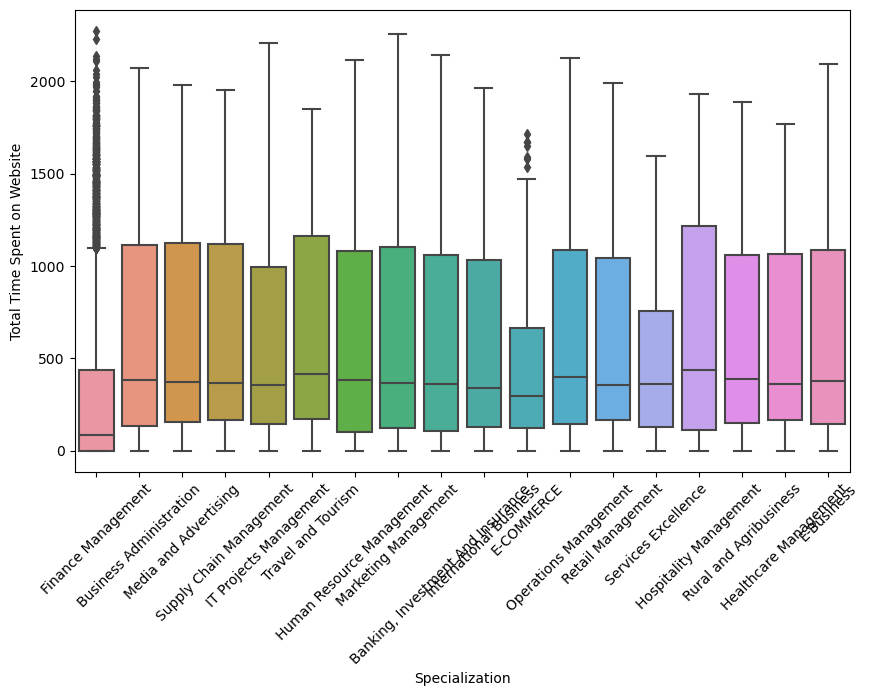

boxplot Total Time Spent on Website Vs What is your current occupation


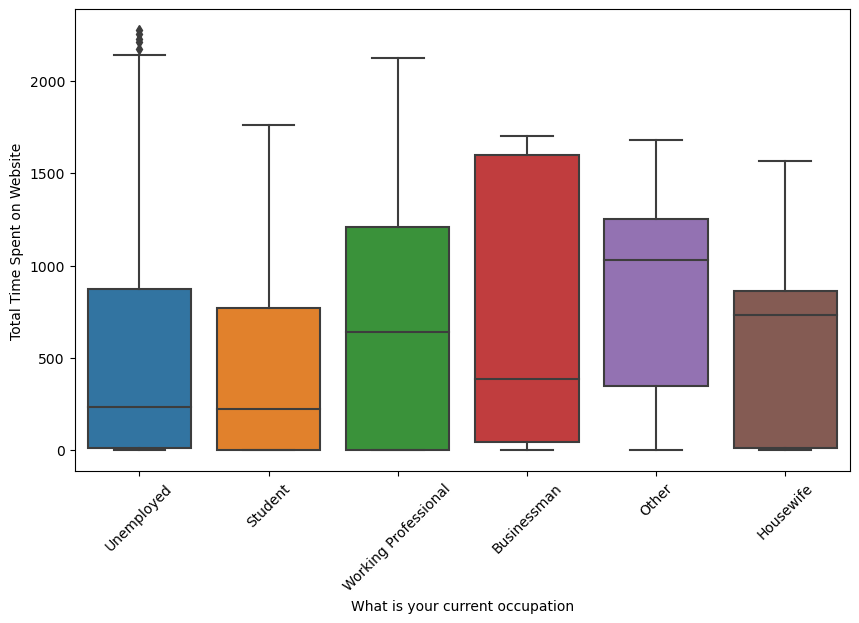

boxplot Total Time Spent on Website Vs What matters most to you in choosing a course


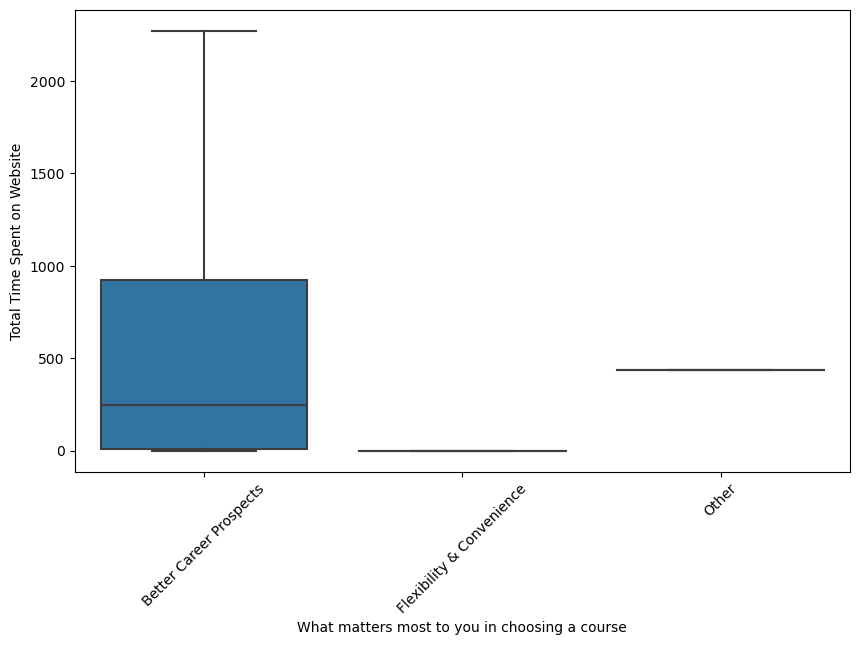

boxplot Total Time Spent on Website Vs Search


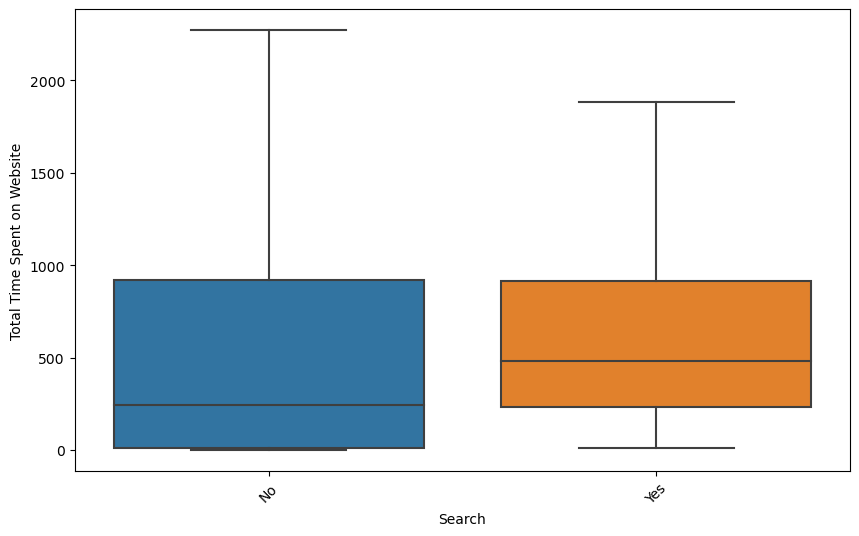

boxplot Total Time Spent on Website Vs Magazine


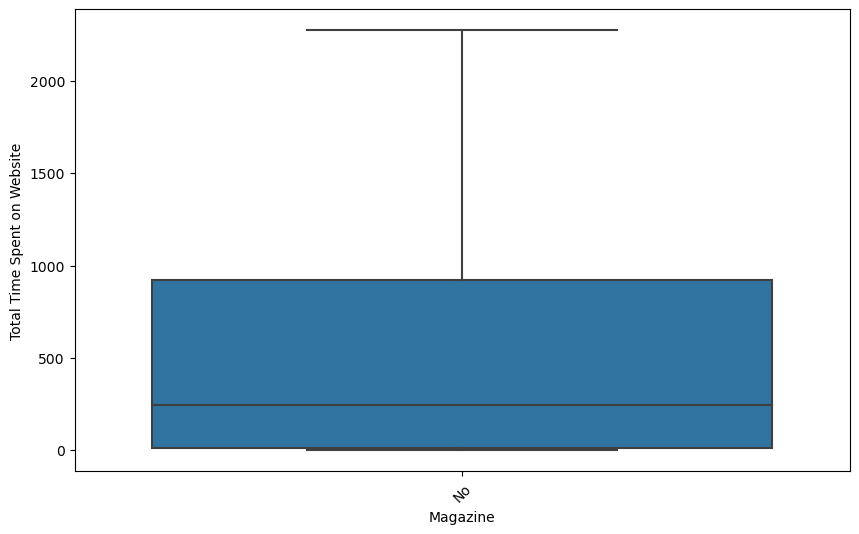

boxplot Total Time Spent on Website Vs Newspaper Article


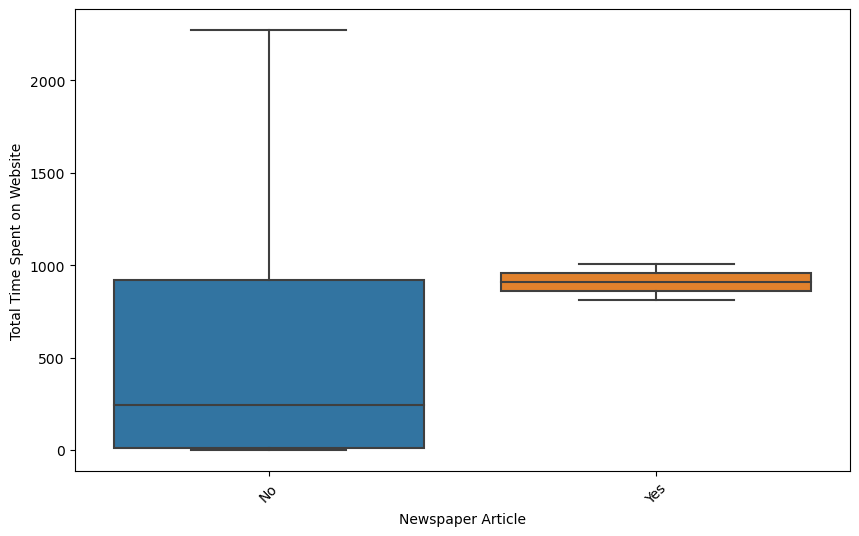

boxplot Total Time Spent on Website Vs X Education Forums


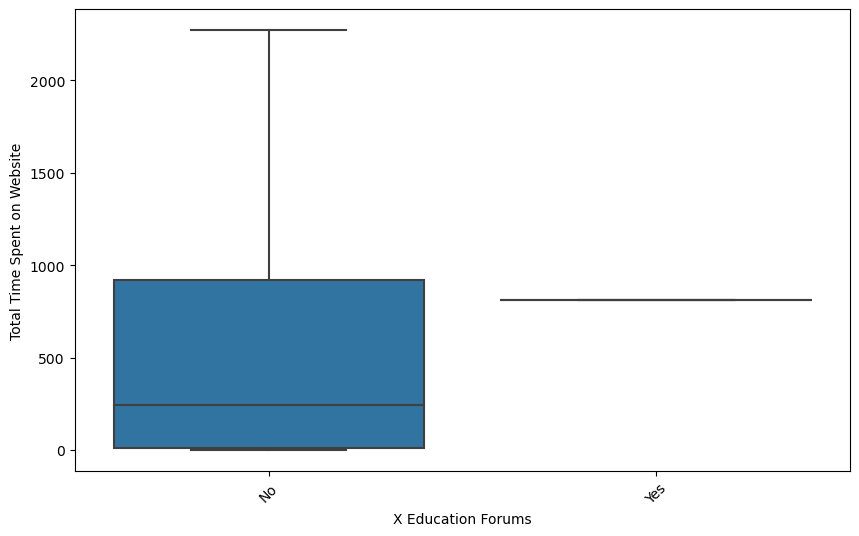

boxplot Total Time Spent on Website Vs Newspaper


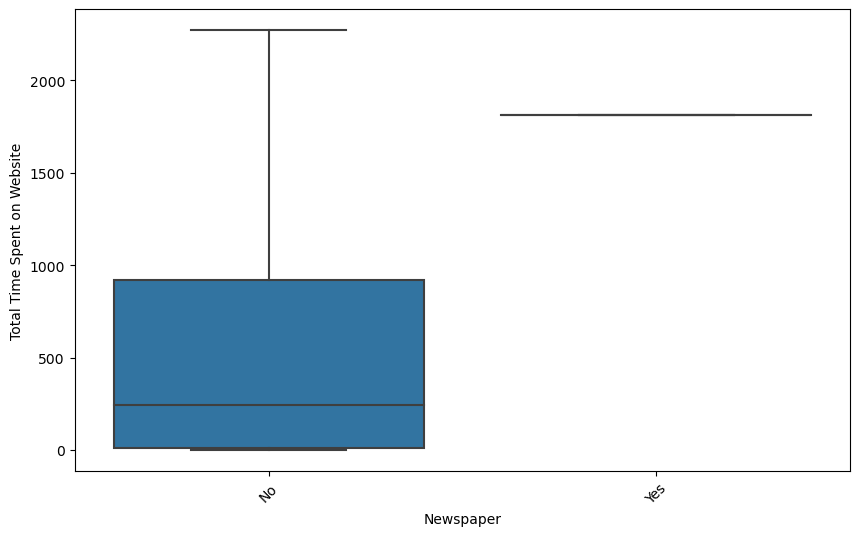

boxplot Total Time Spent on Website Vs Digital Advertisement


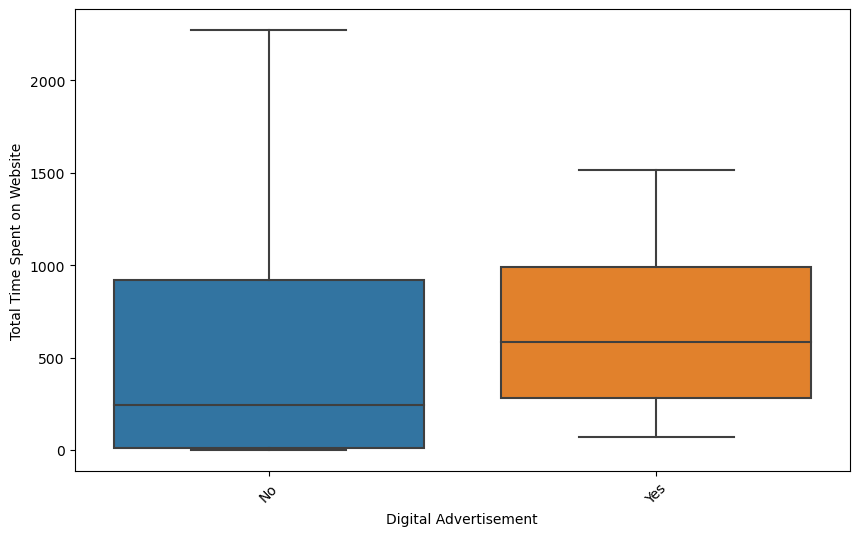

boxplot Total Time Spent on Website Vs Through Recommendations


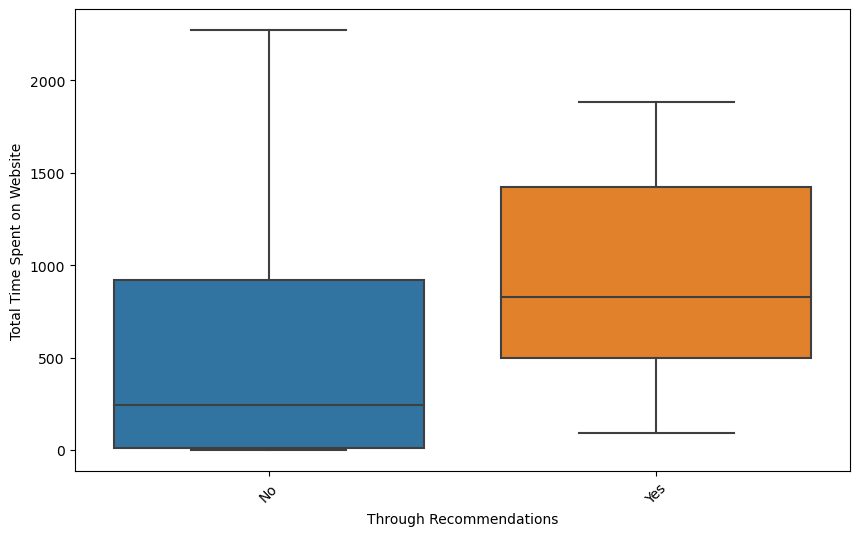

boxplot Total Time Spent on Website Vs Receive More Updates About Our Courses


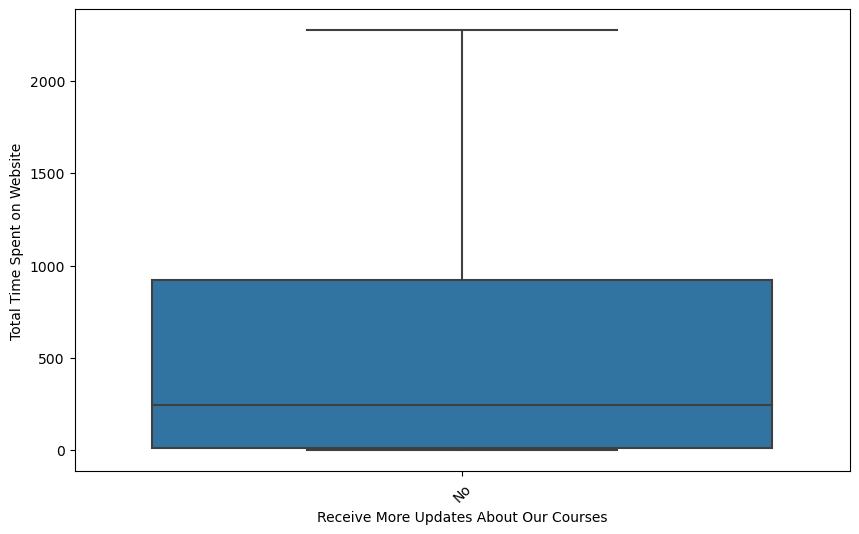

boxplot Total Time Spent on Website Vs Tags


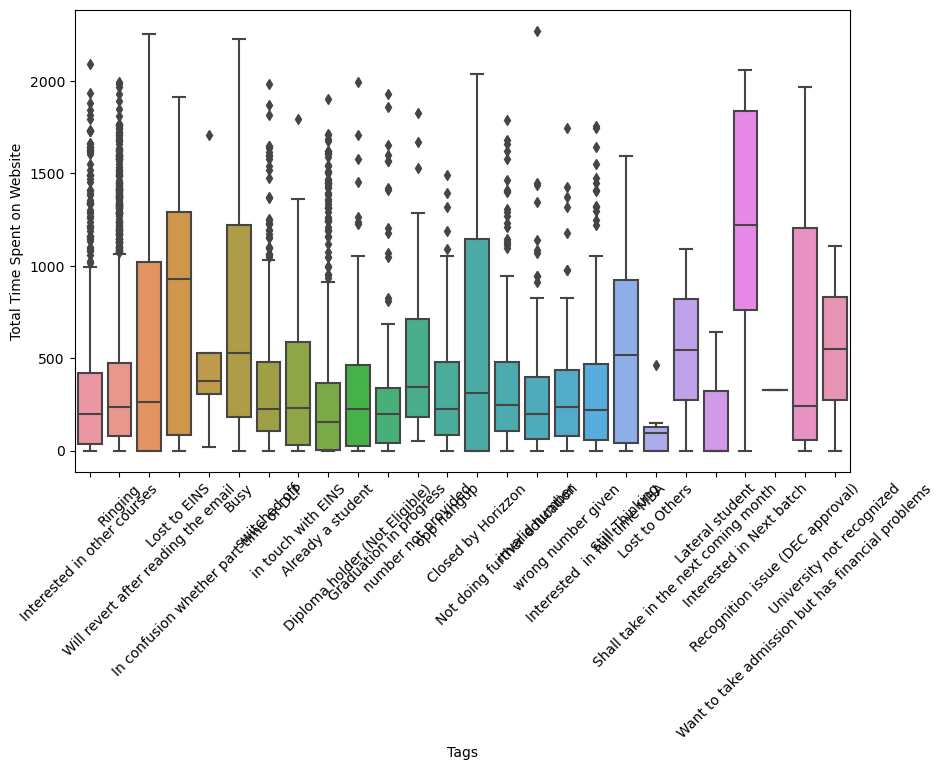

boxplot Total Time Spent on Website Vs Update me on Supply Chain Content


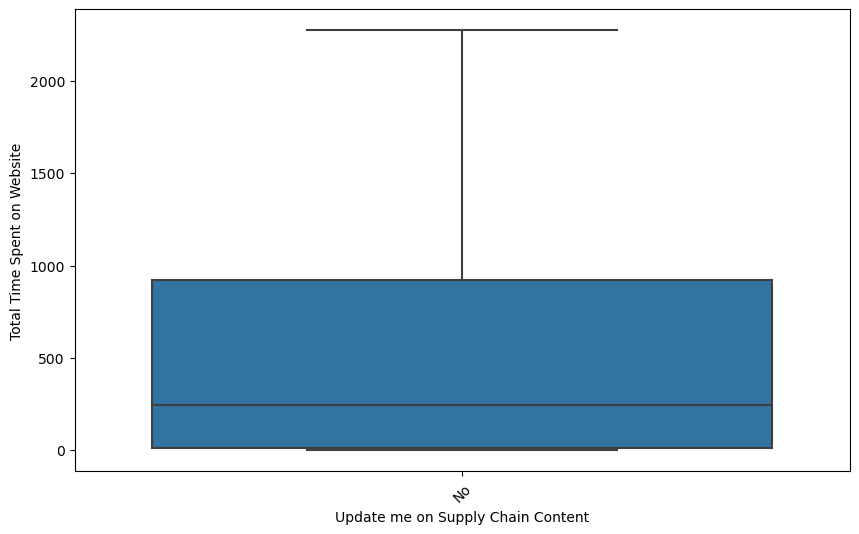

boxplot Total Time Spent on Website Vs Get updates on DM Content


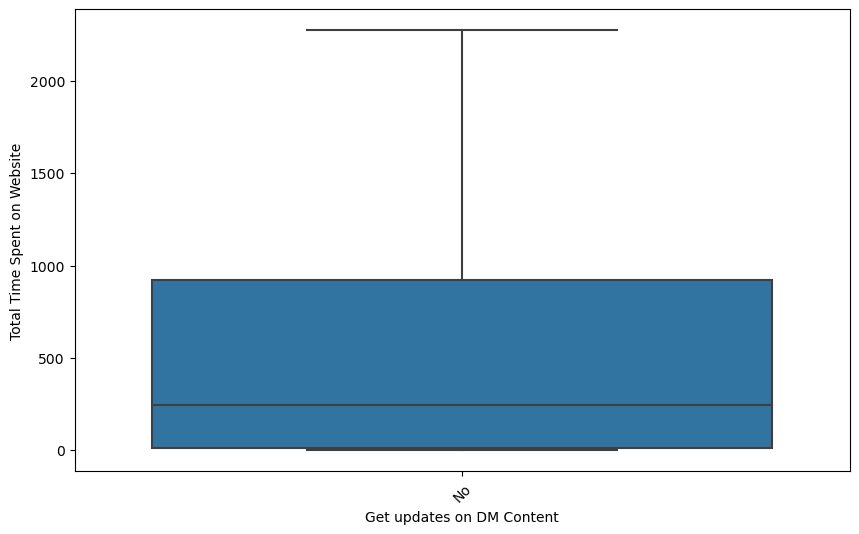

boxplot Total Time Spent on Website Vs I agree to pay the amount through cheque


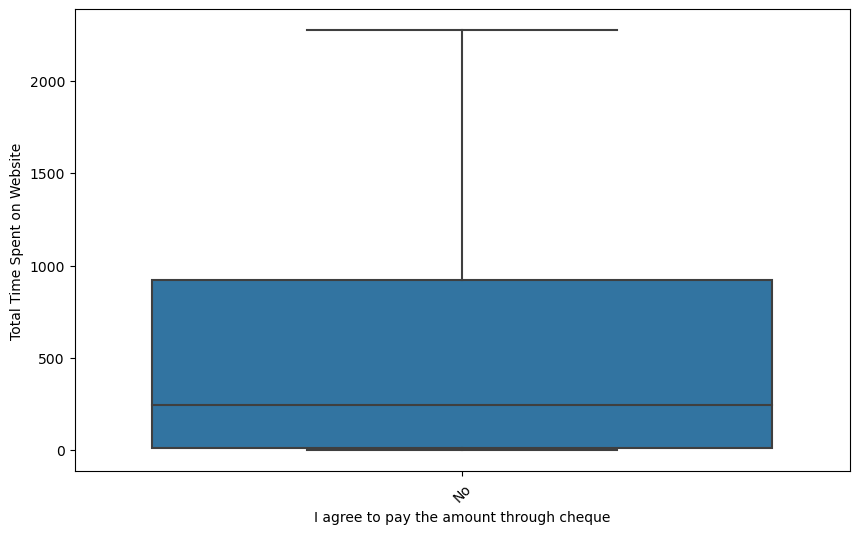

boxplot Total Time Spent on Website Vs A free copy of Mastering The Interview


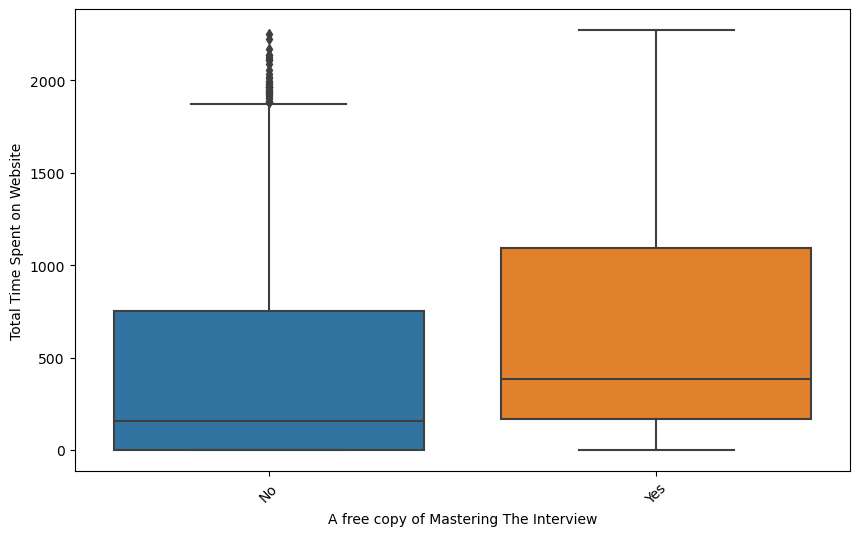

boxplot Total Time Spent on Website Vs Last Notable Activity


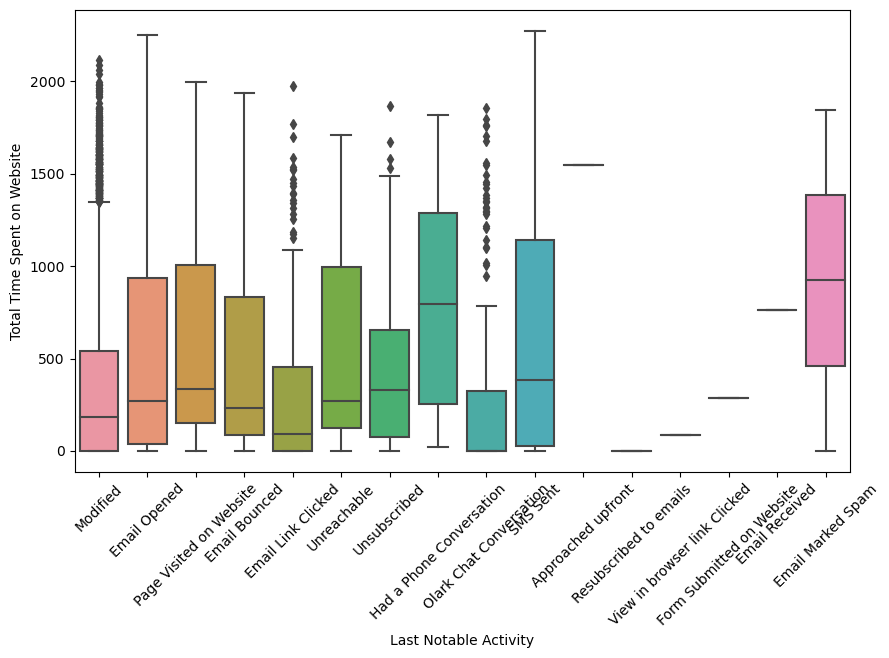

boxplot Page Views Per Visit Vs Lead Origin


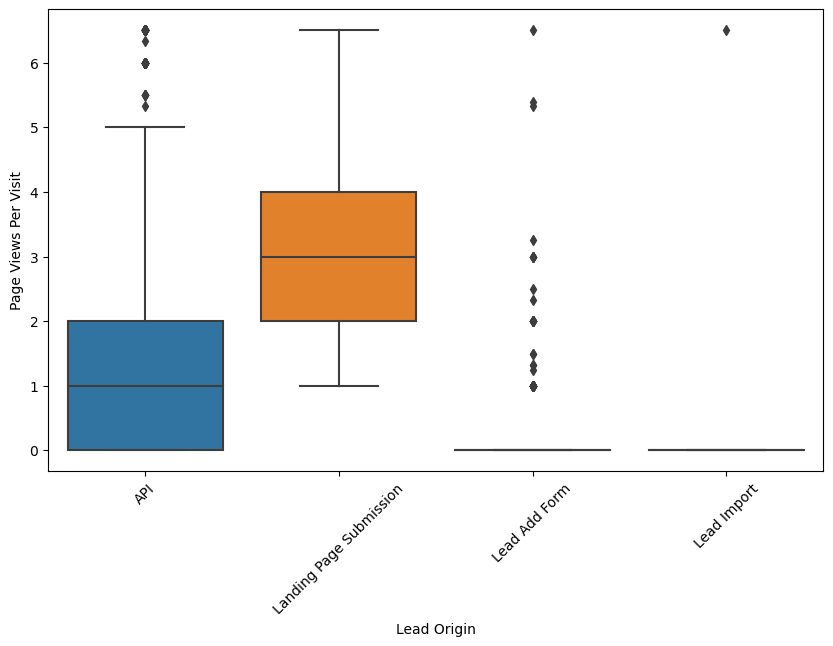

boxplot Page Views Per Visit Vs Lead Source


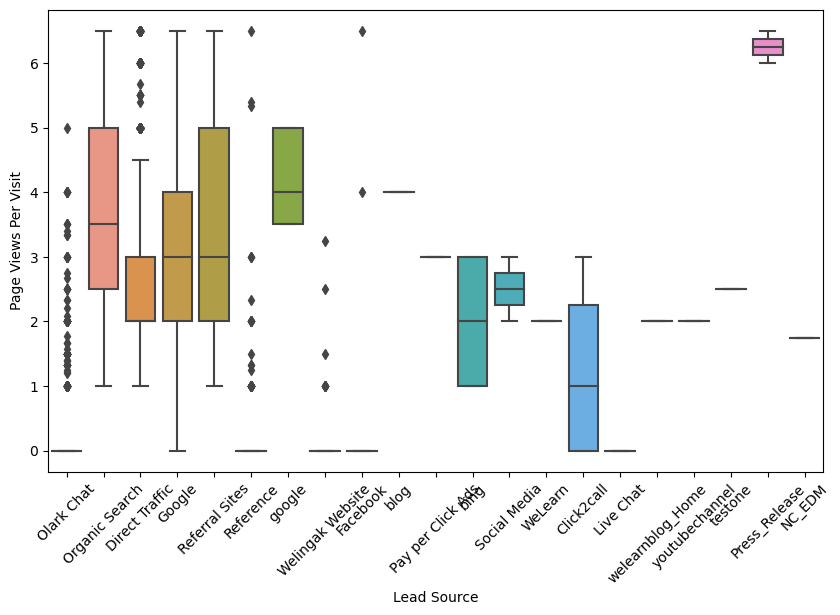

boxplot Page Views Per Visit Vs Do Not Email


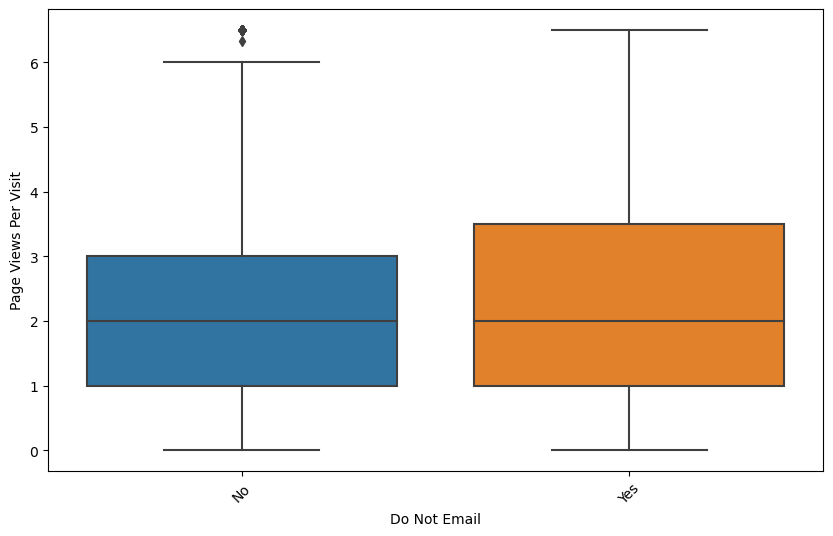

boxplot Page Views Per Visit Vs Do Not Call


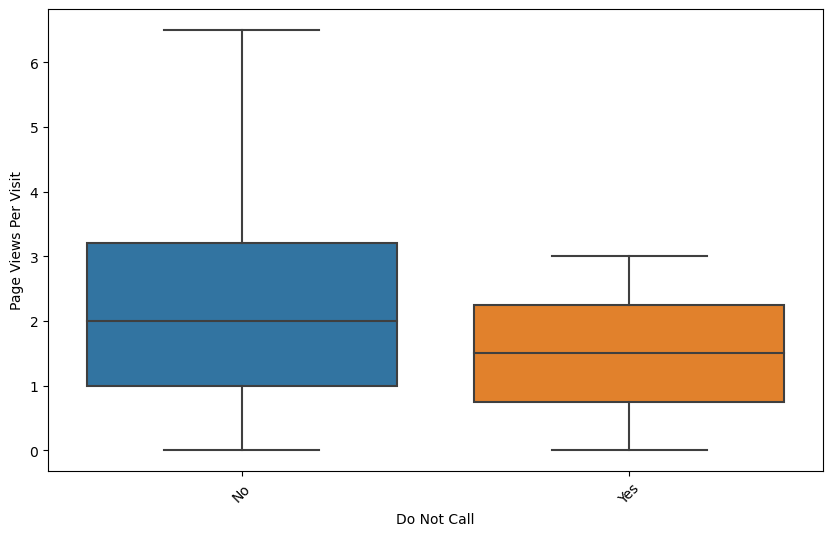

boxplot Page Views Per Visit Vs Converted


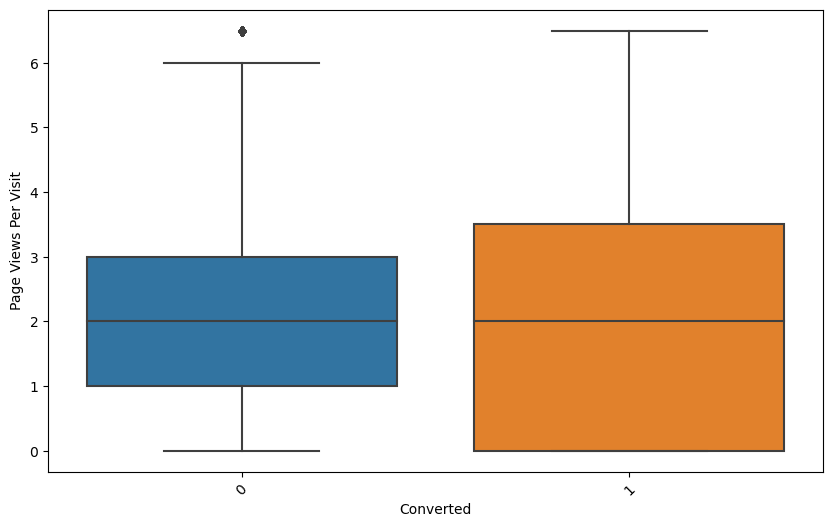

boxplot Page Views Per Visit Vs Last Activity


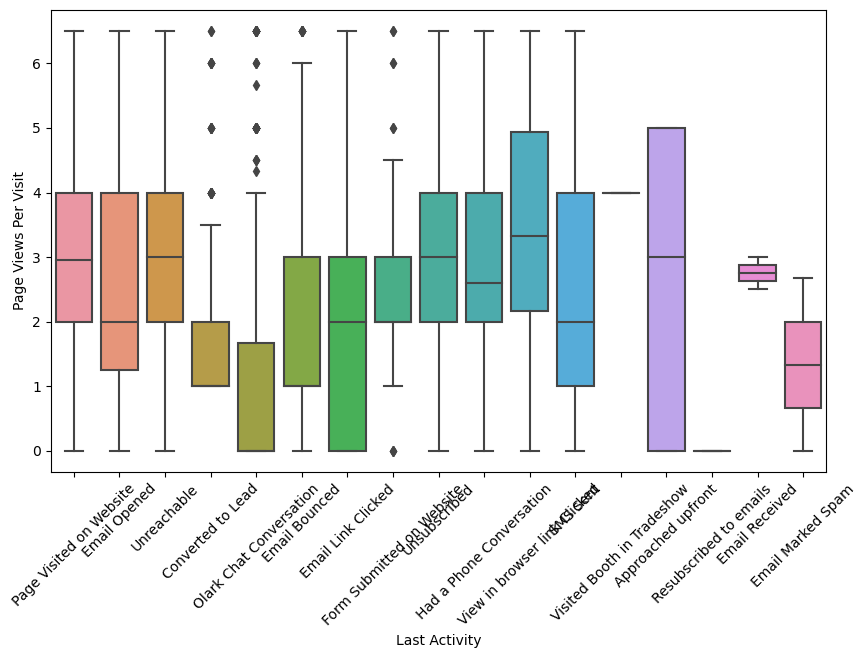

boxplot Page Views Per Visit Vs Country


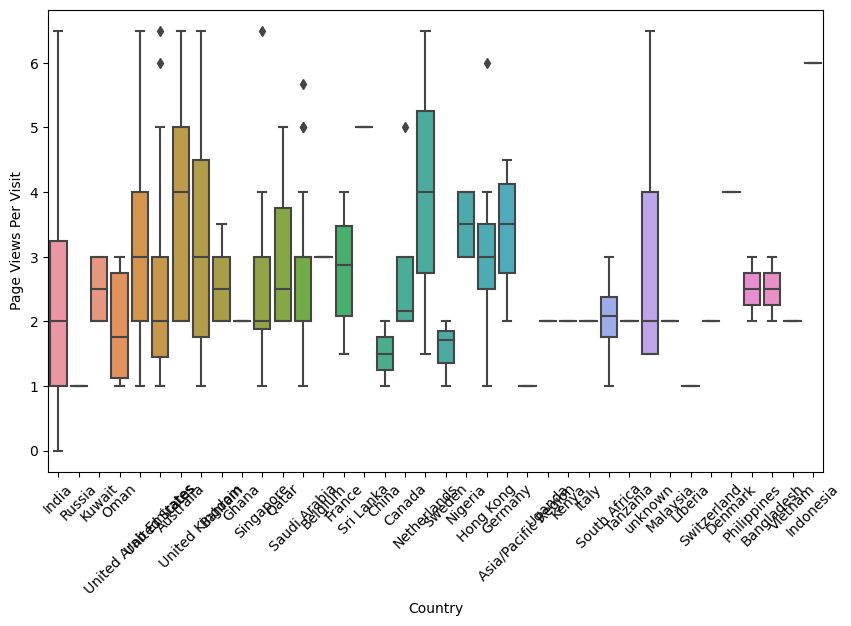

boxplot Page Views Per Visit Vs Specialization


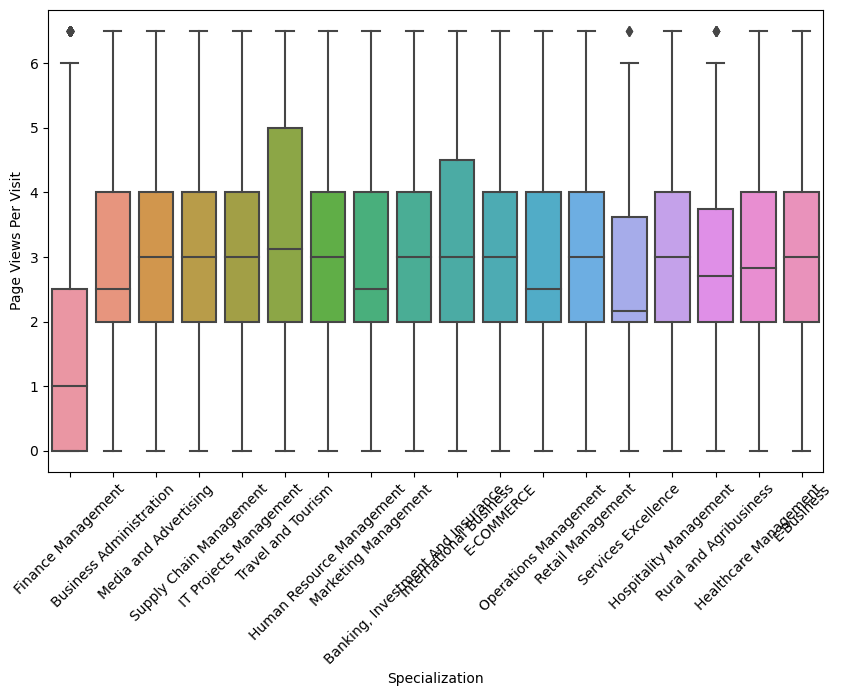

boxplot Page Views Per Visit Vs What is your current occupation


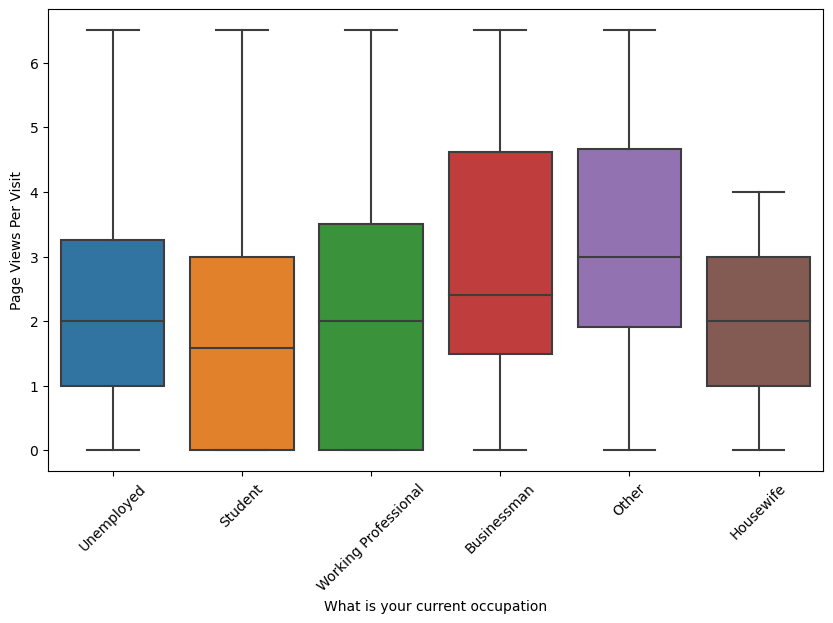

boxplot Page Views Per Visit Vs What matters most to you in choosing a course


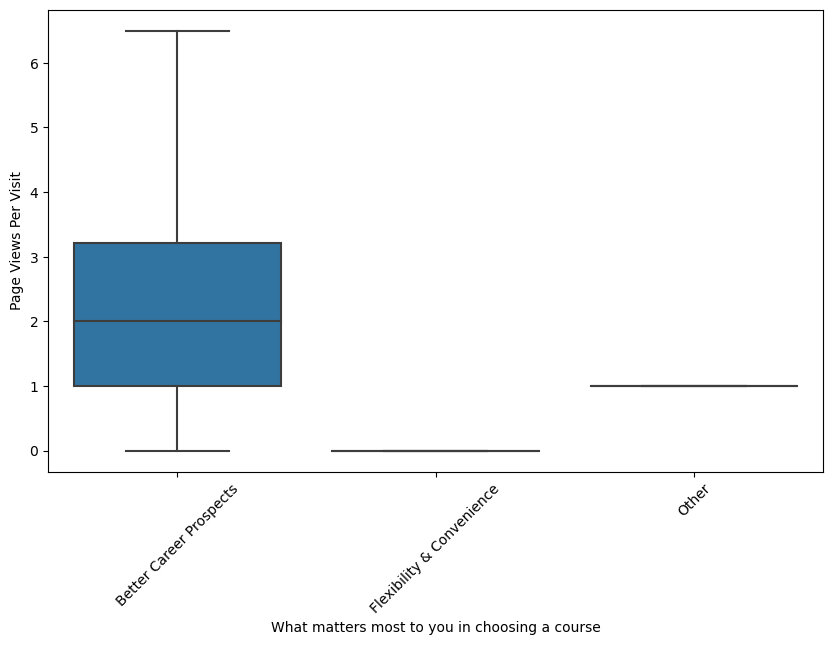

boxplot Page Views Per Visit Vs Search


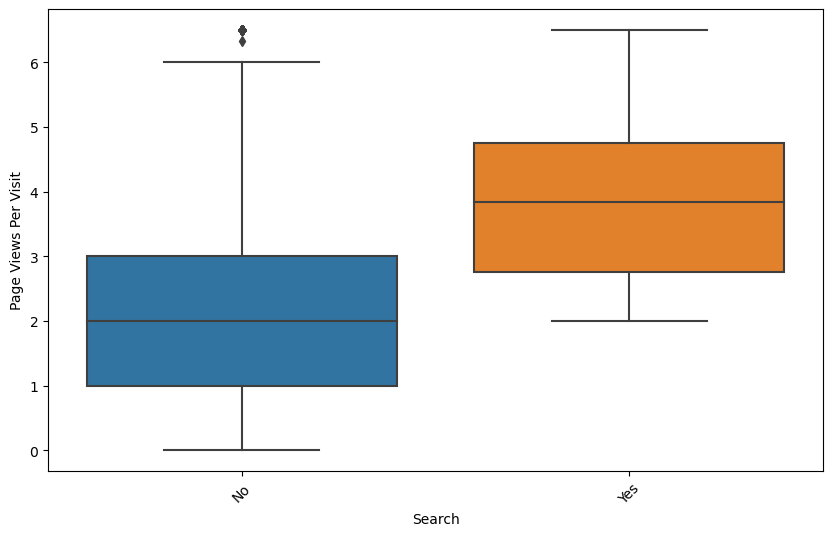

boxplot Page Views Per Visit Vs Magazine


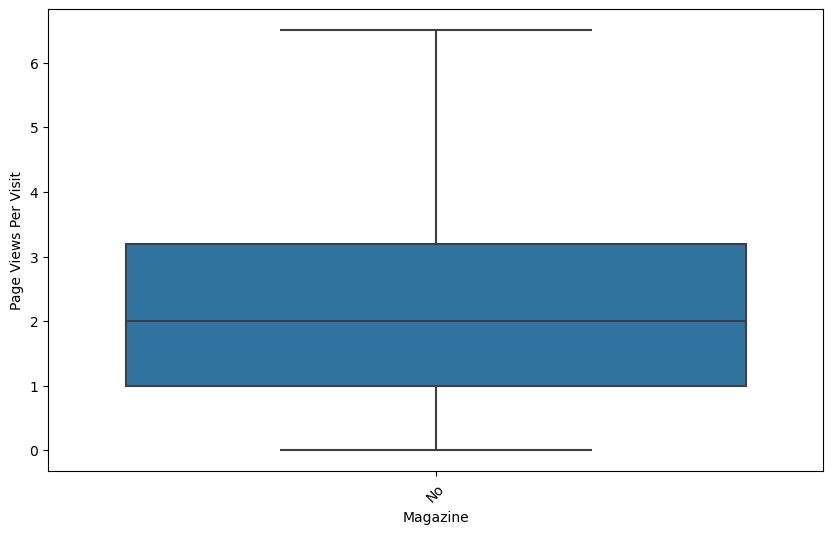

boxplot Page Views Per Visit Vs Newspaper Article


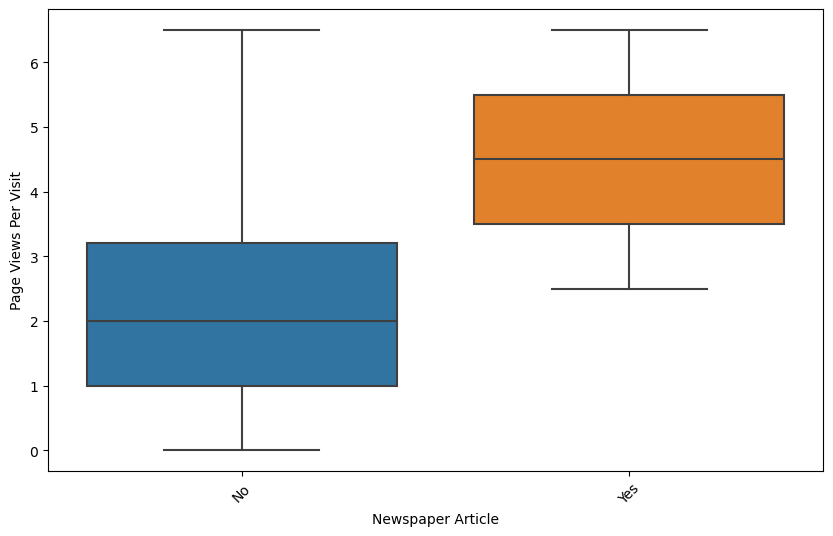

boxplot Page Views Per Visit Vs X Education Forums


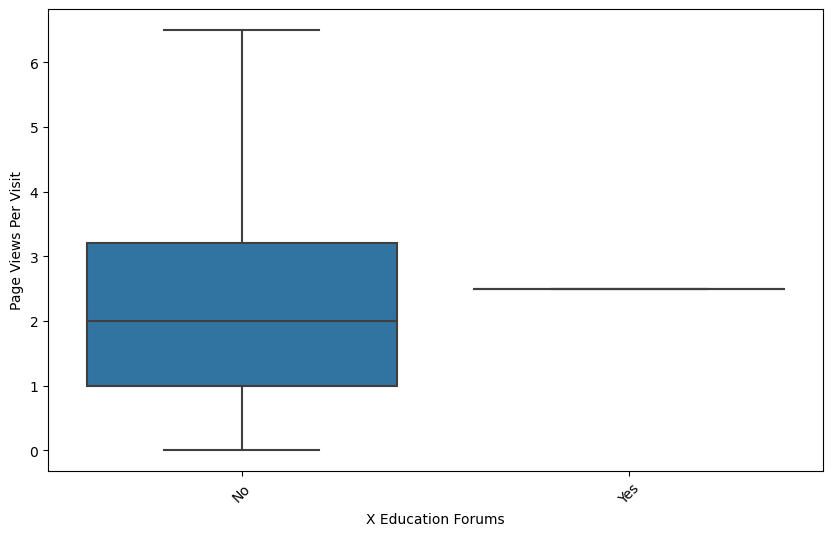

boxplot Page Views Per Visit Vs Newspaper


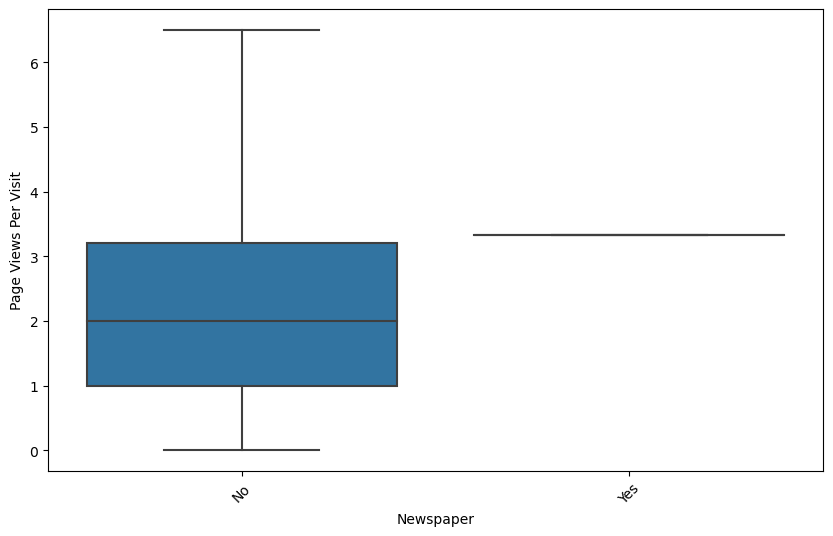

boxplot Page Views Per Visit Vs Digital Advertisement


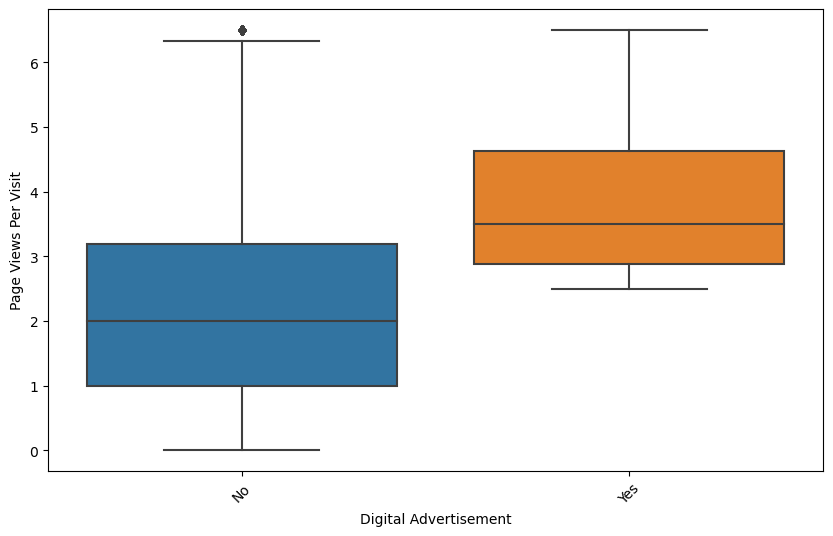

boxplot Page Views Per Visit Vs Through Recommendations


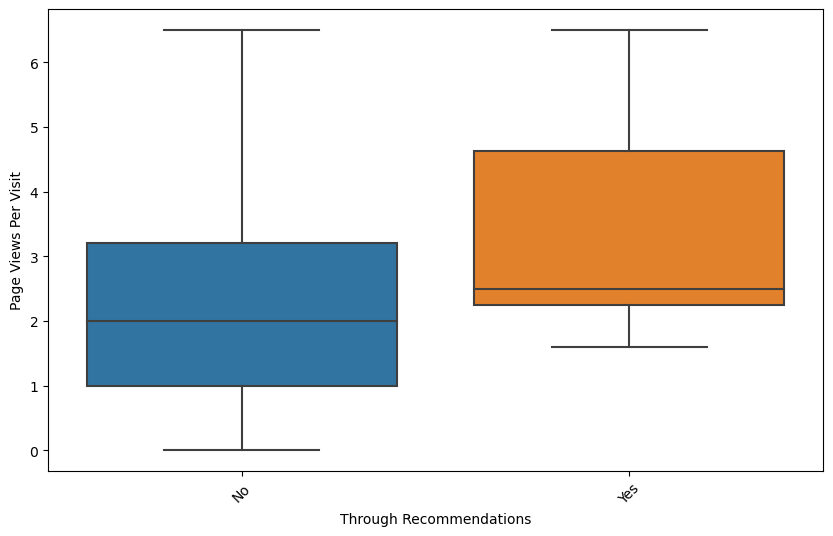

boxplot Page Views Per Visit Vs Receive More Updates About Our Courses


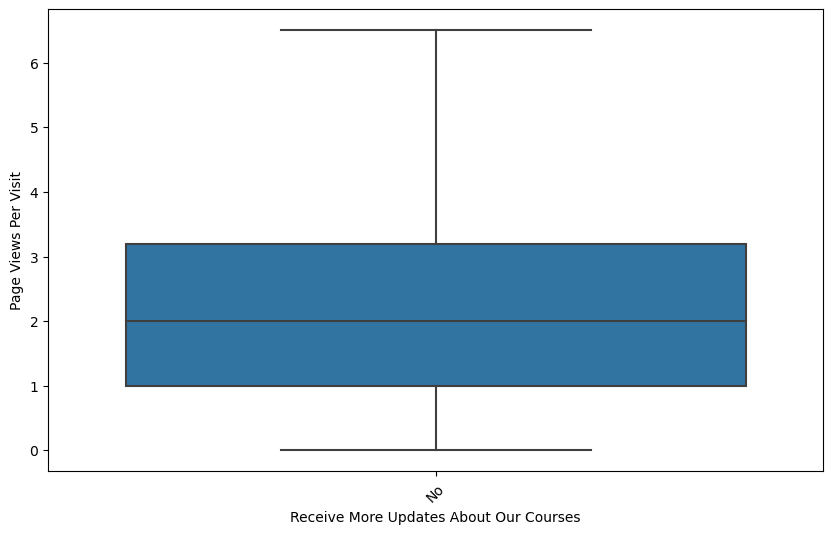

boxplot Page Views Per Visit Vs Tags


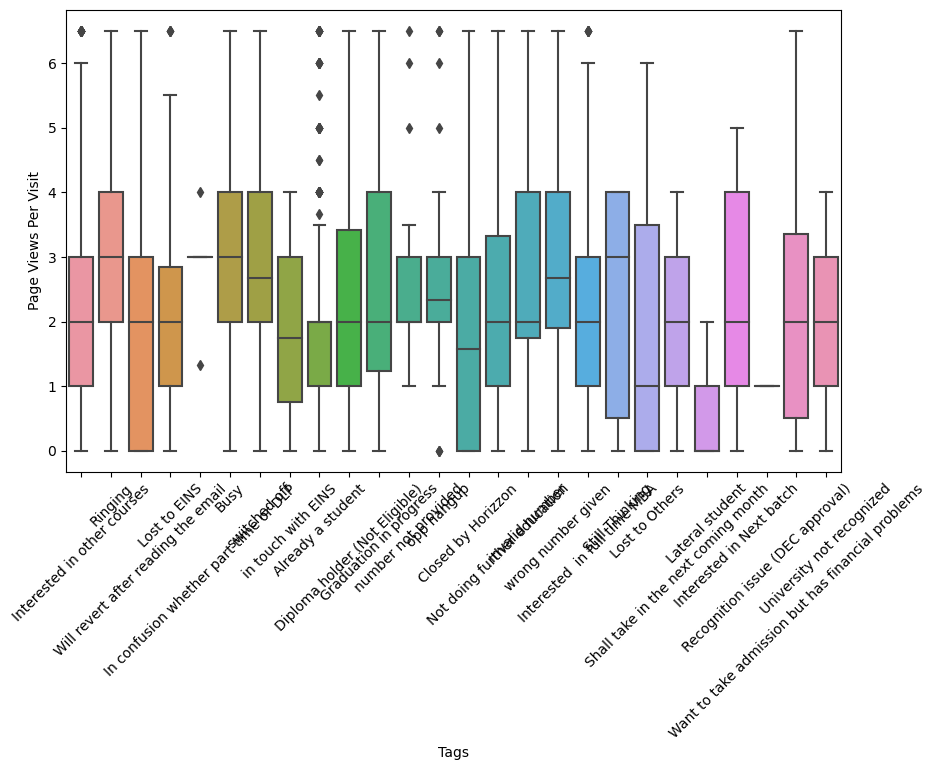

boxplot Page Views Per Visit Vs Update me on Supply Chain Content


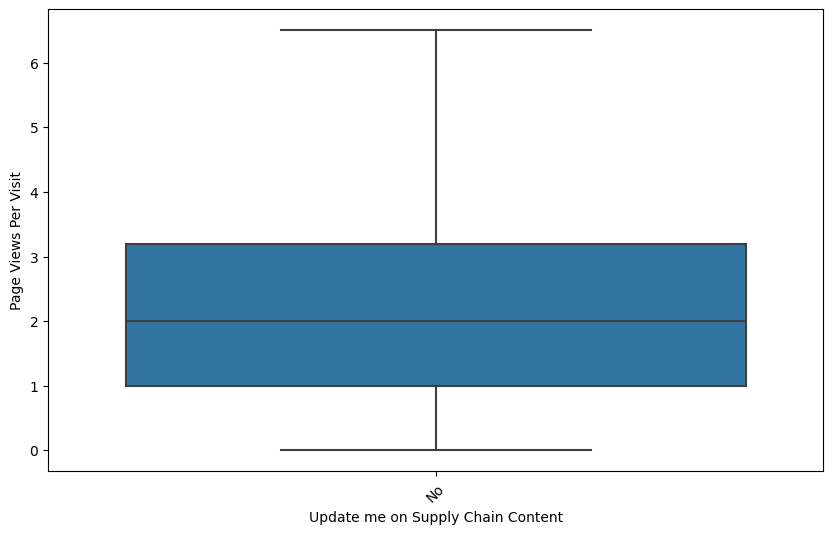

boxplot Page Views Per Visit Vs Get updates on DM Content


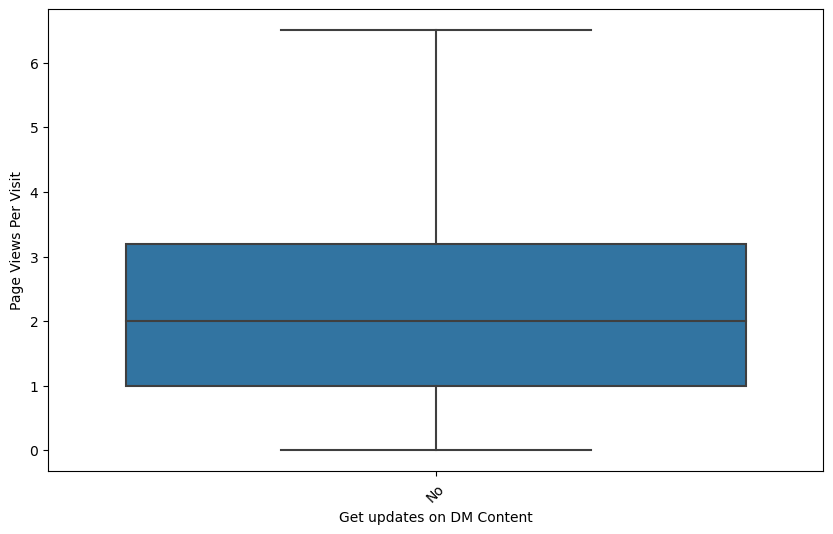

boxplot Page Views Per Visit Vs I agree to pay the amount through cheque


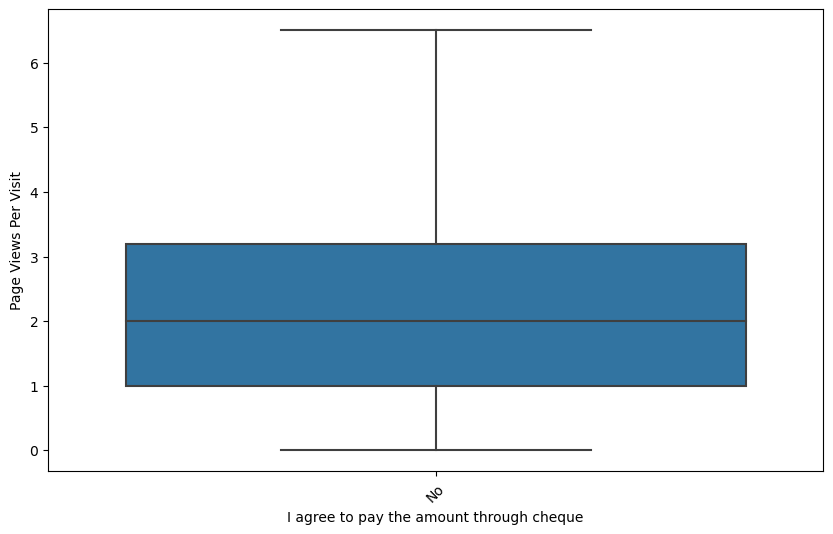

boxplot Page Views Per Visit Vs A free copy of Mastering The Interview


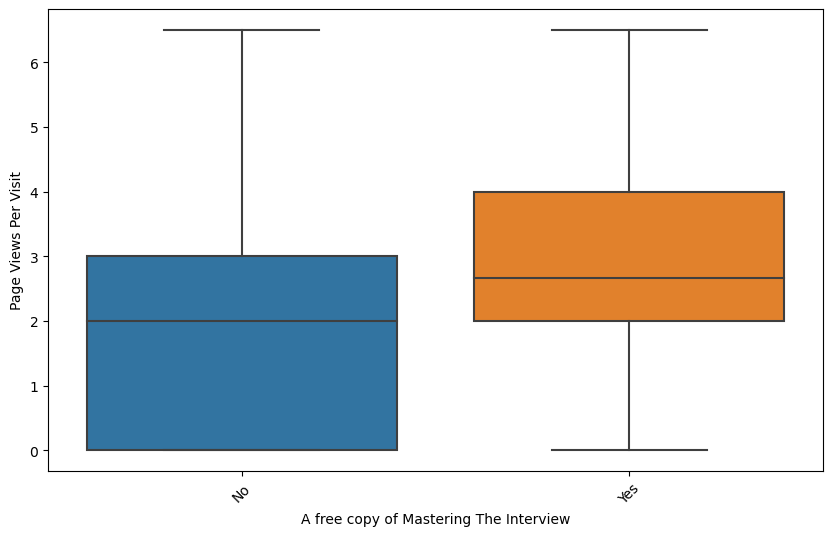

boxplot Page Views Per Visit Vs Last Notable Activity


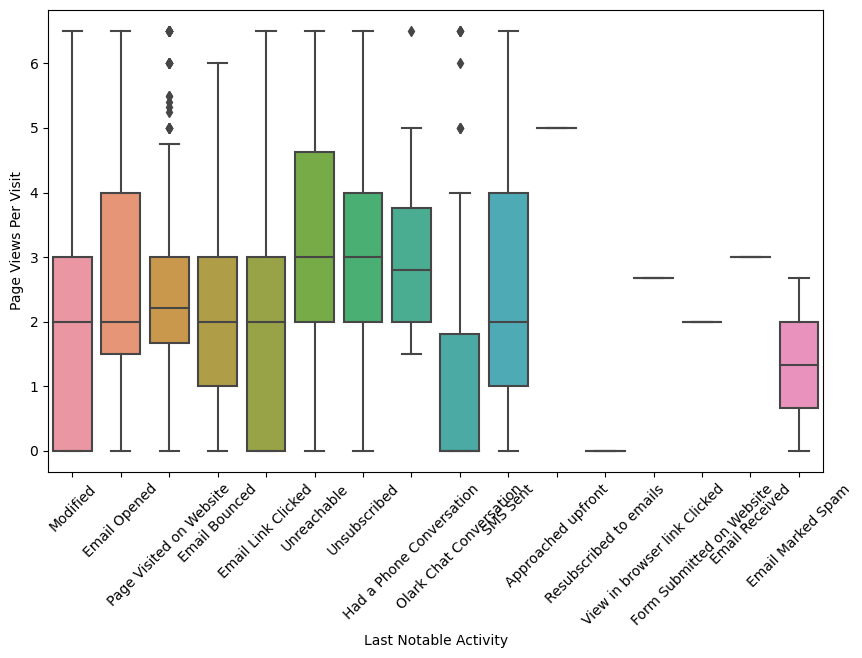

In [41]:
for i in num_cols:
    for j in cat_cols:
        print("boxplot", i, "Vs", j)
        plt.figure(figsize=(10, 6)) 
        sns.boxplot(x=df[j], y=df[i])
        plt.xticks(rotation=45)  
        plt.show()


### E) CREATE SCATTERPLOTS FOR THE RELATIONSHIP BETWEEN NUMERICAL AND CATEGORICAL VARIABLES.

scatterplot TotalVisits Vs Lead Origin


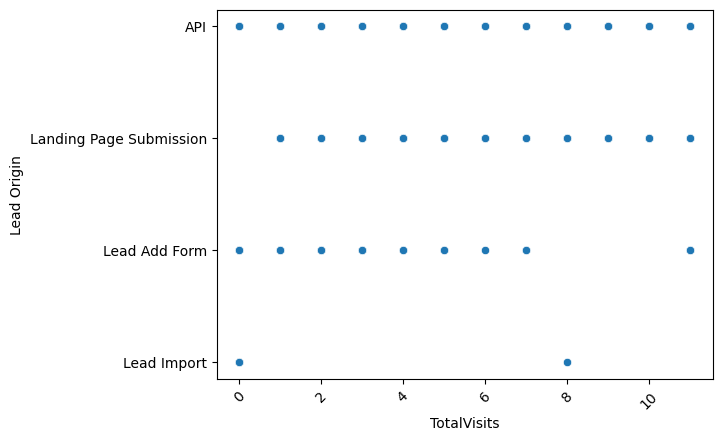

scatterplot TotalVisits Vs Lead Source


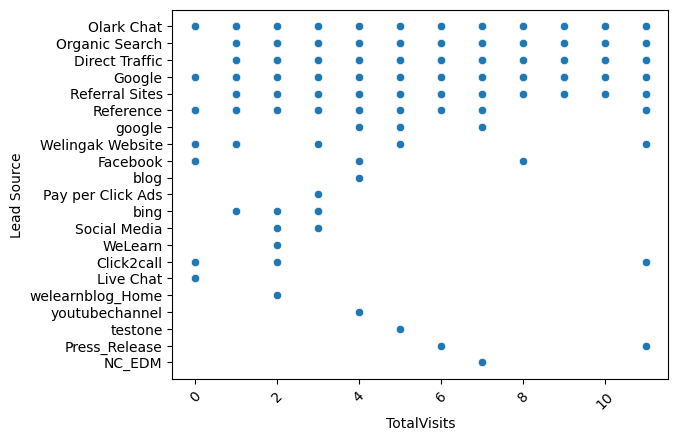

scatterplot TotalVisits Vs Do Not Email


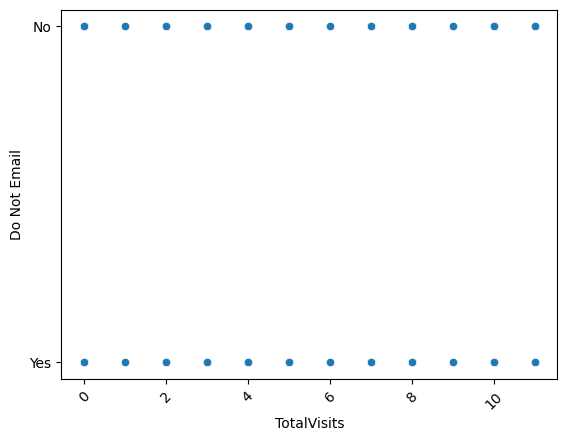

scatterplot TotalVisits Vs Do Not Call


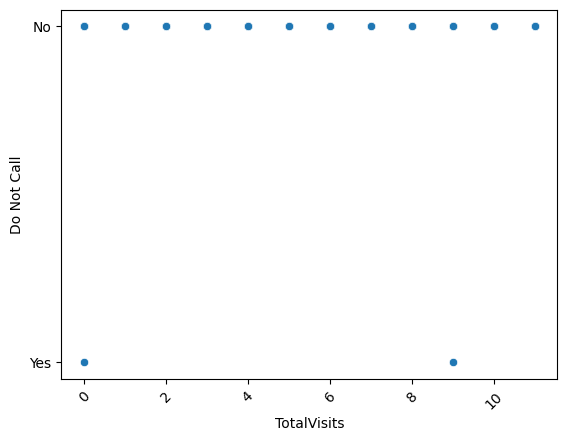

scatterplot TotalVisits Vs Converted


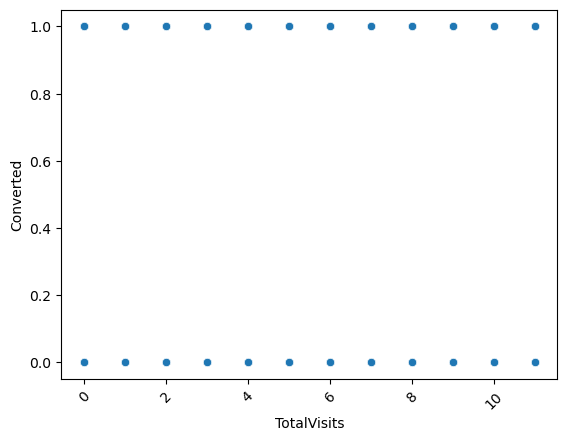

scatterplot TotalVisits Vs Last Activity


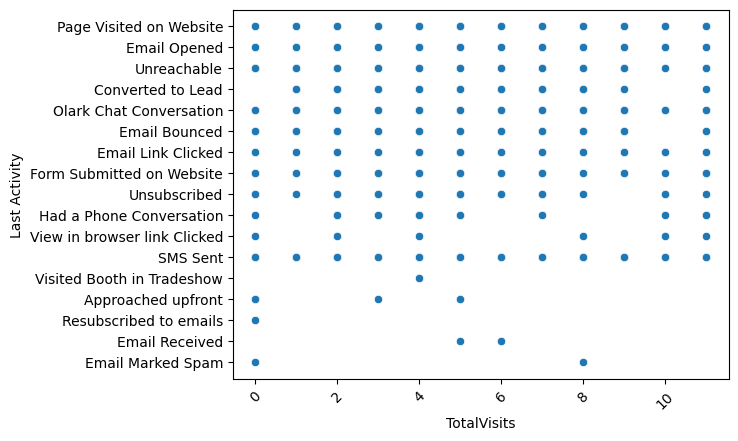

scatterplot TotalVisits Vs Country


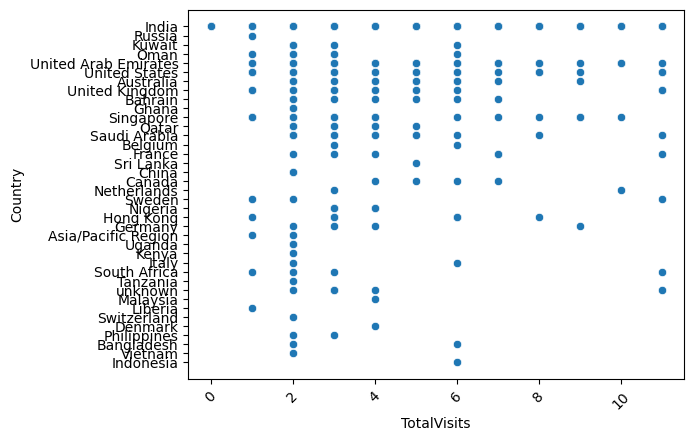

scatterplot TotalVisits Vs Specialization


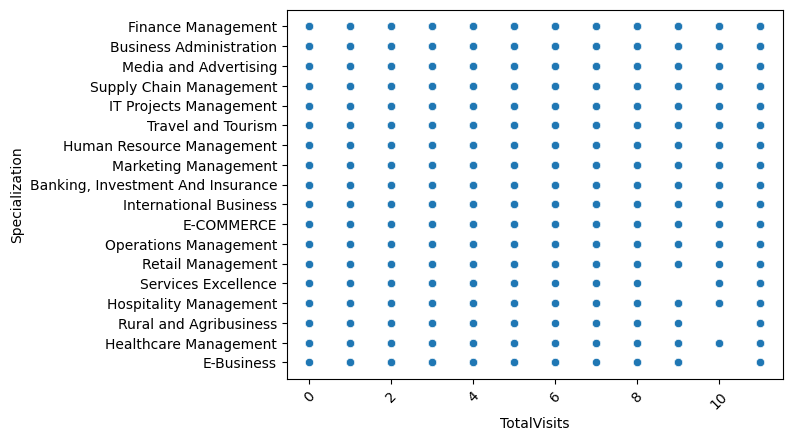

scatterplot TotalVisits Vs What is your current occupation


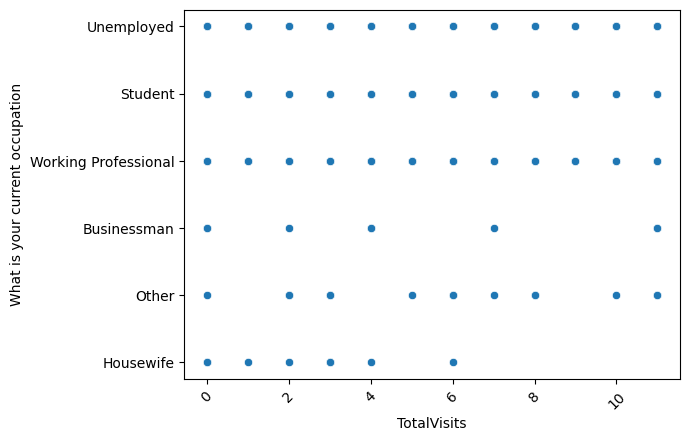

scatterplot TotalVisits Vs What matters most to you in choosing a course


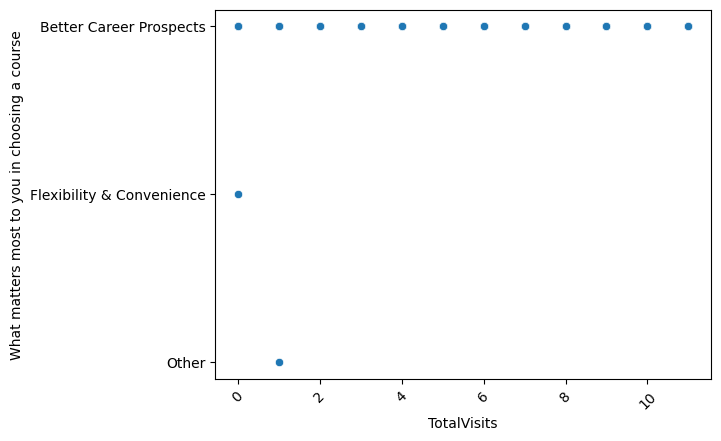

scatterplot TotalVisits Vs Search


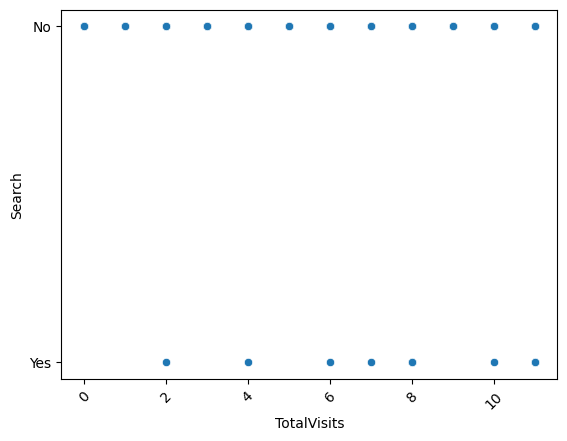

scatterplot TotalVisits Vs Magazine


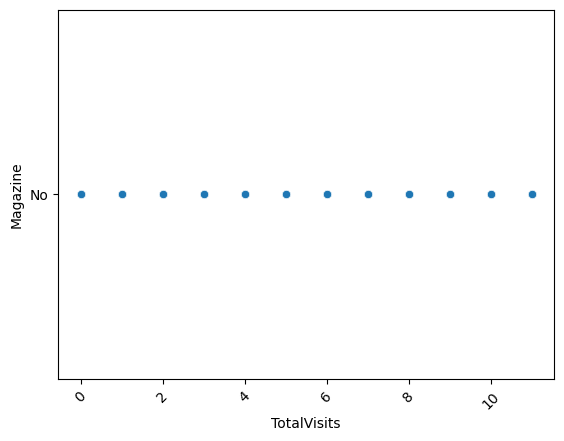

scatterplot TotalVisits Vs Newspaper Article


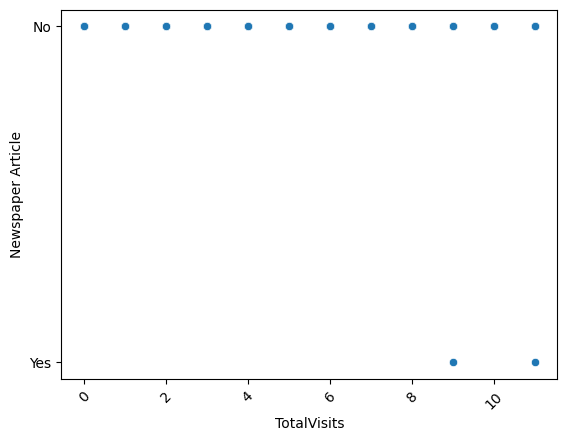

scatterplot TotalVisits Vs X Education Forums


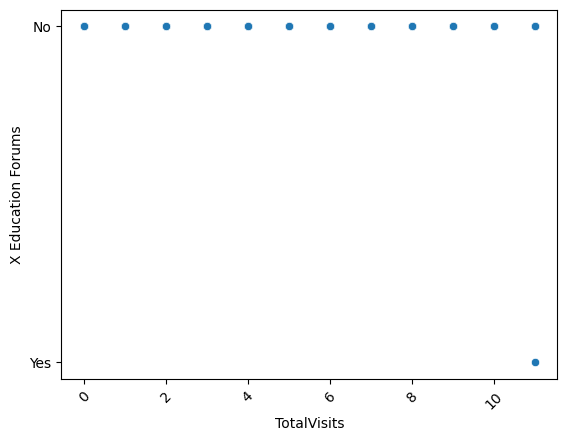

scatterplot TotalVisits Vs Newspaper


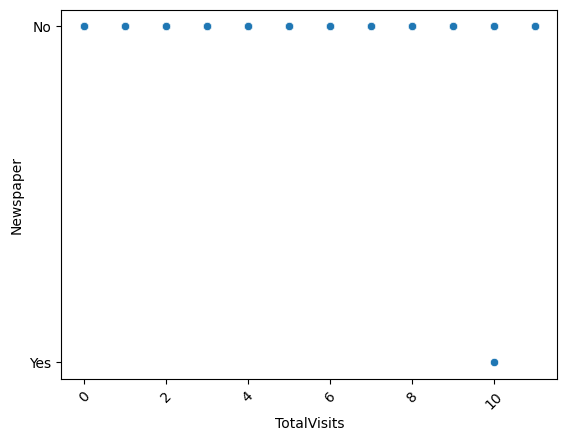

scatterplot TotalVisits Vs Digital Advertisement


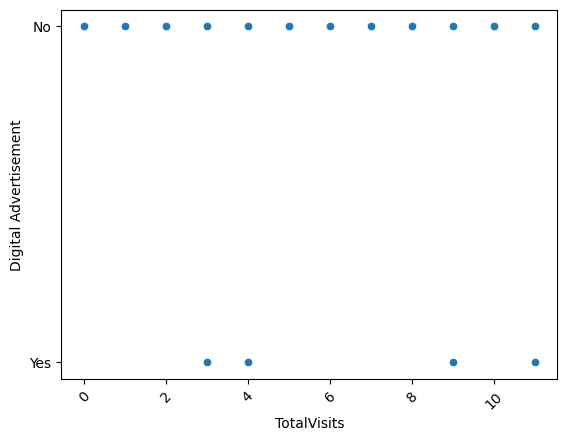

scatterplot TotalVisits Vs Through Recommendations


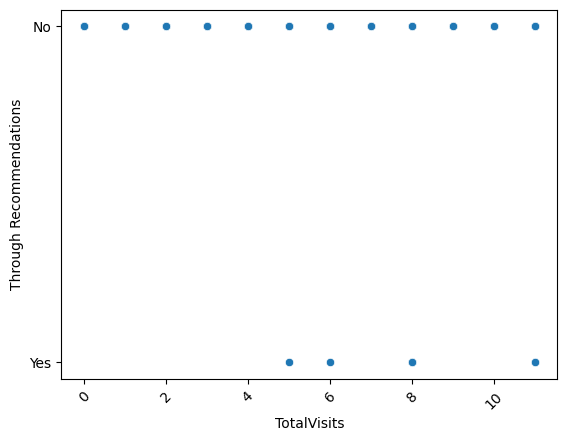

scatterplot TotalVisits Vs Receive More Updates About Our Courses


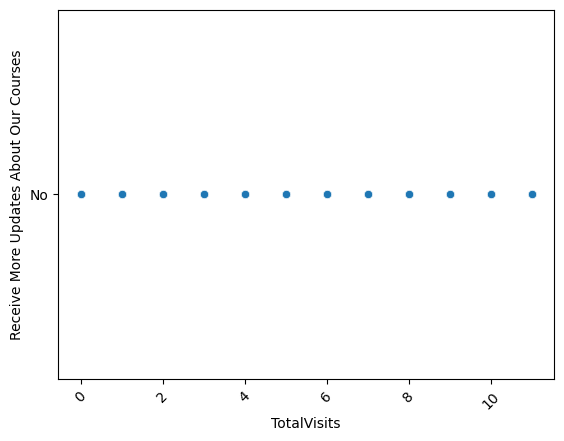

scatterplot TotalVisits Vs Tags


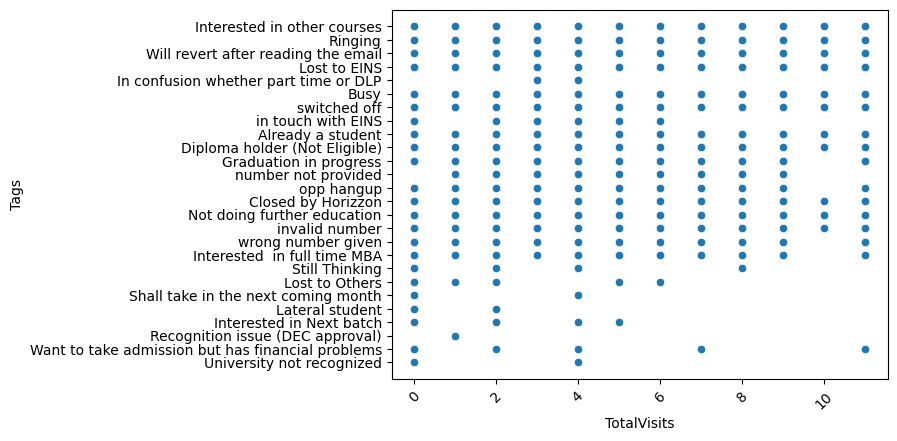

scatterplot TotalVisits Vs Update me on Supply Chain Content


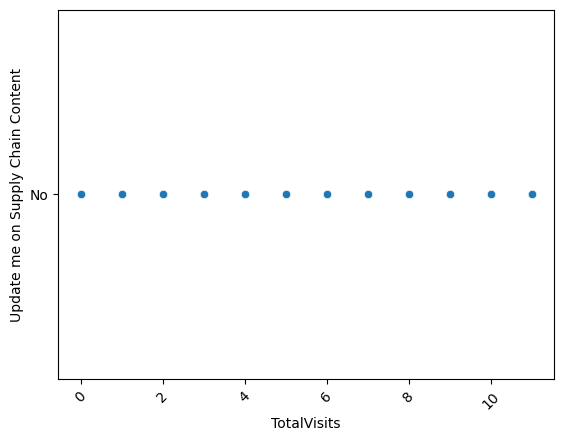

scatterplot TotalVisits Vs Get updates on DM Content


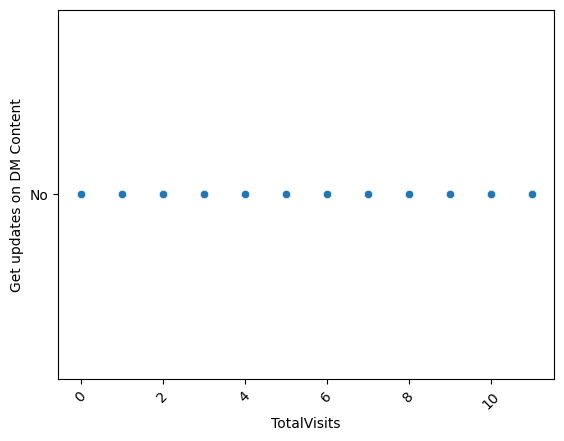

scatterplot TotalVisits Vs I agree to pay the amount through cheque


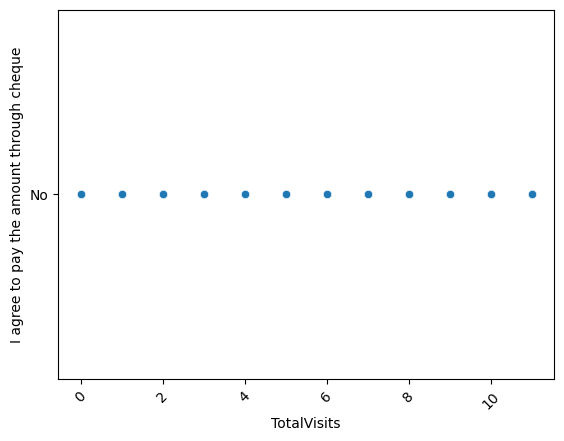

scatterplot TotalVisits Vs A free copy of Mastering The Interview


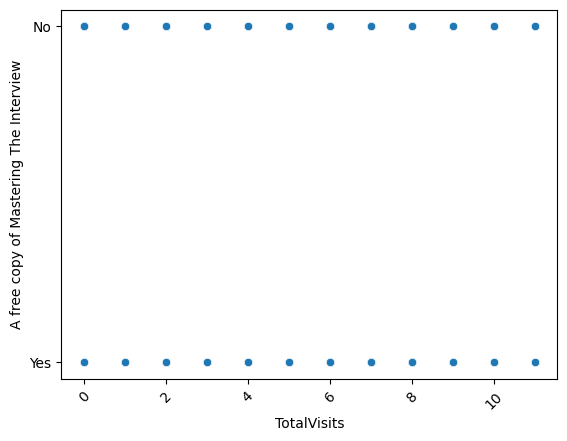

scatterplot TotalVisits Vs Last Notable Activity


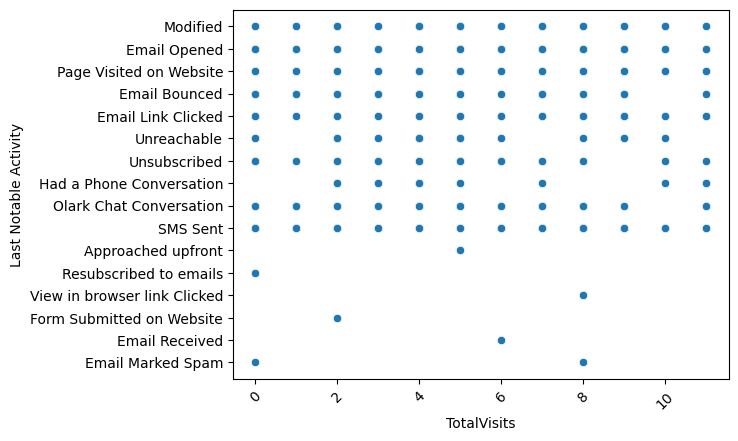

scatterplot Total Time Spent on Website Vs Lead Origin


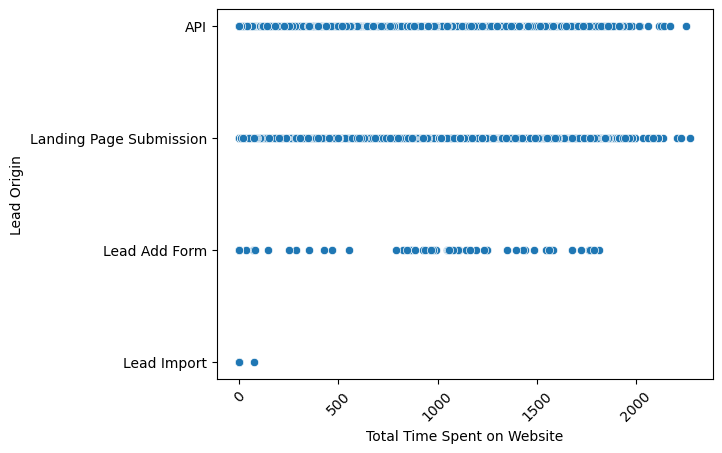

scatterplot Total Time Spent on Website Vs Lead Source


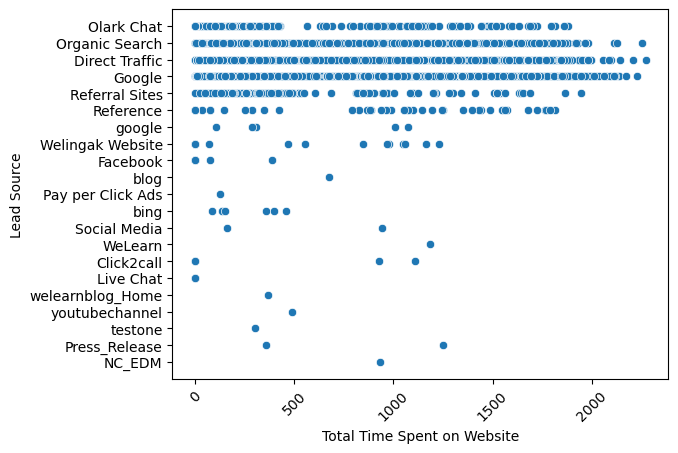

scatterplot Total Time Spent on Website Vs Do Not Email


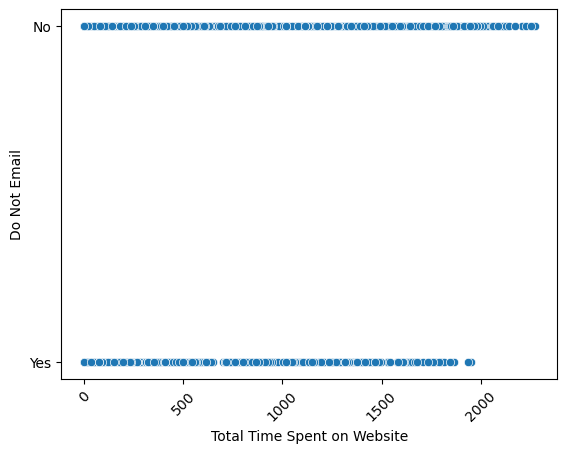

scatterplot Total Time Spent on Website Vs Do Not Call


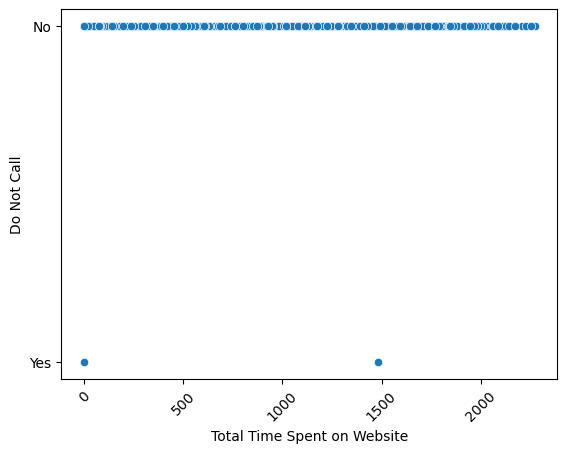

scatterplot Total Time Spent on Website Vs Converted


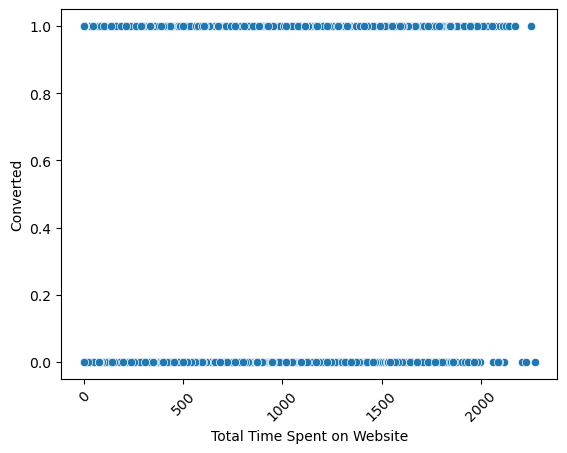

scatterplot Total Time Spent on Website Vs Last Activity


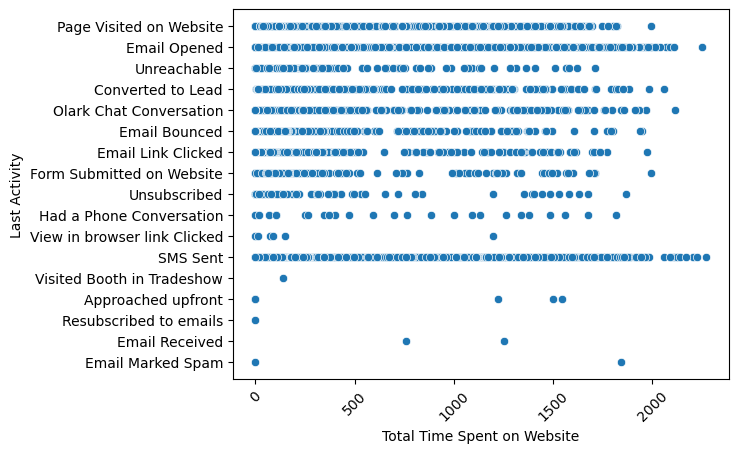

scatterplot Total Time Spent on Website Vs Country


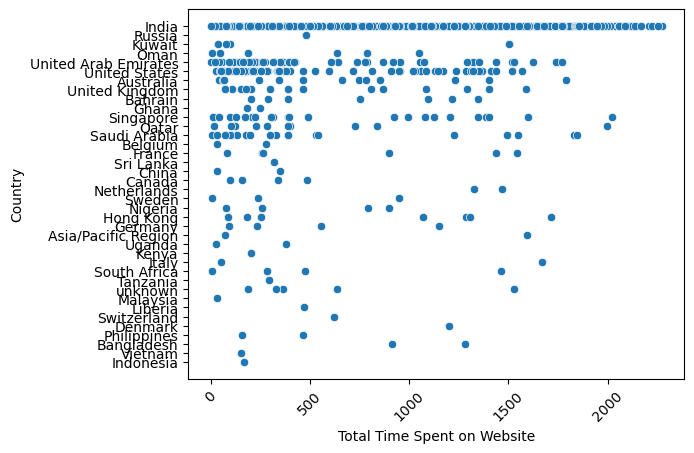

scatterplot Total Time Spent on Website Vs Specialization


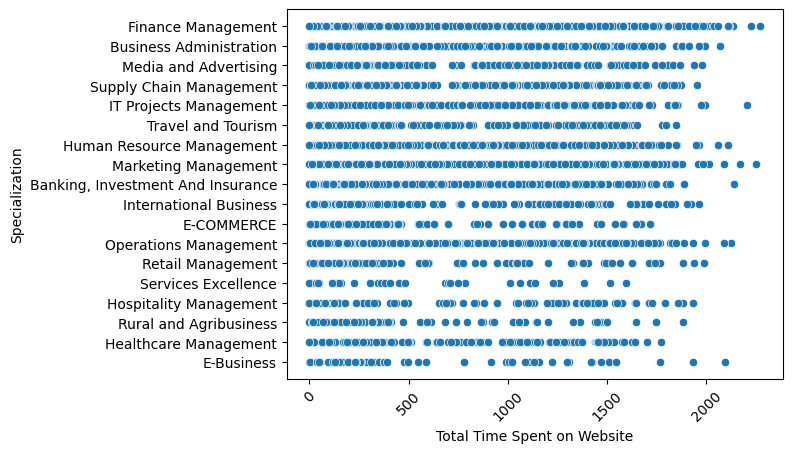

scatterplot Total Time Spent on Website Vs What is your current occupation


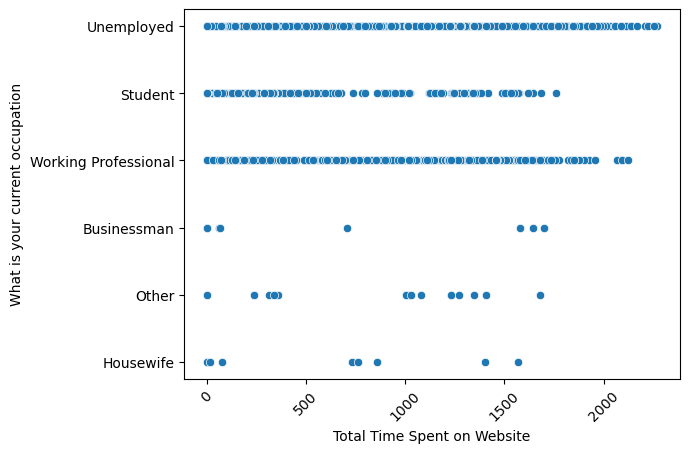

scatterplot Total Time Spent on Website Vs What matters most to you in choosing a course


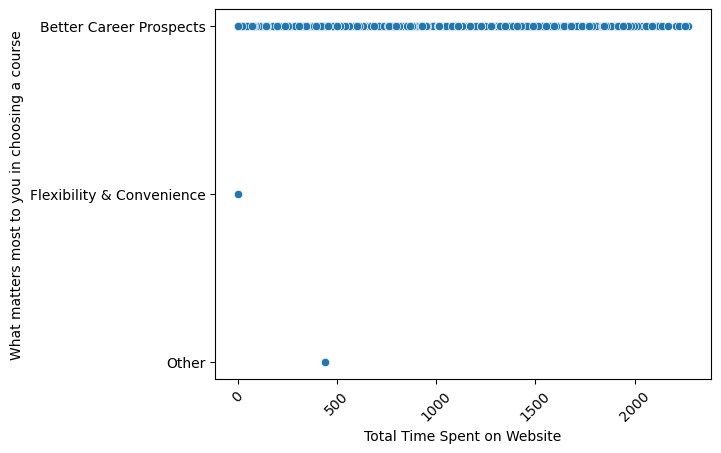

scatterplot Total Time Spent on Website Vs Search


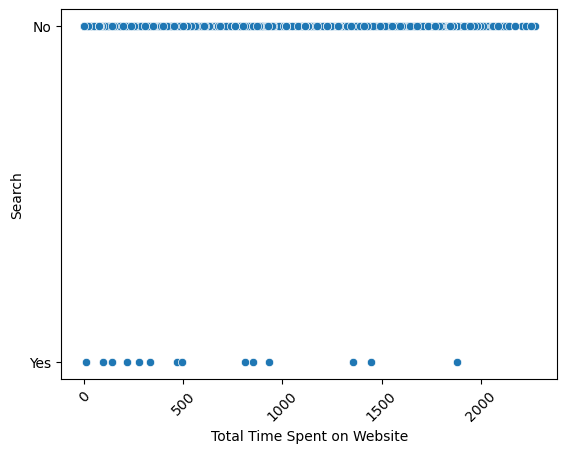

scatterplot Total Time Spent on Website Vs Magazine


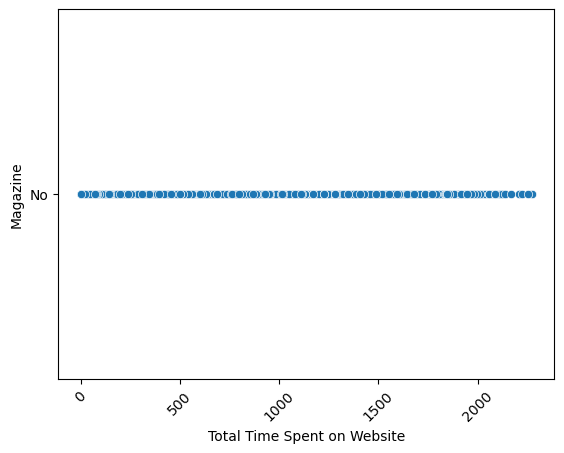

scatterplot Total Time Spent on Website Vs Newspaper Article


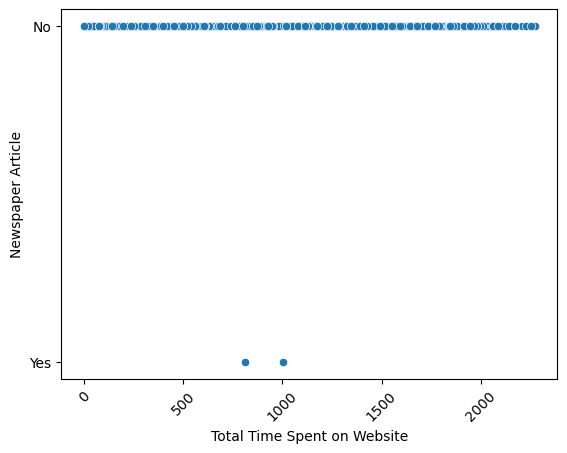

scatterplot Total Time Spent on Website Vs X Education Forums


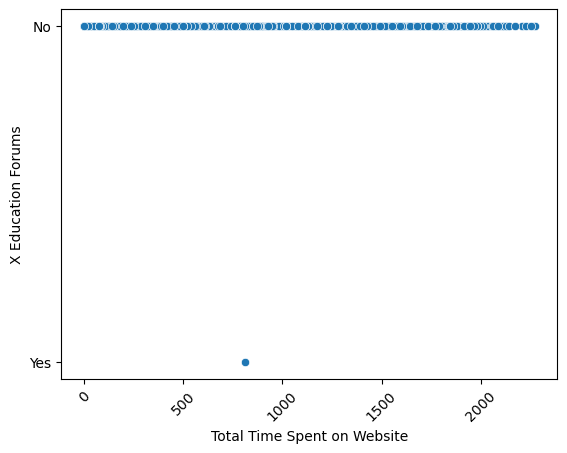

scatterplot Total Time Spent on Website Vs Newspaper


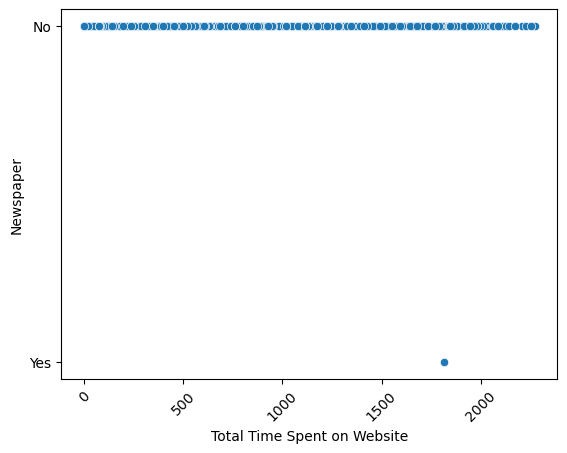

scatterplot Total Time Spent on Website Vs Digital Advertisement


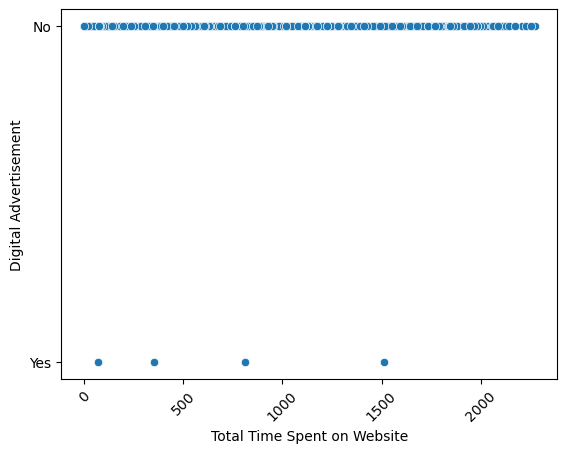

scatterplot Total Time Spent on Website Vs Through Recommendations


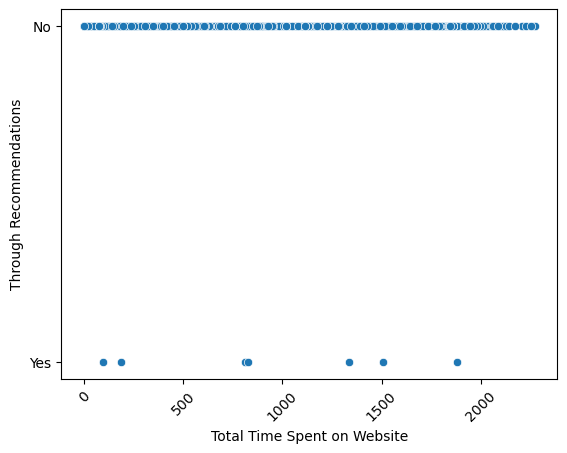

scatterplot Total Time Spent on Website Vs Receive More Updates About Our Courses


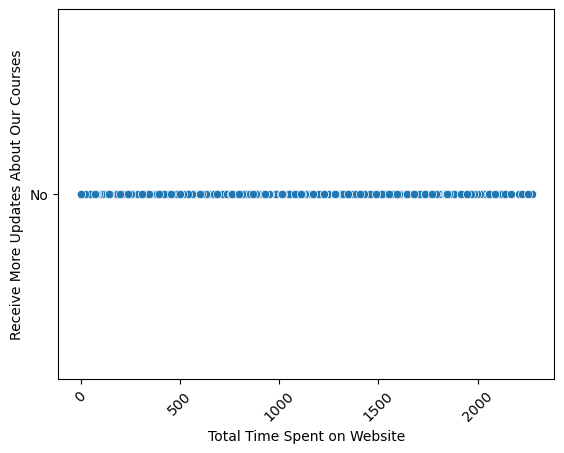

scatterplot Total Time Spent on Website Vs Tags


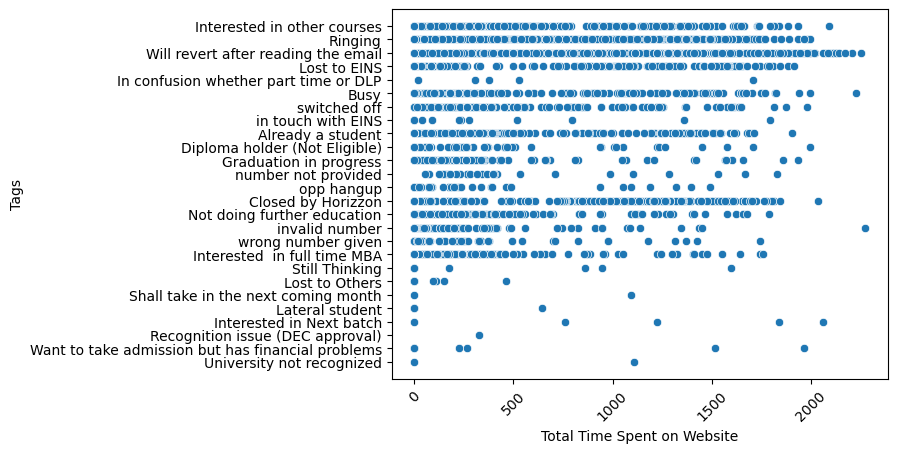

scatterplot Total Time Spent on Website Vs Update me on Supply Chain Content


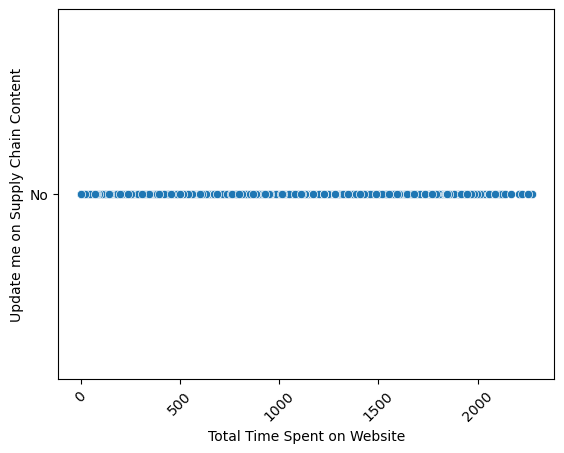

scatterplot Total Time Spent on Website Vs Get updates on DM Content


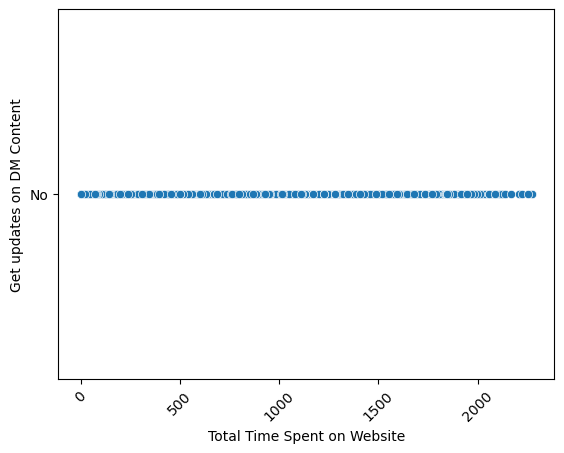

scatterplot Total Time Spent on Website Vs I agree to pay the amount through cheque


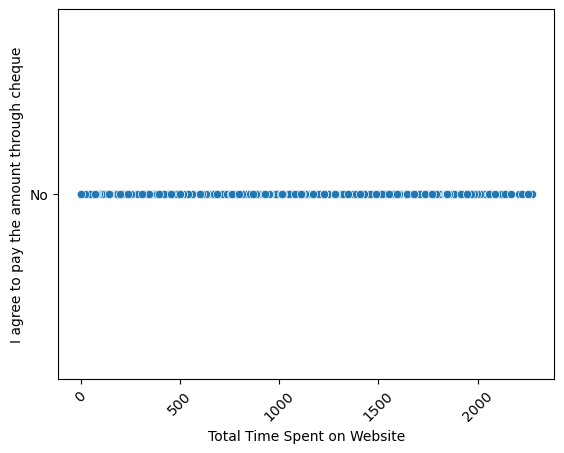

scatterplot Total Time Spent on Website Vs A free copy of Mastering The Interview


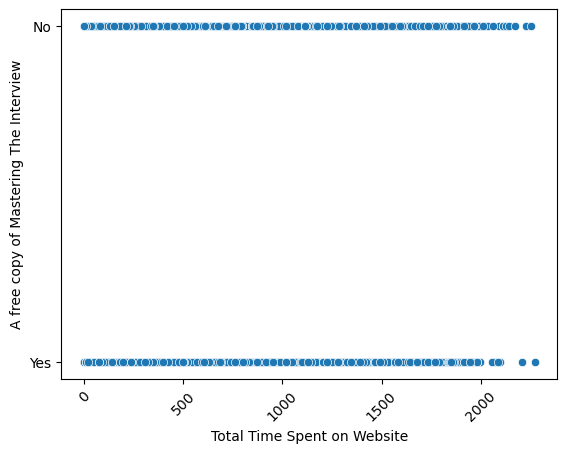

scatterplot Total Time Spent on Website Vs Last Notable Activity


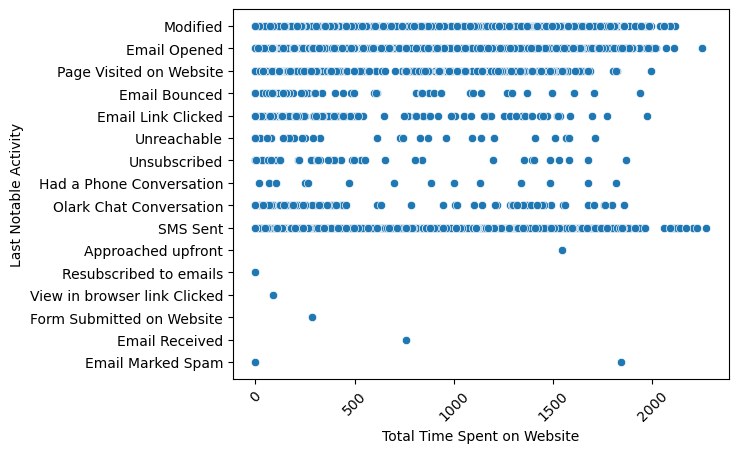

scatterplot Page Views Per Visit Vs Lead Origin


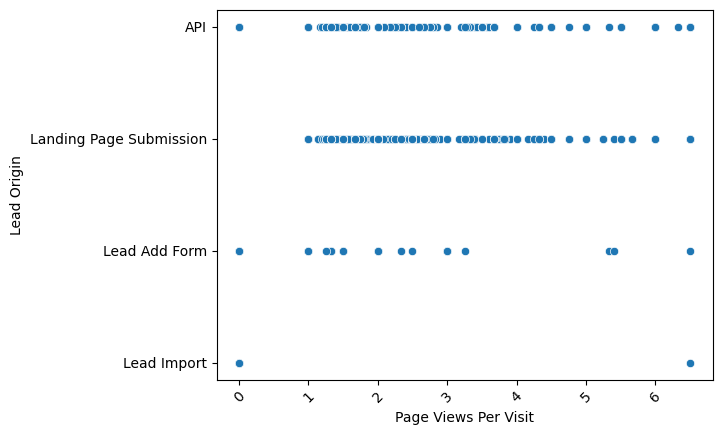

scatterplot Page Views Per Visit Vs Lead Source


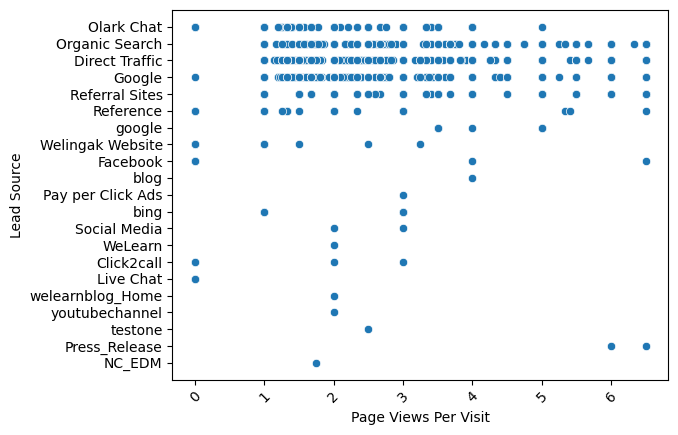

scatterplot Page Views Per Visit Vs Do Not Email


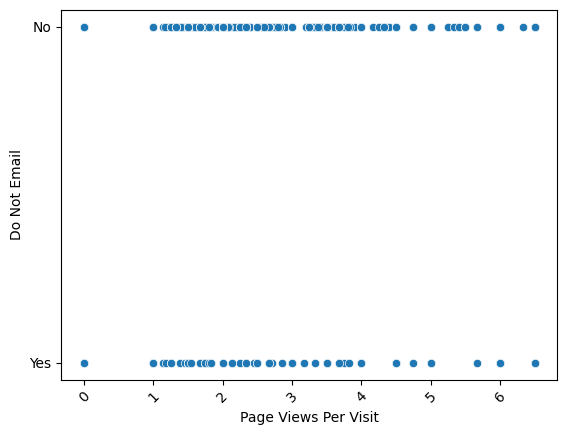

scatterplot Page Views Per Visit Vs Do Not Call


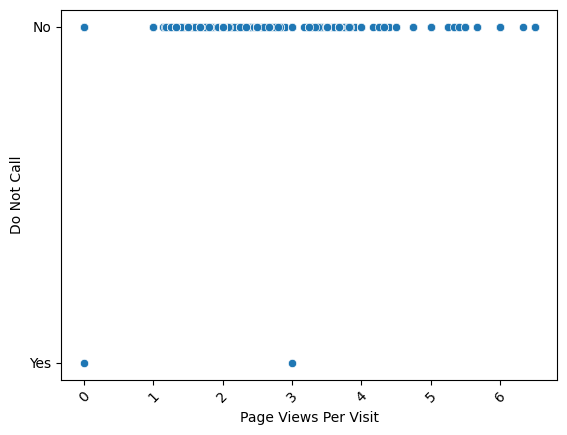

scatterplot Page Views Per Visit Vs Converted


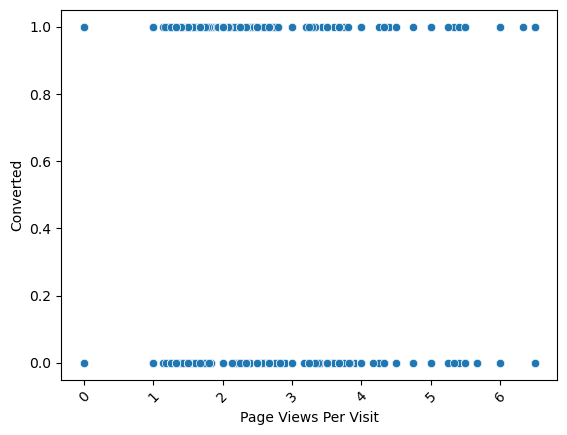

scatterplot Page Views Per Visit Vs Last Activity


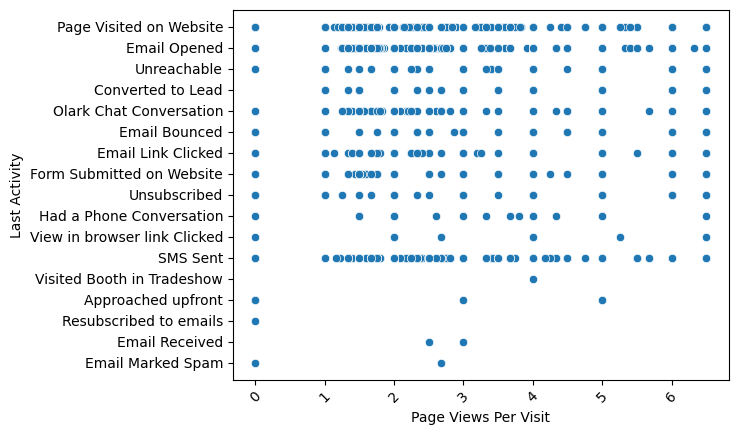

scatterplot Page Views Per Visit Vs Country


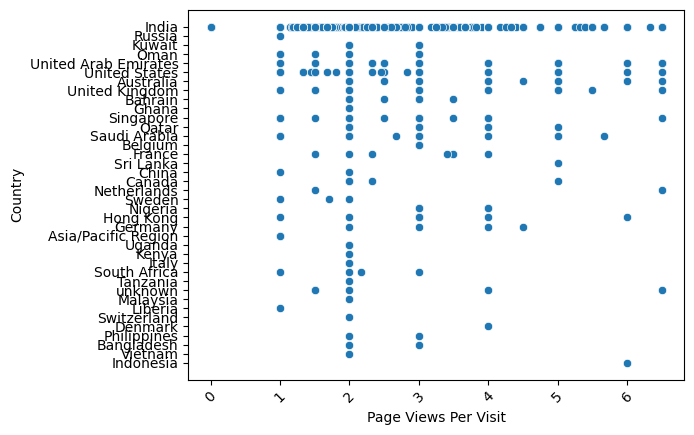

scatterplot Page Views Per Visit Vs Specialization


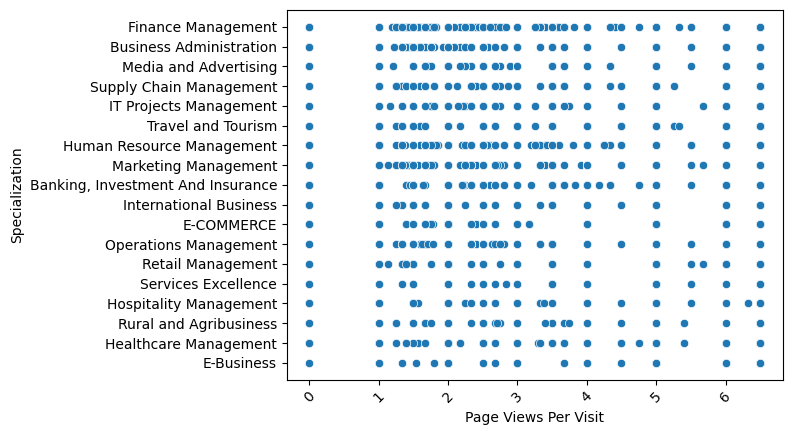

scatterplot Page Views Per Visit Vs What is your current occupation


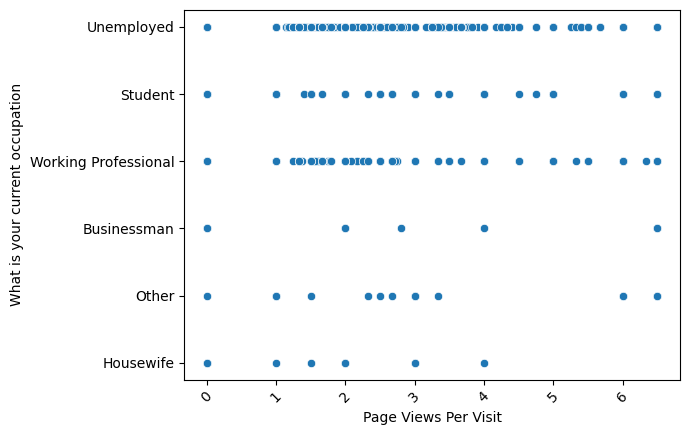

scatterplot Page Views Per Visit Vs What matters most to you in choosing a course


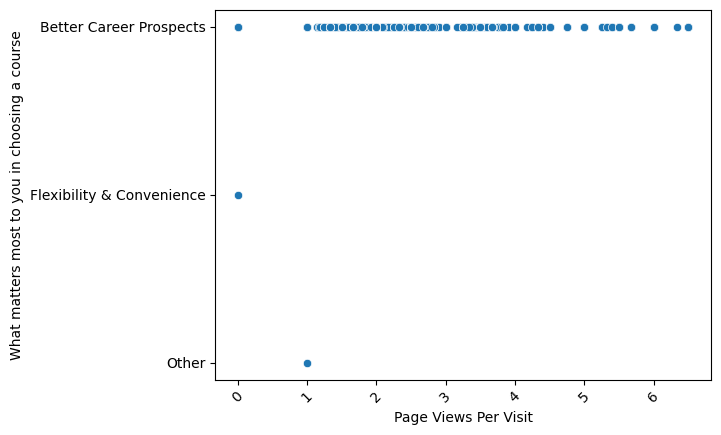

scatterplot Page Views Per Visit Vs Search


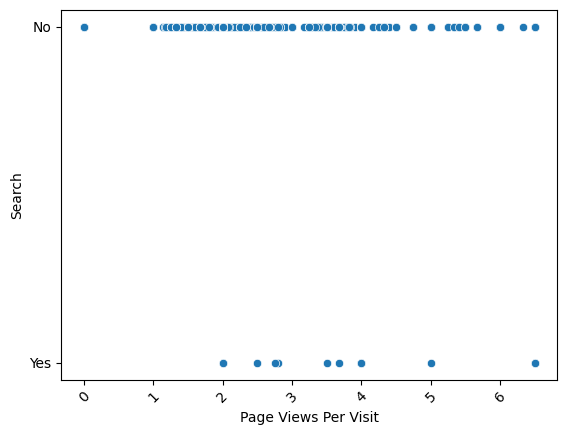

scatterplot Page Views Per Visit Vs Magazine


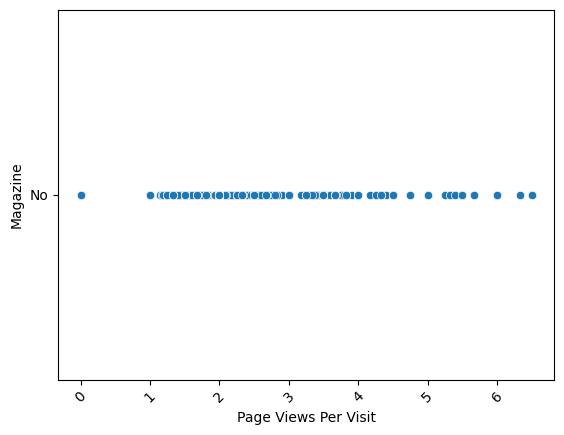

scatterplot Page Views Per Visit Vs Newspaper Article


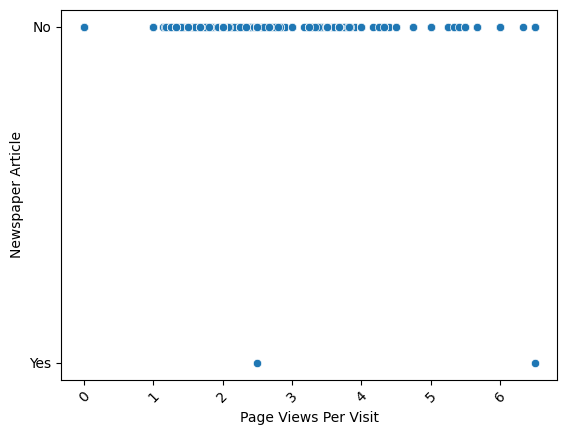

scatterplot Page Views Per Visit Vs X Education Forums


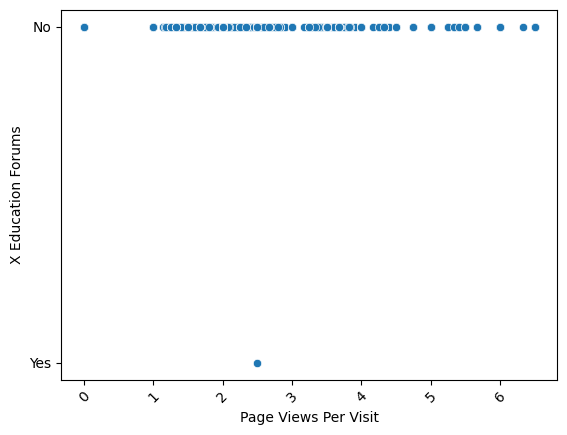

scatterplot Page Views Per Visit Vs Newspaper


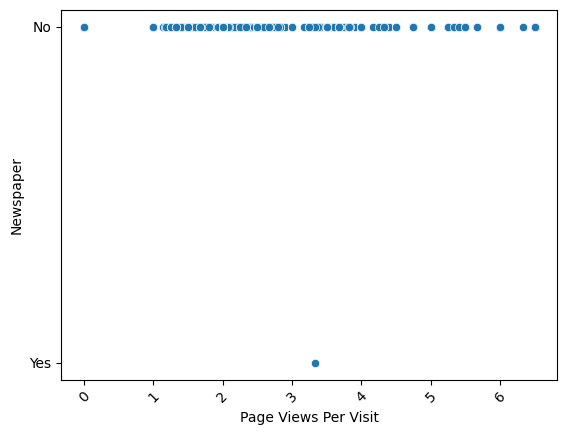

scatterplot Page Views Per Visit Vs Digital Advertisement


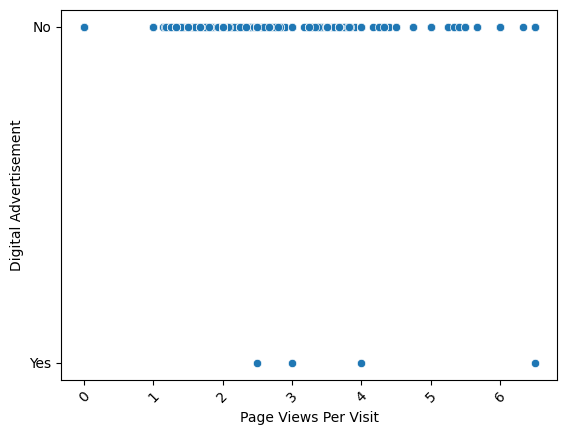

scatterplot Page Views Per Visit Vs Through Recommendations


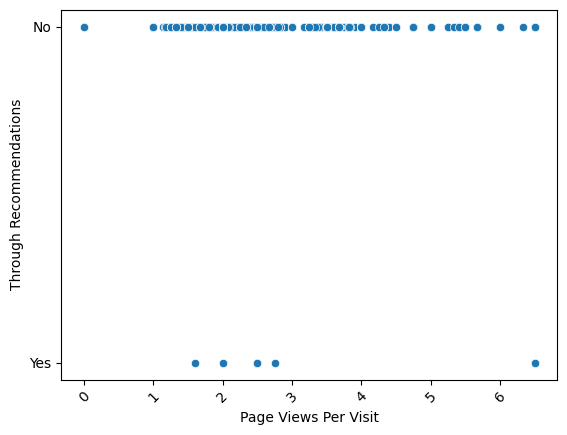

scatterplot Page Views Per Visit Vs Receive More Updates About Our Courses


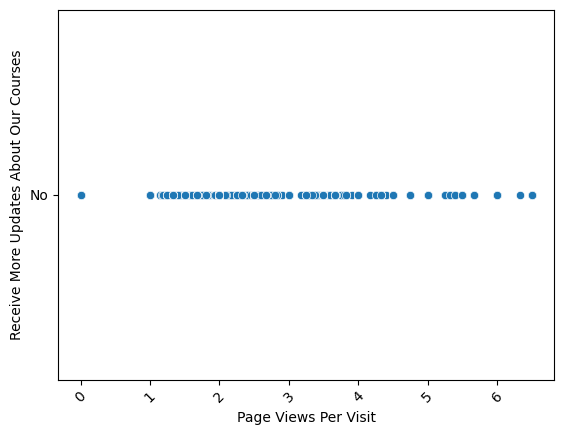

scatterplot Page Views Per Visit Vs Tags


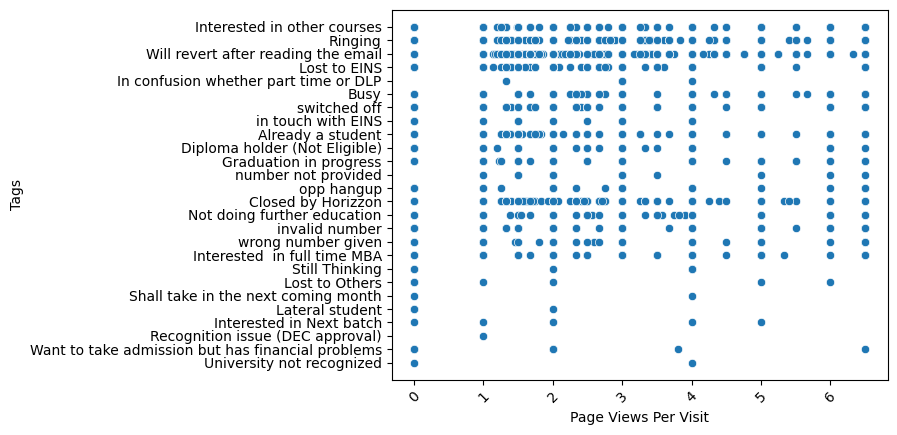

scatterplot Page Views Per Visit Vs Update me on Supply Chain Content


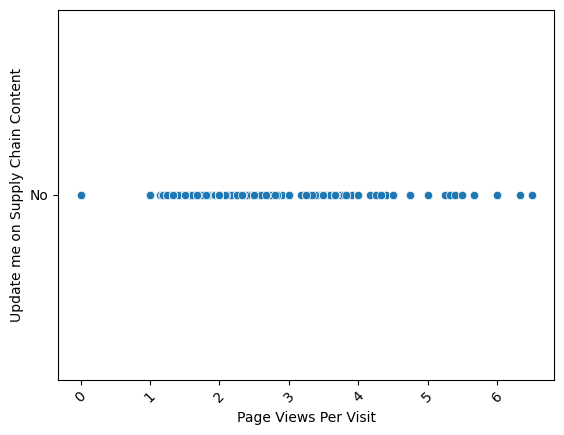

scatterplot Page Views Per Visit Vs Get updates on DM Content


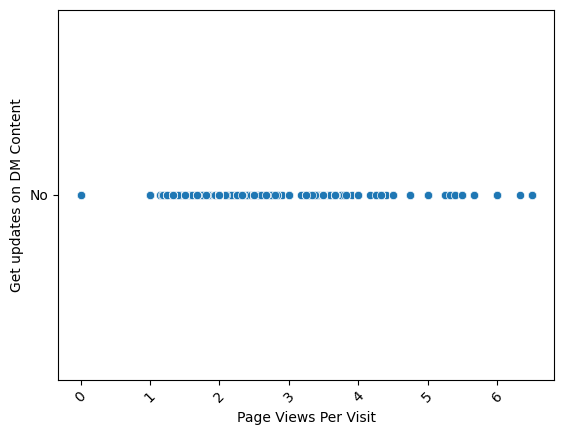

scatterplot Page Views Per Visit Vs I agree to pay the amount through cheque


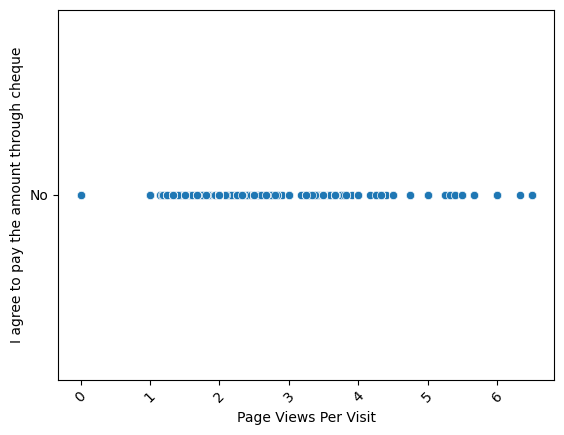

scatterplot Page Views Per Visit Vs A free copy of Mastering The Interview


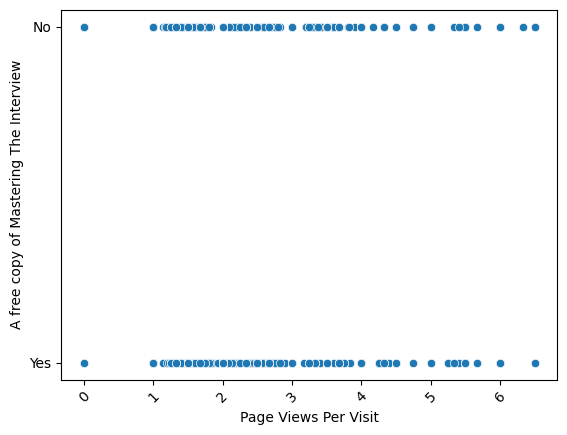

scatterplot Page Views Per Visit Vs Last Notable Activity


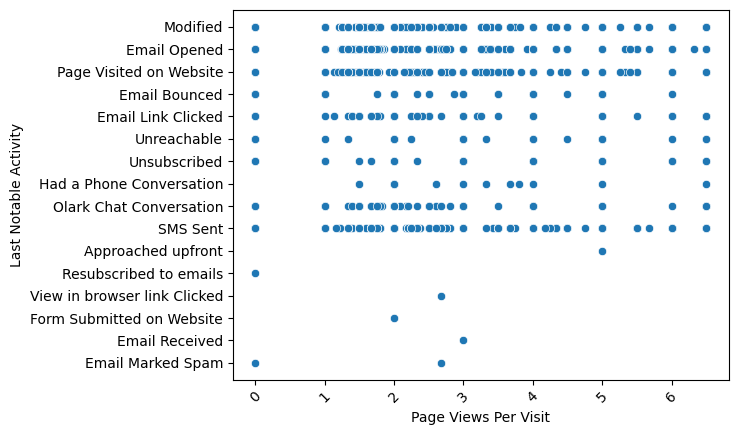

In [42]:
for i in num_cols:
    for j in cat_cols:
        if i != j:
            print("scatterplot",i, "Vs",j)
            sns.scatterplot(x=df[i],y =df[j])
            plt.xticks(rotation=45)  
            plt.show()

### F) BIVARAITE ANALYSIS OF NUMERICAL  COLUMS WITH THE TARGET COLUMN "CONVERTED":-

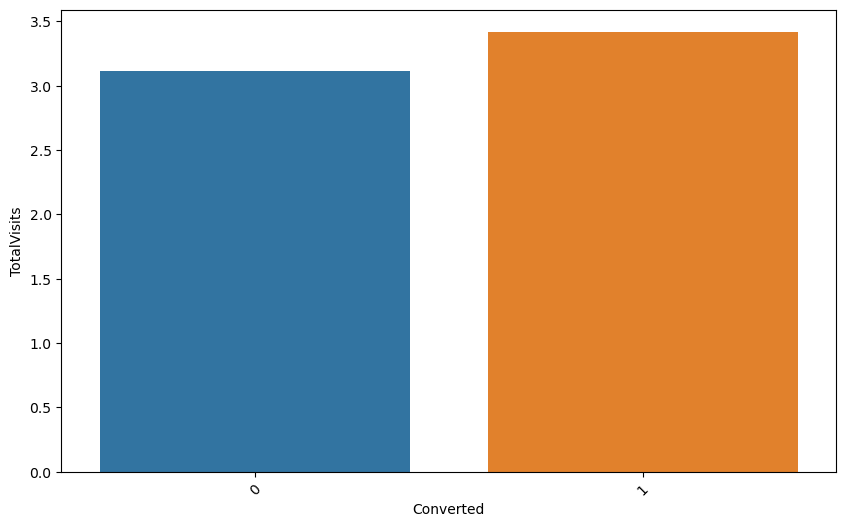

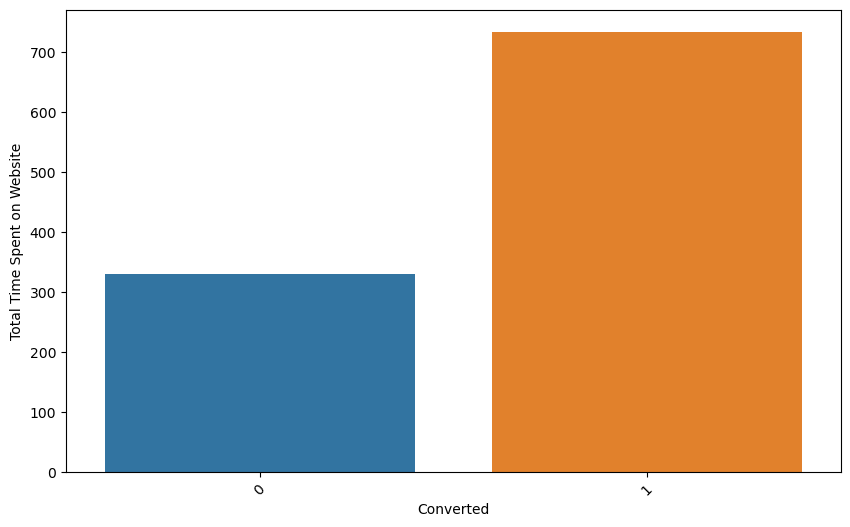

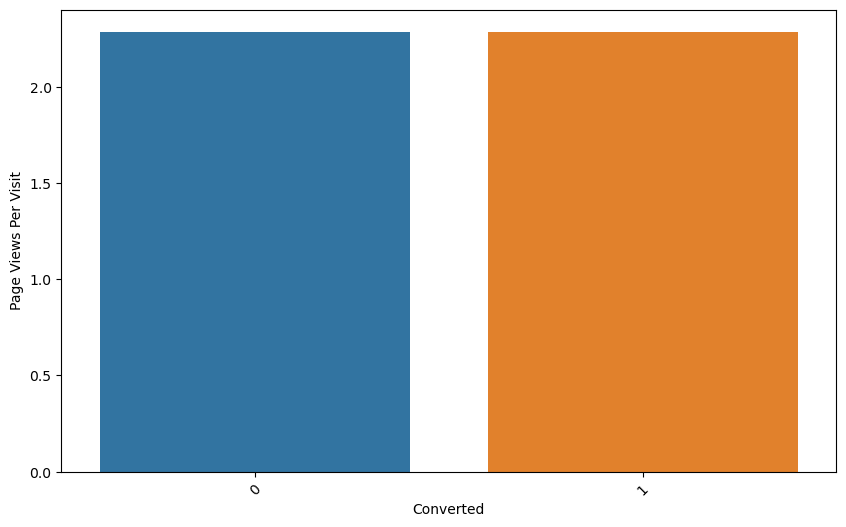

In [43]:
for col in  num_cols:
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x=df["Converted"],y=df[col],ci=None)
    plt.xticks(rotation=45)
    plt.show()

### G) BIVARAITE ANALYSIS OF CATEGORICAL COLUMS WITH THE TARGET COLUMN "CONVERTED":-

Landing Page Submission: Converted 0 - 63.83%, Converted 1 - 36.17%
API: Converted 0 - 68.84%, Converted 1 - 31.16%
Lead Add Form: Converted 0 - 6.37%, Converted 1 - 93.63%
Lead Import: Converted 0 - 70.00%, Converted 1 - 30.00%


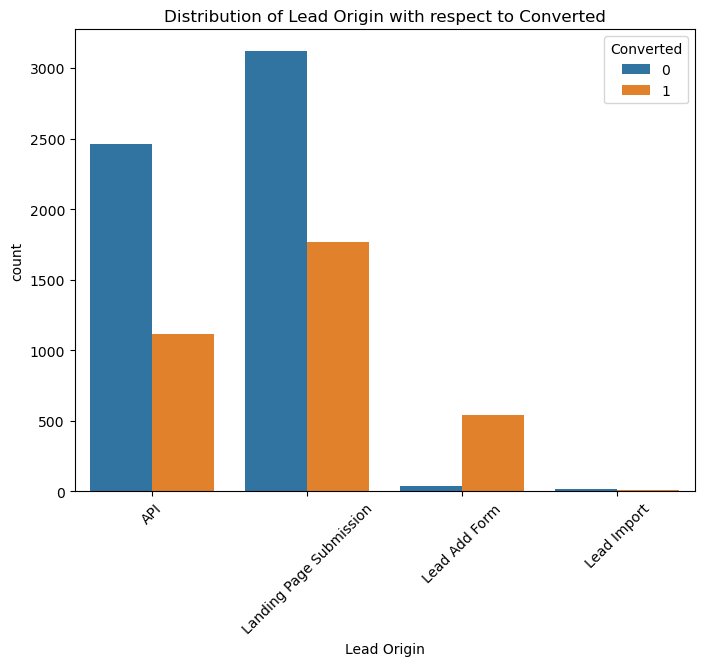

Google: Converted 0 - 60.01%, Converted 1 - 39.99%
Direct Traffic: Converted 0 - 67.83%, Converted 1 - 32.17%
Olark Chat: Converted 0 - 74.44%, Converted 1 - 25.56%
Organic Search: Converted 0 - 62.22%, Converted 1 - 37.78%
Reference: Converted 0 - 7.45%, Converted 1 - 92.55%
Welingak Website: Converted 0 - 1.55%, Converted 1 - 98.45%
Referral Sites: Converted 0 - 75.20%, Converted 1 - 24.80%
Facebook: Converted 0 - 70.97%, Converted 1 - 29.03%
bing: Converted 0 - 83.33%, Converted 1 - 16.67%
google: Converted 0 - 100.00%, Converted 1 - 0.00%
Click2call: Converted 0 - 25.00%, Converted 1 - 75.00%
Press_Release: Converted 0 - 100.00%, Converted 1 - 0.00%
Social Media: Converted 0 - 50.00%, Converted 1 - 50.00%
Live Chat: Converted 0 - 0.00%, Converted 1 - 100.00%
youtubechannel: Converted 0 - 100.00%, Converted 1 - 0.00%
testone: Converted 0 - 100.00%, Converted 1 - 0.00%
Pay per Click Ads: Converted 0 - 100.00%, Converted 1 - 0.00%
welearnblog_Home: Converted 0 - 100.00%, Converted 1 -

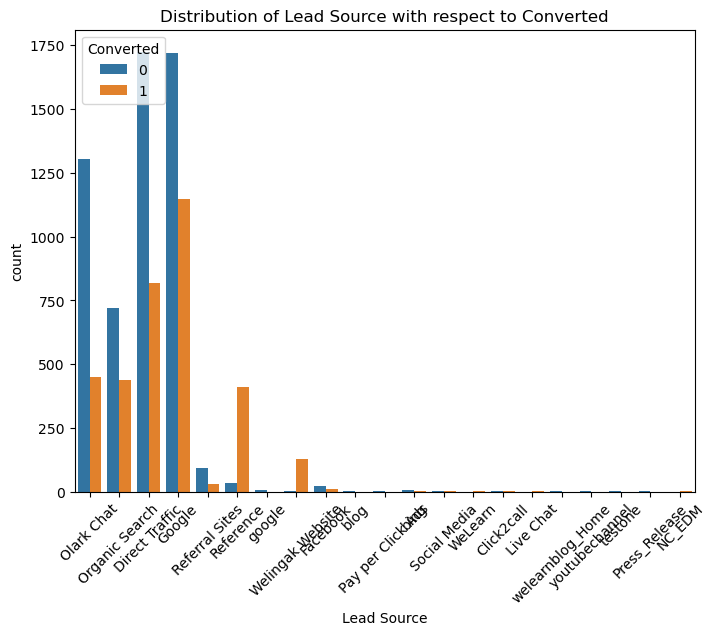

No: Converted 0 - 60.15%, Converted 1 - 39.85%
Yes: Converted 0 - 85.47%, Converted 1 - 14.53%


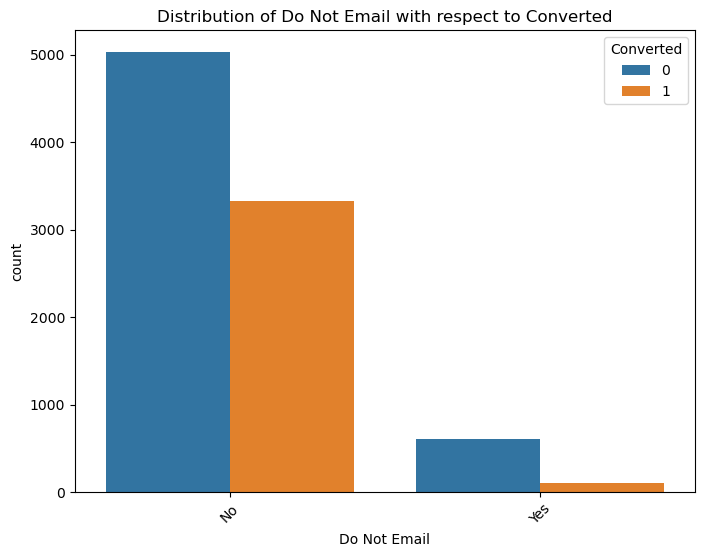

No: Converted 0 - 62.16%, Converted 1 - 37.84%
Yes: Converted 0 - 0.00%, Converted 1 - 100.00%


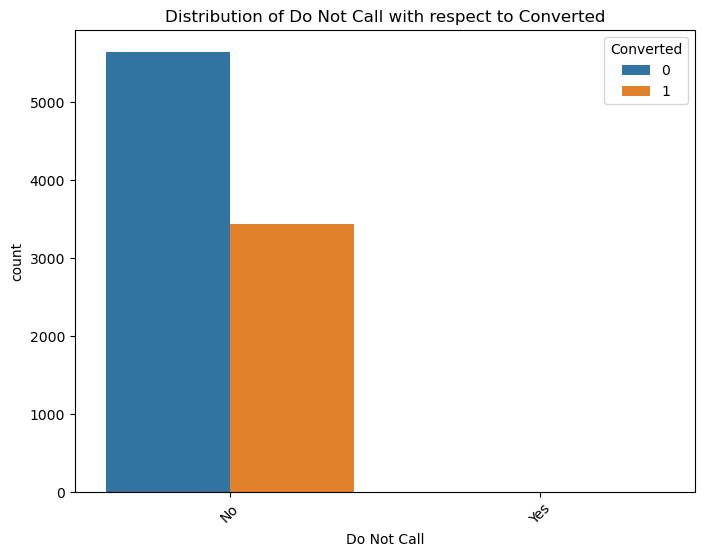

0: Converted 0 - 100.00%, Converted 1 - 0.00%
1: Converted 0 - 0.00%, Converted 1 - 100.00%


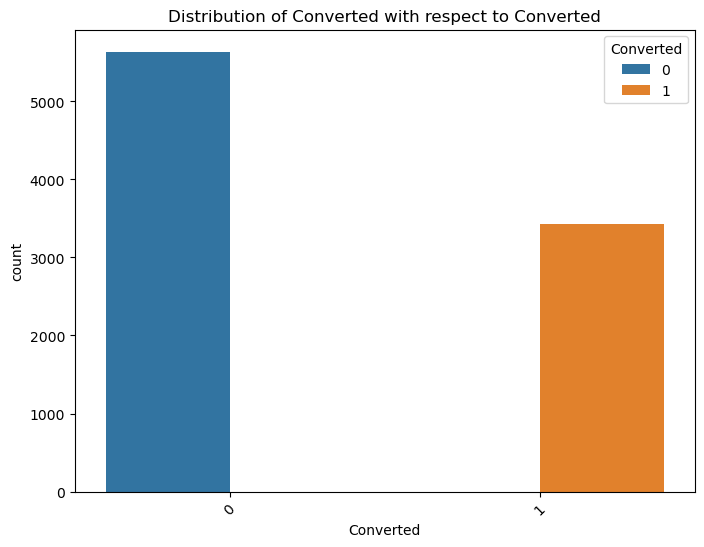

Email Opened: Converted 0 - 63.58%, Converted 1 - 36.42%
SMS Sent: Converted 0 - 37.22%, Converted 1 - 62.78%
Olark Chat Conversation: Converted 0 - 91.36%, Converted 1 - 8.64%
Page Visited on Website: Converted 0 - 76.41%, Converted 1 - 23.59%
Converted to Lead: Converted 0 - 87.38%, Converted 1 - 12.62%
Email Bounced: Converted 0 - 94.87%, Converted 1 - 5.13%
Email Link Clicked: Converted 0 - 72.66%, Converted 1 - 27.34%
Form Submitted on Website: Converted 0 - 75.86%, Converted 1 - 24.14%
Unreachable: Converted 0 - 67.78%, Converted 1 - 32.22%
Unsubscribed: Converted 0 - 76.27%, Converted 1 - 23.73%
Had a Phone Conversation: Converted 0 - 20.00%, Converted 1 - 80.00%
View in browser link Clicked: Converted 0 - 83.33%, Converted 1 - 16.67%
Approached upfront: Converted 0 - 0.00%, Converted 1 - 100.00%
Email Received: Converted 0 - 0.00%, Converted 1 - 100.00%
Email Marked Spam: Converted 0 - 0.00%, Converted 1 - 100.00%
Visited Booth in Tradeshow: Converted 0 - 100.00%, Converted 1 -

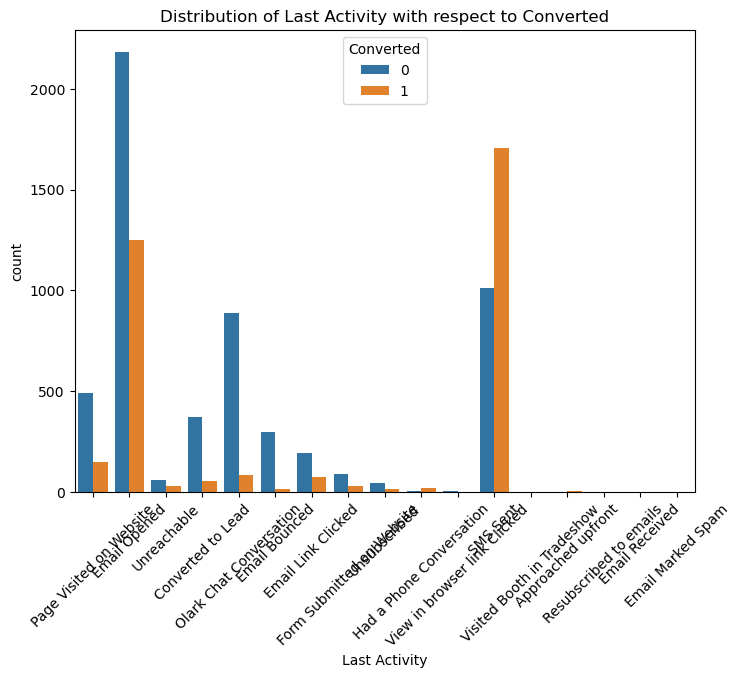

India: Converted 0 - 61.86%, Converted 1 - 38.14%
United States: Converted 0 - 73.91%, Converted 1 - 26.09%
United Arab Emirates: Converted 0 - 62.26%, Converted 1 - 37.74%
Singapore: Converted 0 - 54.17%, Converted 1 - 45.83%
Saudi Arabia: Converted 0 - 80.95%, Converted 1 - 19.05%
United Kingdom: Converted 0 - 66.67%, Converted 1 - 33.33%
Australia: Converted 0 - 76.92%, Converted 1 - 23.08%
Qatar: Converted 0 - 90.00%, Converted 1 - 10.00%
Hong Kong: Converted 0 - 42.86%, Converted 1 - 57.14%
Bahrain: Converted 0 - 42.86%, Converted 1 - 57.14%
Oman: Converted 0 - 50.00%, Converted 1 - 50.00%
France: Converted 0 - 50.00%, Converted 1 - 50.00%
unknown: Converted 0 - 80.00%, Converted 1 - 20.00%
South Africa: Converted 0 - 75.00%, Converted 1 - 25.00%
Nigeria: Converted 0 - 100.00%, Converted 1 - 0.00%
Germany: Converted 0 - 75.00%, Converted 1 - 25.00%
Kuwait: Converted 0 - 100.00%, Converted 1 - 0.00%
Canada: Converted 0 - 100.00%, Converted 1 - 0.00%
Sweden: Converted 0 - 66.67%, Co

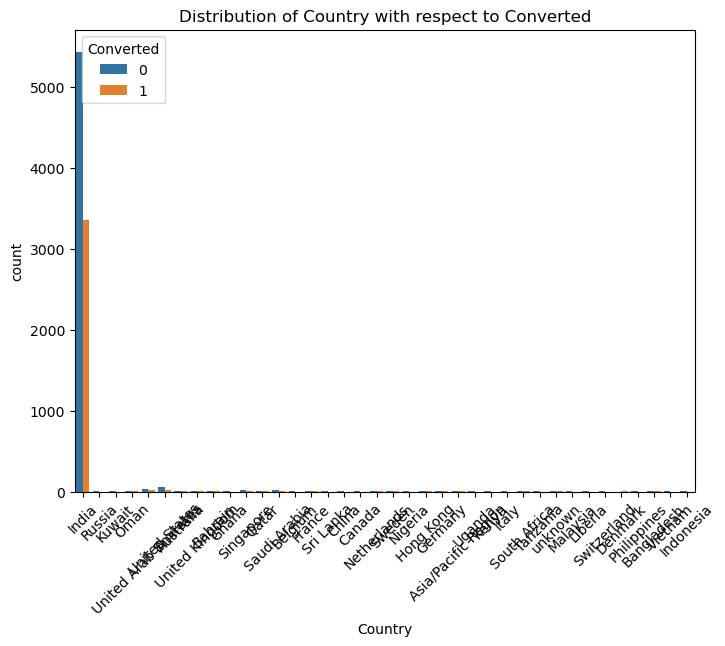

Finance Management: Converted 0 - 68.80%, Converted 1 - 31.20%
Human Resource Management: Converted 0 - 54.60%, Converted 1 - 45.40%
Marketing Management: Converted 0 - 51.76%, Converted 1 - 48.24%
Operations Management: Converted 0 - 53.11%, Converted 1 - 46.89%
Business Administration: Converted 0 - 56.14%, Converted 1 - 43.86%
IT Projects Management: Converted 0 - 61.75%, Converted 1 - 38.25%
Supply Chain Management: Converted 0 - 57.23%, Converted 1 - 42.77%
Banking, Investment And Insurance: Converted 0 - 51.04%, Converted 1 - 48.96%
Media and Advertising: Converted 0 - 58.42%, Converted 1 - 41.58%
Travel and Tourism: Converted 0 - 64.85%, Converted 1 - 35.15%
International Business: Converted 0 - 64.77%, Converted 1 - 35.23%
Healthcare Management: Converted 0 - 51.28%, Converted 1 - 48.72%
E-COMMERCE: Converted 0 - 64.86%, Converted 1 - 35.14%
Hospitality Management: Converted 0 - 59.46%, Converted 1 - 40.54%
Retail Management: Converted 0 - 66.00%, Converted 1 - 34.00%
Rural and

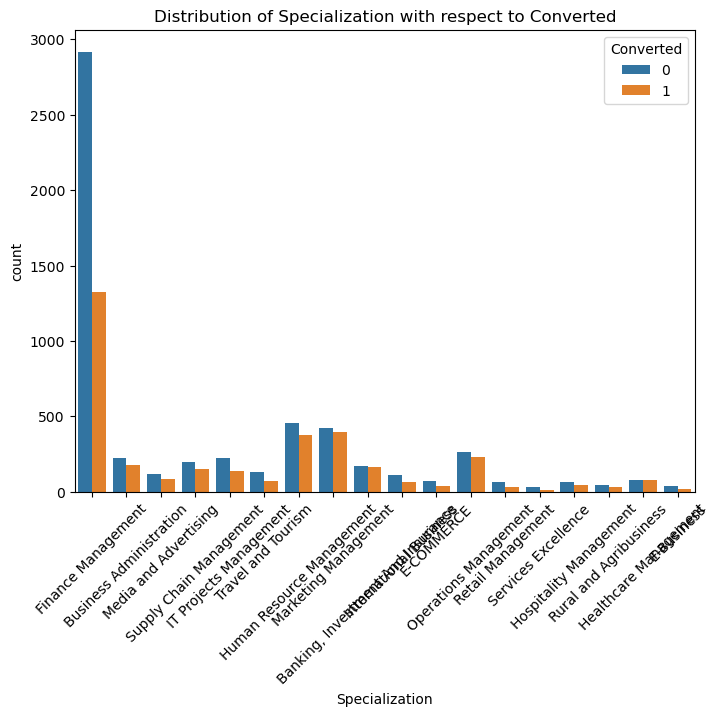

Unemployed: Converted 0 - 66.71%, Converted 1 - 33.29%
Working Professional: Converted 0 - 8.12%, Converted 1 - 91.88%
Student: Converted 0 - 64.08%, Converted 1 - 35.92%
Other: Converted 0 - 40.00%, Converted 1 - 60.00%
Housewife: Converted 0 - 0.00%, Converted 1 - 100.00%
Businessman: Converted 0 - 37.50%, Converted 1 - 62.50%


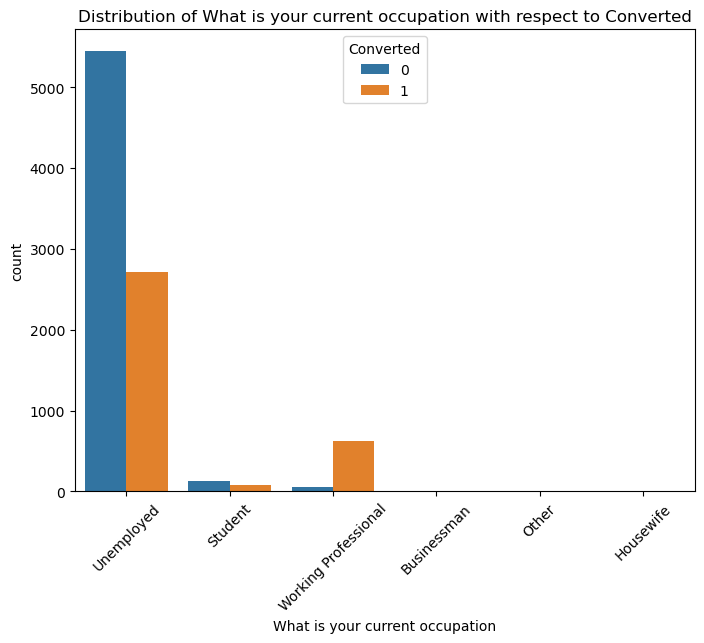

Better Career Prospects: Converted 0 - 62.15%, Converted 1 - 37.85%
Flexibility & Convenience: Converted 0 - 0.00%, Converted 1 - 100.00%
Other: Converted 0 - 100.00%, Converted 1 - 0.00%


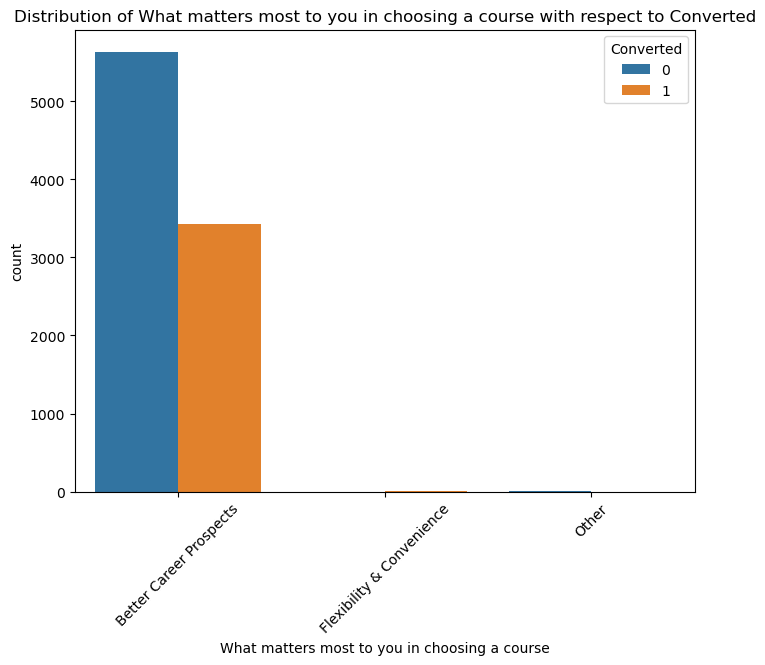

No: Converted 0 - 62.14%, Converted 1 - 37.86%
Yes: Converted 0 - 64.29%, Converted 1 - 35.71%


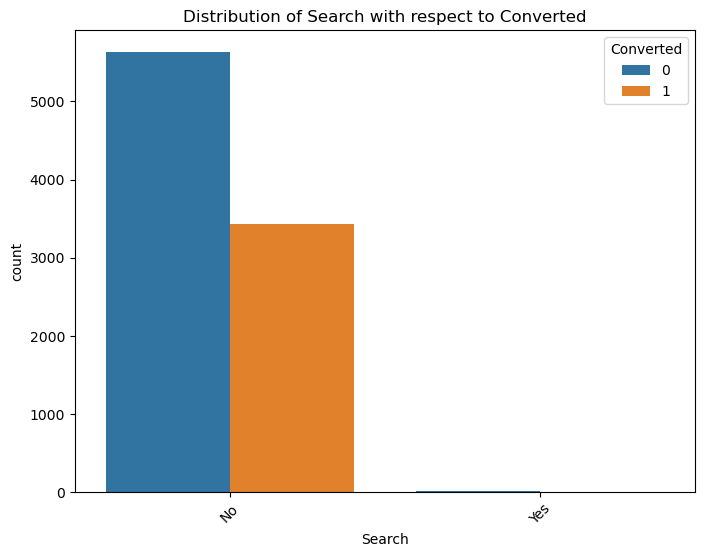

No: Converted 0 - 62.14%, Converted 1 - 37.86%


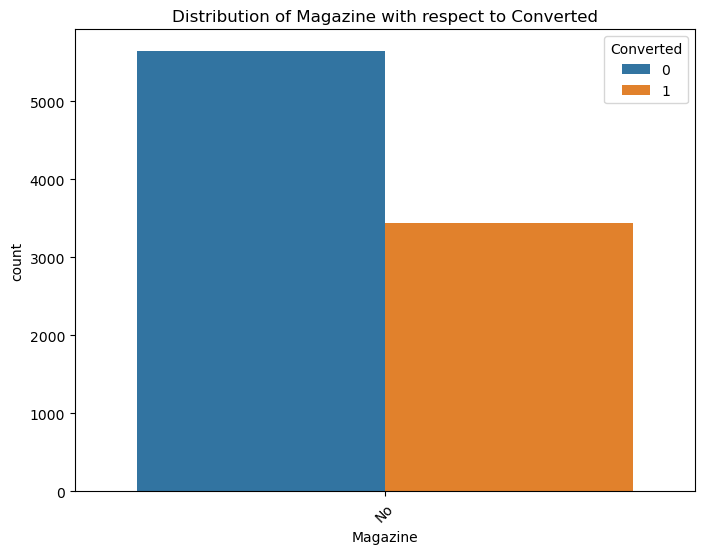

No: Converted 0 - 62.15%, Converted 1 - 37.85%
Yes: Converted 0 - 50.00%, Converted 1 - 50.00%


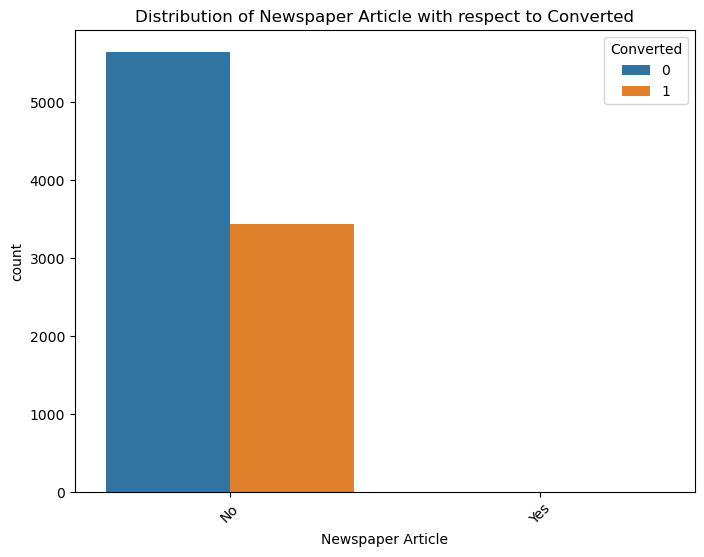

No: Converted 0 - 62.14%, Converted 1 - 37.86%
Yes: Converted 0 - 100.00%, Converted 1 - 0.00%


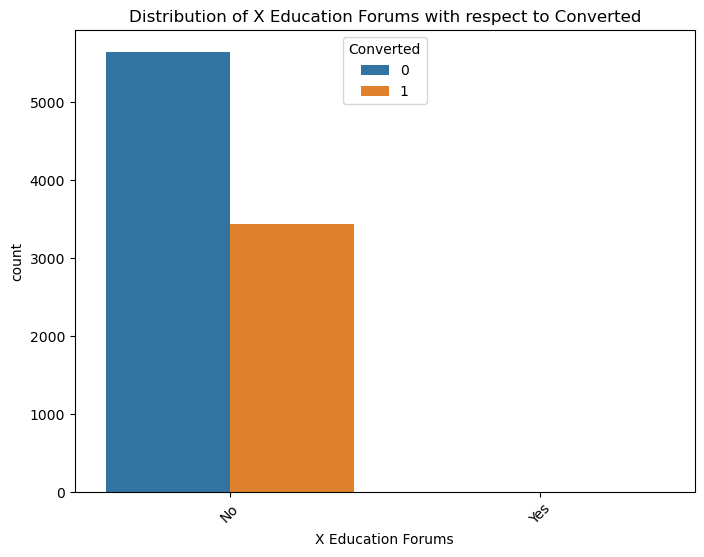

No: Converted 0 - 62.14%, Converted 1 - 37.86%
Yes: Converted 0 - 100.00%, Converted 1 - 0.00%


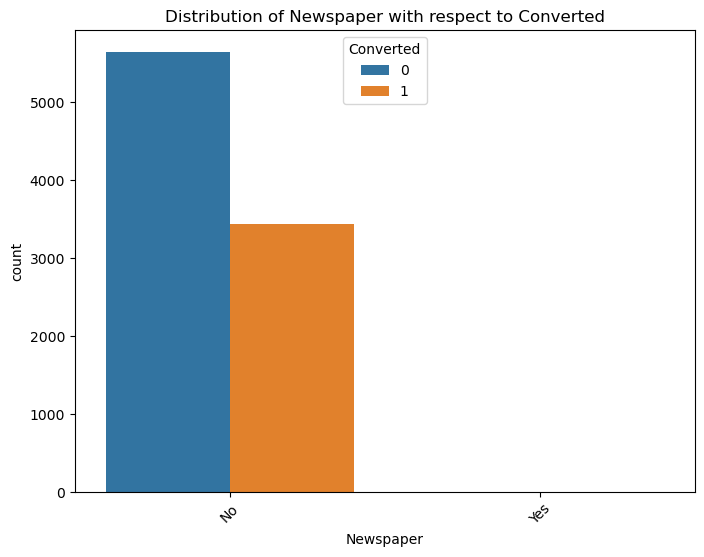

No: Converted 0 - 62.14%, Converted 1 - 37.86%
Yes: Converted 0 - 75.00%, Converted 1 - 25.00%


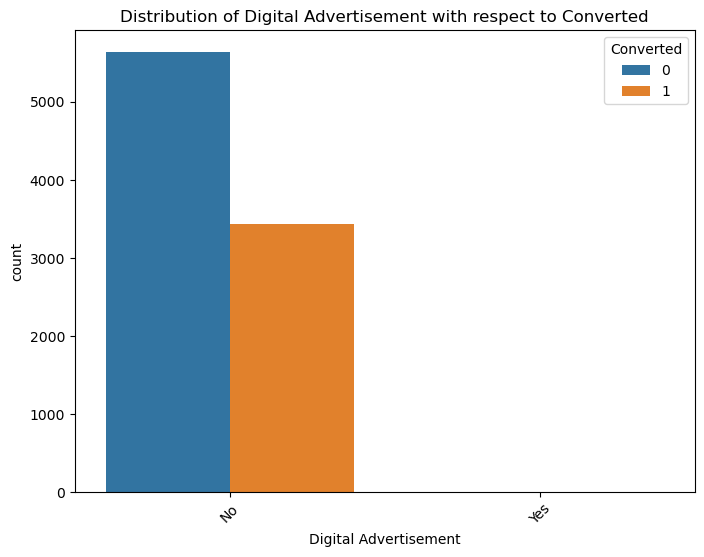

No: Converted 0 - 62.17%, Converted 1 - 37.83%
Yes: Converted 0 - 28.57%, Converted 1 - 71.43%


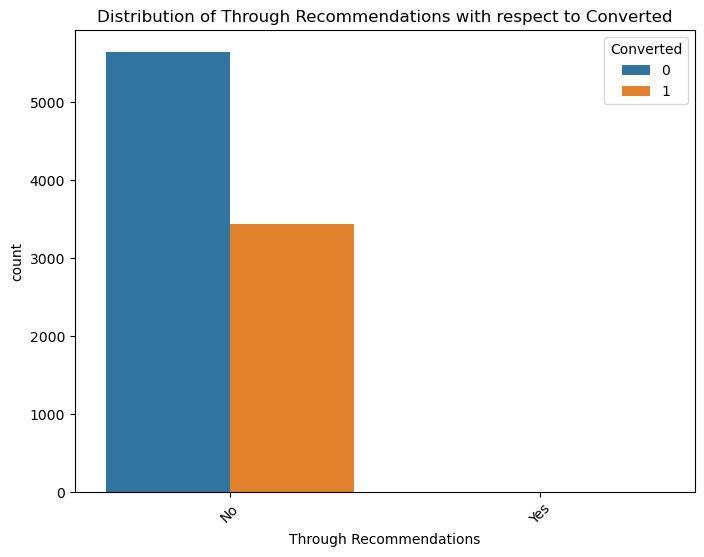

No: Converted 0 - 62.14%, Converted 1 - 37.86%


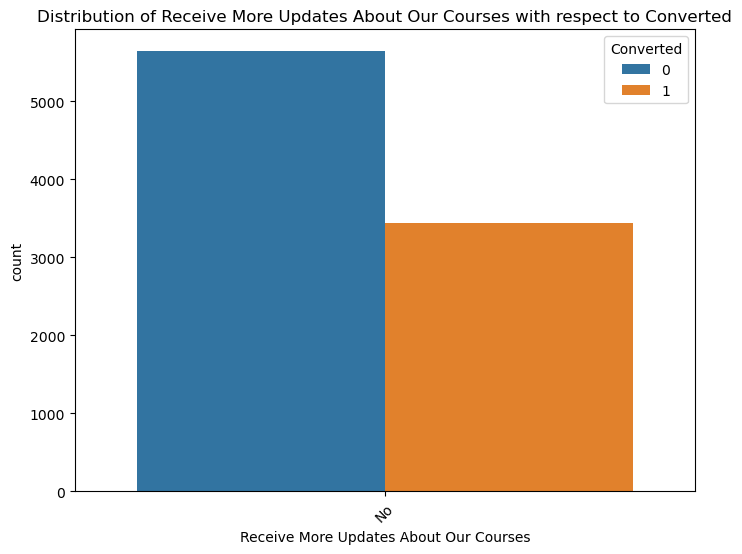

Will revert after reading the email: Converted 0 - 48.03%, Converted 1 - 51.97%
Ringing: Converted 0 - 97.14%, Converted 1 - 2.86%
Interested in other courses: Converted 0 - 97.45%, Converted 1 - 2.55%
Already a student: Converted 0 - 99.35%, Converted 1 - 0.65%
Closed by Horizzon: Converted 0 - 0.66%, Converted 1 - 99.34%
switched off: Converted 0 - 98.33%, Converted 1 - 1.67%
Busy: Converted 0 - 43.24%, Converted 1 - 56.76%
Lost to EINS: Converted 0 - 2.33%, Converted 1 - 97.67%
Not doing further education: Converted 0 - 99.31%, Converted 1 - 0.69%
Interested  in full time MBA: Converted 0 - 97.41%, Converted 1 - 2.59%
Graduation in progress: Converted 0 - 93.69%, Converted 1 - 6.31%
invalid number: Converted 0 - 98.80%, Converted 1 - 1.20%
Diploma holder (Not Eligible): Converted 0 - 98.41%, Converted 1 - 1.59%
wrong number given: Converted 0 - 100.00%, Converted 1 - 0.00%
opp hangup: Converted 0 - 90.91%, Converted 1 - 9.09%
number not provided: Converted 0 - 100.00%, Converted 1 -

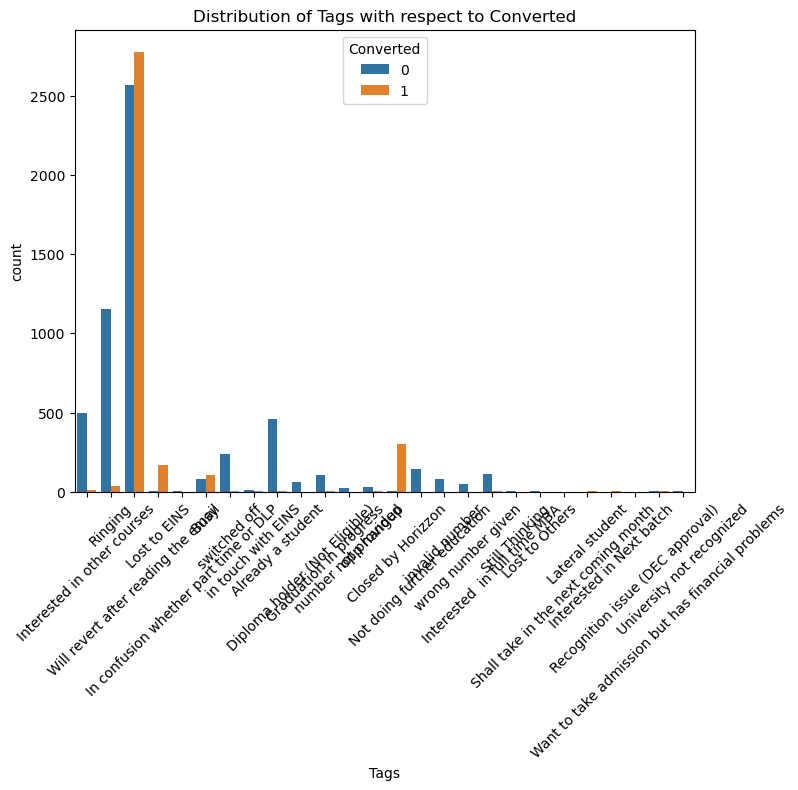

No: Converted 0 - 62.14%, Converted 1 - 37.86%


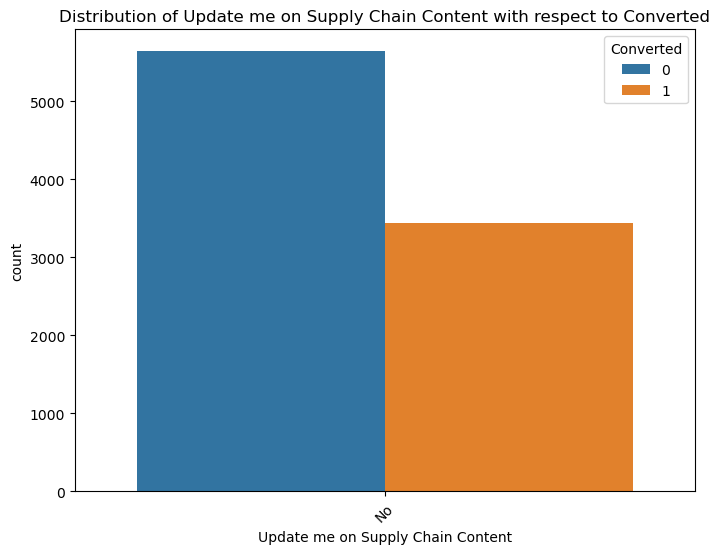

No: Converted 0 - 62.14%, Converted 1 - 37.86%


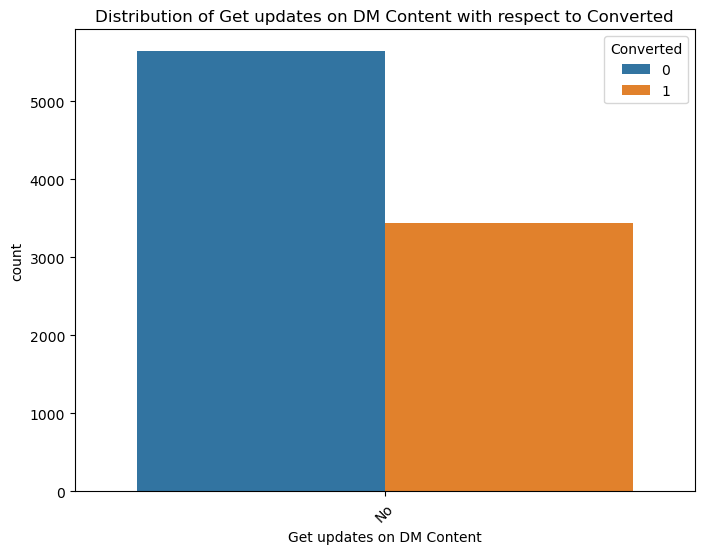

No: Converted 0 - 62.14%, Converted 1 - 37.86%


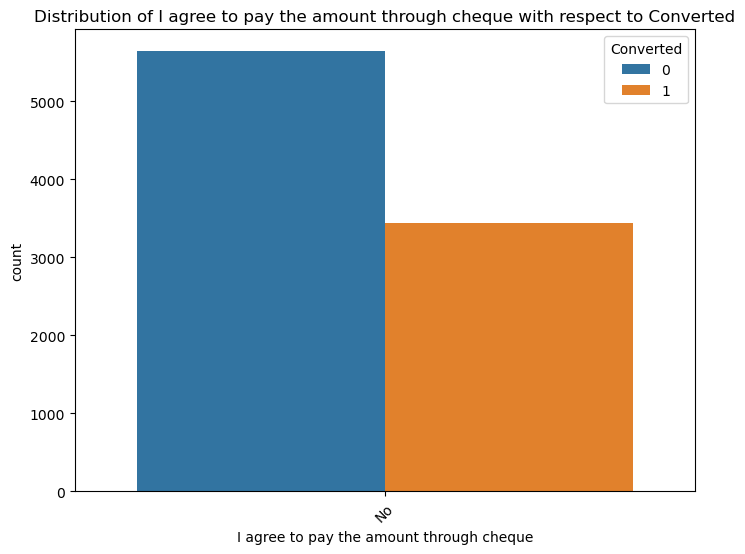

No: Converted 0 - 61.12%, Converted 1 - 38.88%
Yes: Converted 0 - 64.34%, Converted 1 - 35.66%


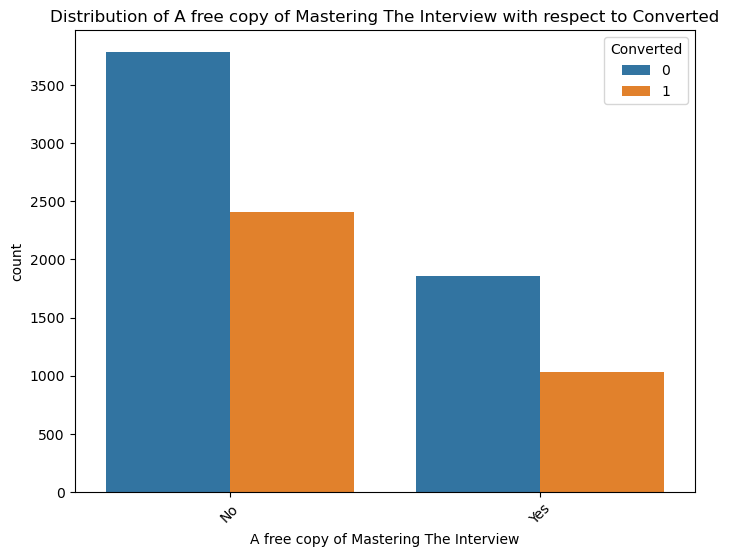

Modified: Converted 0 - 79.19%, Converted 1 - 20.81%
Email Opened: Converted 0 - 63.09%, Converted 1 - 36.91%
SMS Sent: Converted 0 - 30.81%, Converted 1 - 69.19%
Page Visited on Website: Converted 0 - 70.75%, Converted 1 - 29.25%
Olark Chat Conversation: Converted 0 - 86.34%, Converted 1 - 13.66%
Email Link Clicked: Converted 0 - 73.99%, Converted 1 - 26.01%
Email Bounced: Converted 0 - 85.00%, Converted 1 - 15.00%
Unsubscribed: Converted 0 - 73.33%, Converted 1 - 26.67%
Unreachable: Converted 0 - 31.25%, Converted 1 - 68.75%
Had a Phone Conversation: Converted 0 - 7.14%, Converted 1 - 92.86%
Email Marked Spam: Converted 0 - 0.00%, Converted 1 - 100.00%
Approached upfront: Converted 0 - 0.00%, Converted 1 - 100.00%
Resubscribed to emails: Converted 0 - 0.00%, Converted 1 - 100.00%
View in browser link Clicked: Converted 0 - 100.00%, Converted 1 - 0.00%
Form Submitted on Website: Converted 0 - 100.00%, Converted 1 - 0.00%
Email Received: Converted 0 - 0.00%, Converted 1 - 100.00%


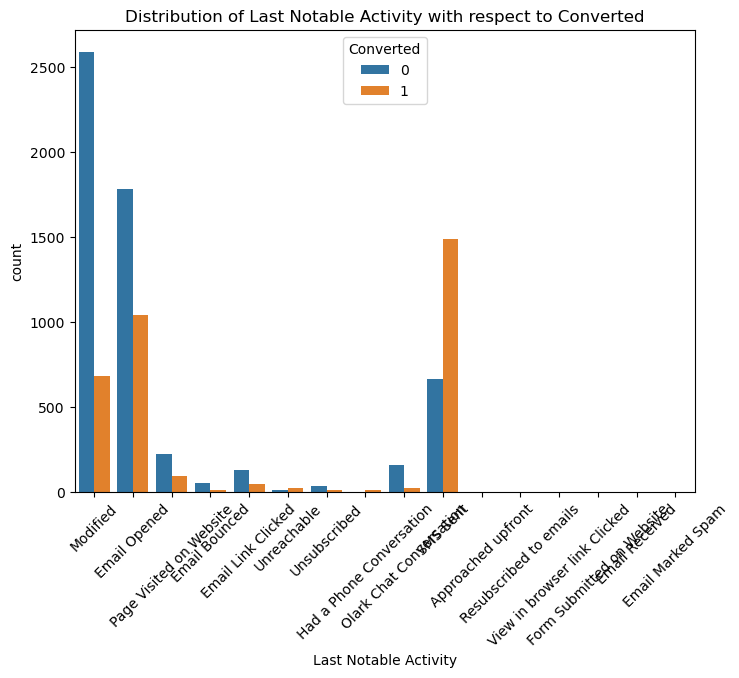

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the list of categorical columns
cat_cols = [ 'Lead Origin', 'Lead Source','Do Not Email', 'Do Not Call', 'Converted',
      'Last Activity','Country', 'Specialization', 'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity']

# Iterate through each categorical column
for col in cat_cols:
    plt.figure(figsize=(8, 6))
    
    # Plot countplot
    sns.countplot(data=df, x=col, hue='Converted')
    
    # Calculate percentage for each category
    total_count = df[col].value_counts()
    for i in range(len(total_count)):
        count_0 = df[(df[col] == total_count.index[i]) & (df['Converted'] == 0)].shape[0]
        count_1 = df[(df[col] == total_count.index[i]) & (df['Converted'] == 1)].shape[0]
        percent_0 = (count_0 / (count_0 + count_1)) * 100
        percent_1 = (count_1 / (count_0 + count_1)) * 100
        print(f"{total_count.index[i]}: Converted 0 - {percent_0:.2f}%, Converted 1 - {percent_1:.2f}%")
    
    plt.title(f'Distribution of {col} with respect to Converted')
    plt.xticks(rotation=45)
    plt.show()


## 3. MULTIVARIATE ANALYSIS:

<AxesSubplot:>

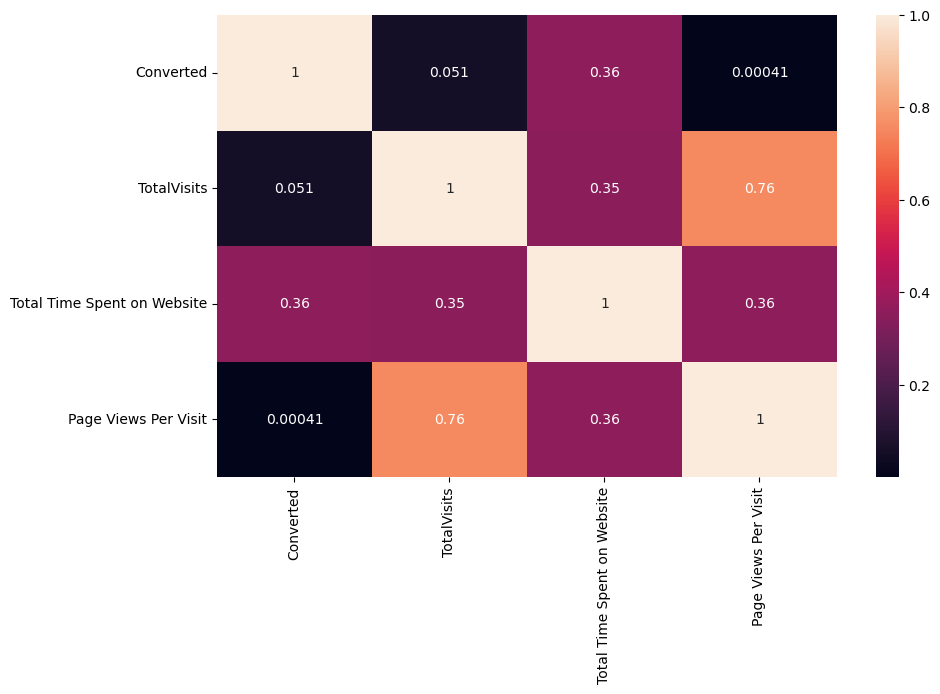

In [45]:
plt.figure(figsize =[10,6])
sns.heatmap(df.corr(),annot =True)

## 4. PAIRPLOT 

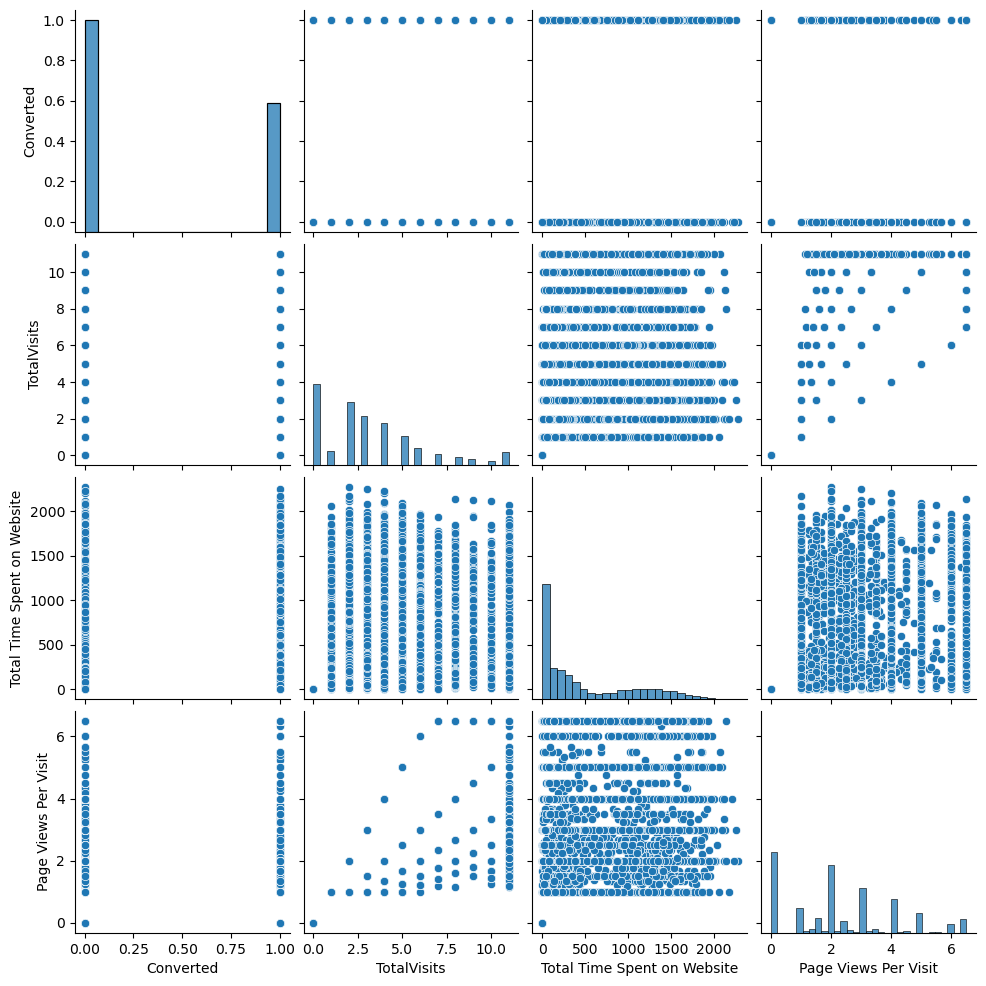

In [46]:
#plot the pair plot of ['Converted','TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit' ] in df: 
sns.pairplot(data=df, vars = ['Converted','TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit' ])
plt.show()

## insights from uni,bi and multi variate analysis:-

### 5. Distribution of the Target Variable

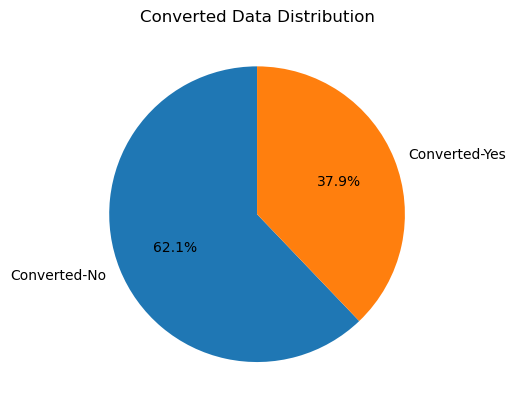

In [47]:
#Generate the Pie chart distribution of the Target Variable
explode = (0.1, 0.1) 
pie_labels = ['Converted-No', 'Converted-Yes']
pie_sizes_m = df['Converted'].value_counts()/len(df.index) * 100
plt.pie(pie_sizes_m, labels=pie_labels, autopct='%1.1f%%', startangle=90)
plt.title('Converted Data Distribution')

plt.show()

### we have decided to drop these following columns since the count plot are mostly one sided value "NO".
No use for analysis.

In [48]:
df.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Converted', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [49]:
df = df.drop(['Search', 'Magazine','Country','X Education Forums', 'Newspaper Article', 'Newspaper','Digital Advertisement',
              'Through Recommendations','Receive More Updates About Our Courses','Update me on Supply Chain Content',
              'Get updates on DM Content','I agree to pay the amount through cheque'], axis = 1)


### FINAL SET OF COLUMNS

In [50]:
df.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Converted', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Last Activity', 'Specialization',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Tags',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

### SEGGRAGATING COLUMNS ACCORDING TO ITS TYPE:

In [51]:
# List of  yes/no type of columns :
encoding = ['Do Not Email', 'Do Not Call','A free copy of Mastering The Interview']
# newly added : 'A free copy of Mastering The Interview'

#categoricalcolumns:
cat_dv = ['Lead Origin', 'Lead Source','What is your current occupation',"Tags", 'Last Notable Activity',
          'Specialization','What matters most to you in choosing a course','Last Activity']
# newly added: 'Specialization','What matters most to you in choosing a course','Last Activity'


# numeric columns:
num_cols =   ["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]

#### we are ready to go with the encoding dummy variables creation for categorical columns for model building

## STEP 5 : DUMMY VARIABLE CREATION:

### Involves encoding and creating dummy variables to handle categorical columns

### creating dummy variables fr all categorical cols having > 2 unique  values:

In [52]:
cat_dv = ['Lead Origin', 'Lead Source','What is your current occupation',"Tags", 'Last Notable Activity',
          'Specialization','What matters most to you in choosing a course','Last Activity']
df[cat_dv].dtypes

Lead Origin                                      object
Lead Source                                      object
What is your current occupation                  object
Tags                                             object
Last Notable Activity                            object
Specialization                                   object
What matters most to you in choosing a course    object
Last Activity                                    object
dtype: object

In [53]:
df[cat_dv].nunique()

Lead Origin                                       4
Lead Source                                      21
What is your current occupation                   6
Tags                                             26
Last Notable Activity                            16
Specialization                                   18
What matters most to you in choosing a course     3
Last Activity                                    17
dtype: int64

In [54]:
#dummies to be created fr all categorical cols having > 2 unique  values:

# 1. create a list of variables for which dummy should be created. 
cat_dv = ['Lead Origin', 'Lead Source','What is your current occupation',"Tags", 'Last Notable Activity',
          'Specialization','What matters most to you in choosing a course','Last Activity']


# 2. Create dummy variables and drop first redundant dummy variable
dummy = pd.get_dummies(df[cat_dv], drop_first =True)


#3. join dummy df to original dataframe: 
df = pd.concat([df,dummy],axis = 1)


# 3. Drop original catgorical column for which dummy created :
df = df.drop(cat_dv, axis=1)


In [55]:
df.shape

(9074, 110)

### Encoding yes/no categorical variables to binary

In [56]:
# List of  yes/no type of columns :
encoding = ['Do Not Email', 'Do Not Call','A free copy of Mastering The Interview']

In [57]:
df[encoding].dtypes

Do Not Email                              object
Do Not Call                               object
A free copy of Mastering The Interview    object
dtype: object

In [58]:
df[encoding].nunique()

Do Not Email                              2
Do Not Call                               2
A free copy of Mastering The Interview    2
dtype: int64

In [59]:
# convert yes/no to binary 1/0 using apply & map func:
df[encoding] = df[encoding].apply(lambda x: x.map({"Yes":1,"No":0}))

In [60]:
df.shape

(9074, 110)

# Step 6: Splitting The Data into Train and Test set

In [61]:
# import the reqd libraries:
import sklearn
from sklearn.model_selection import train_test_split

### ### A) ADD FEATURES TO X AND y

#### OUR TARGET COLUMN IS CONVERTED

In [62]:
# add features to X and y
X = df.drop(["Converted"],axis=1)
y = df["Converted"]

In [63]:
X.columns

Index(['Do Not Email', 'Do Not Call', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit',
       'A free copy of Mastering The Interview',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Origin_Lead Import', 'Lead Source_Direct Traffic',
       ...
       'Last Activity_Form Submitted on Website',
       'Last Activity_Had a Phone Conversation',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website',
       'Last Activity_Resubscribed to emails', 'Last Activity_SMS Sent',
       'Last Activity_Unreachable', 'Last Activity_Unsubscribed',
       'Last Activity_View in browser link Clicked',
       'Last Activity_Visited Booth in Tradeshow'],
      dtype='object', length=109)

### B) SPLITTING THE DATA

In [64]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test =  train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

## Step 7: Rescaling the Features

#### apply min-max scaler to numeric columns alone. 

In [65]:
# importing MinMaxScaler for rescalling 

from sklearn.preprocessing import MinMaxScaler

### steps to rescale the numerical  features:
1. Instantiate an object
2. Create a list of numeric variables
3. Fit on train data and transform.
4. Check using X_train.head() and describe() to check the ranges of min and max values.

In [66]:
scaler = MinMaxScaler()

In [67]:
# 1. Instantiate an object
scaler = MinMaxScaler()

# 2.Apply min-max scaler to numeric columns alone:
num_cols =   ["TotalVisits","Total Time Spent on Website","Page Views Per Visit"]

#3. Fit on train data and transform.
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

# 4. Check using X_train.head() 
X_train.head()

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_google,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow
3009,0,0,0.181818,0.178347,0.307692,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1012,1,0,0.181818,0.085355,0.307692,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9226,0,0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,

In [68]:
# 5. Check using describe() to check the ranges of min and max values.
X_train.describe(include='all')

,Do Not Email,Do Not Call,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,Lead Source_google,Lead Source_testone,Lead Source_welearnblog_Home,Lead Source_youtubechannel,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What matters most to you in choosing a course_Flexibility & Convenience,What matters most to you in choosing a course_Other,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Marked Spam,Last Activity_Email Opened,Last Activity_Email Received,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Last Activity_View in browser link Clicked,Last Activity_Visited Booth in Tradeshow
count,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.0,6351.000000,6351.000000,6351.000000,6351.00000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.00000,6351.000000,6351.00000,6351.000000,6351.000000,6351.00000,6351.000000,6351.0000

## STEP 8: CHECKING THE CONVERSION RATE

In [69]:
df["Converted"].value_counts(normalize =True) *100

0    62.144589
1    37.855411
Name: Converted, dtype: float64

# STEP 9 : MODEL BUILDING

### FEATURE SELECTION USING RFE


Recursive feature elimination

### steps:

- 1. Importing RFE and LogisticRegression
- 2. Create an object of LogisticRegression.
- 3. Fit on train data.
- 4. Get the selected features support and its Self ranking.(one feature name, its support status, and its ranking.)
- 5. Pick out the column names of the features selected by RFE  to new variable.
- 6. Pick out the column names of the features that were not selected by RFE  to new variable.


In [70]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [71]:
from sklearn.feature_selection import RFE

# running RFE with 15 variables as output
rfe = RFE(estimator=logreg, n_features_to_select= 18)

# Fit RFE to your training data
rfe.fit(X_train, y_train)


RFE(estimator=LogisticRegression(), n_features_to_select=18)

In [72]:
import pandas as pd

# Set display options to show all columns
pd.set_option('display.max_columns', None)

# Now, when you run df.dtypes, it should display all columns
print(df.dtypes)

Do Not Email                                    int64
Do Not Call                                     int64
Converted                                       int64
TotalVisits                                   float64
Total Time Spent on Website                     int64
                                               ...   
Last Activity_SMS Sent                          uint8
Last Activity_Unreachable                       uint8
Last Activity_Unsubscribed                      uint8
Last Activity_View in browser link Clicked      uint8
Last Activity_Visited Booth in Tradeshow        uint8
Length: 110, dtype: object


In [73]:
rfe.support_

array([ True, False, False,  True, False, False, False,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False,  True,  True,  True,  True,
       False, False, False, False, False, False, False,  True, False,
       False, False,  True, False, False, False, False,  True, False,
        True, False, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False,  True, False,
       False])

In [74]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('Do Not Call', False, 61),
 ('TotalVisits', False, 23),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 21),
 ('A free copy of Mastering The Interview', False, 62),
 ('Lead Origin_Landing Page Submission', False, 13),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', True, 1),
 ('Lead Source_Direct Traffic', False, 25),
 ('Lead Source_Facebook', False, 87),
 ('Lead Source_Google', False, 27),
 ('Lead Source_Live Chat', False, 71),
 ('Lead Source_NC_EDM', False, 56),
 ('Lead Source_Olark Chat', False, 48),
 ('Lead Source_Organic Search', False, 26),
 ('Lead Source_Pay per Click Ads', False, 89),
 ('Lead Source_Press_Release', False, 57),
 ('Lead Source_Reference', False, 17),
 ('Lead Source_Referral Sites', False, 24),
 ('Lead Source_Social Media', False, 39),
 ('Lead Source_WeLearn', False, 91),
 ('Lead Source_Welingak Website', True, 1),
 ('Lead Source_bing', False, 80),
 ('Lead Source_blog', False, 32),
 ('

In [75]:
# rfe selected cols
col = X_train.columns[rfe.support_]

In [76]:
# CONVERTING RFE COLUMNS TO DATAFRAME
#col = pd.DataFrame(col, columns=['Column_Name'])
#col

In [77]:
# RFE selected columns:
col

Index(['Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Lead Add Form', 'Lead Origin_Lead Import',
       'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_SMS Sent',
       'Last Activity_Had a Phone Conversation', 'Last Activity_Unsubscribed'],
      dtype='object')

In [78]:
# rfe non-selected cols
X_train.columns[~rfe.support_]

Index(['Do Not Call', 'TotalVisits', 'Page Views Per Visit',
       'A free copy of Mastering The Interview',
       'Lead Origin_Landing Page Submission', 'Lead Source_Direct Traffic',
       'Lead Source_Facebook', 'Lead Source_Google', 'Lead Source_Live Chat',
       'Lead Source_NC_EDM', 'Lead Source_Olark Chat',
       'Lead Source_Organic Search', 'Lead Source_Pay per Click Ads',
       'Lead Source_Press_Release', 'Lead Source_Reference',
       'Lead Source_Referral Sites', 'Lead Source_Social Media',
       'Lead Source_WeLearn', 'Lead Source_bing', 'Lead Source_blog',
       'Lead Source_google', 'Lead Source_testone',
       'Lead Source_welearnblog_Home', 'Lead Source_youtubechannel',
       'What is your current occupation_Housewife',
       'What is your current occupation_Other',
       'What is your current occupation_Student',
       'Tags_Diploma holder (Not Eligible)', 'Tags_Graduation in progress',
       'Tags_In confusion whether part time or DLP',
       'Tags_In

## corelation matrix heatmap for RFE selected columns

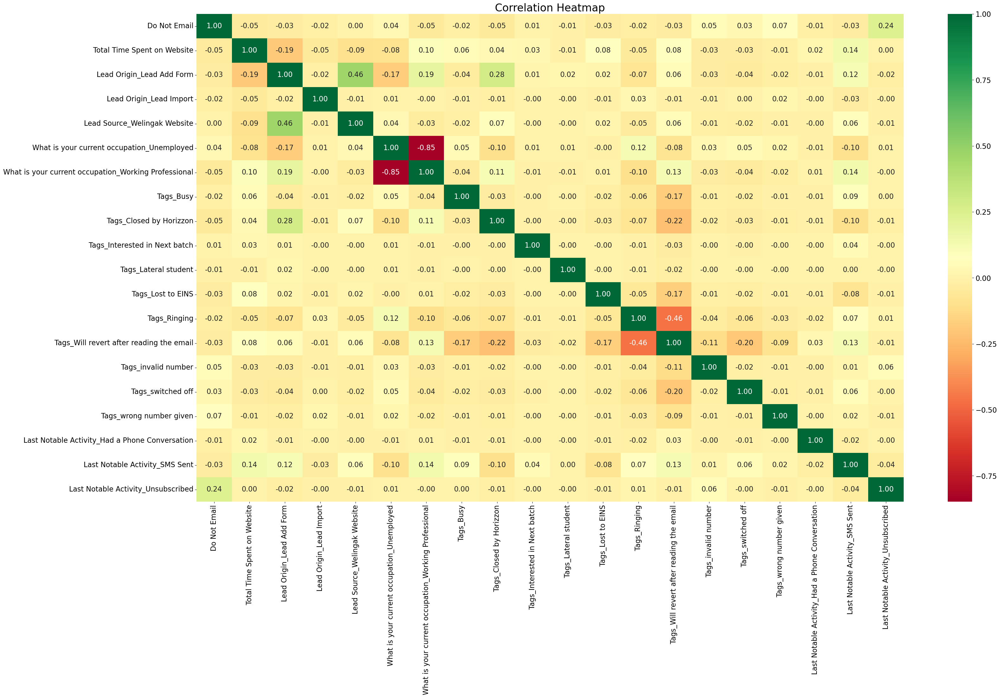

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and 'selected_cols' is a list of columns you want to include
col = ['Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Lead Add Form', 'Lead Origin_Lead Import',
       'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Interested in Next batch',
       'Tags_Lateral student', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed']  # Replace with your actual column names

# Create a subset DataFrame with selected columns
sel_df = df[col]



# Create a heatmap

plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.figure(figsize=(36,20))
sns.heatmap(sel_df.corr(), annot=True, cmap='RdYlGn', fmt=".2f", annot_kws={"size": 16})
plt.title("Correlation Heatmap", fontsize=24)
plt.show()


#### insights:
- lead source_wellingakv website has positive correlation (0.46) with lead origin_ lead add form.

- lead origin_ lead add form has positive correlation (0.28) with tags_closed by horizon.

- Do not email has positive correlation (0.24) with last notableactivity_unsubscribed.


### Assessing the model with StatsModels

### Model : 1

#### we  do statsmodel with  rfe  selected  cols this time as model1


In [80]:
import statsmodels.api as sm

In [81]:
#(X_train[col]) refers toall fre selected cols:
X_train_sm = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result = logm1.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6330
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1727.0
Date:                Sun, 15 Oct 2023   Deviance:                       3454.0
Time:                        14:01:50   Pearson chi2:                 1.14e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5458
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.8164      0.340    -11.233      0.000      -4.482      -3.150
Do Not Email                                            -1.9530      0.221     -8.833      0.000      -2.386      -1.520
Total Time Spent on Website                              4.3849      0.188     23.380      0.000       4.017       4.753
Lead Origin_Lead Add Form                                3.4451      0.296     11.637      0.000       2.865       4.025
Lead Origin_Lead Import                                  2.1550      0.618      3.486      0.000       0.943       3.367
Lead Source_Welingak Website                             1.5505      0.799      1.941      0.052      -0.015       3.116
What is your current occupation_Unemployed              -1.5653      0.309     -5.069      0.000      -2.170      -0.960
What is your current occupation_Working Professional     1.3160      0.390      3.374      0.001       0.552       2.080
Tags_Busy                                                2.8172      0.326      8.652      0.000       2.179       3.455
Tags_Closed by Horizzon                                  8.2429      0.758     10.869      0.000       6.756       9.729
Tags_Interested in Next batch                           25.9679   5.57e+04      0.000      1.000   -1.09e+05    1.09e+05
Tags_Lateral student                                    27.5549   7.45e+04      0.000      1.000   -1.46e+05    1.46e+05
Tags_Lost to EINS                                        8.1559      0.756     10.795      0.000       6.675       9.637
Tags_Ringing                                            -1.6341      0.338     -4.828      0.000      -2.297      -0.971
Tags_Will revert after reading the email                 3.6207      0.220     16.460      0.000       3.190       4.052
Tags_invalid number                                    -21.3451   1.48e+04     -0.001      0.999    -2.9e+04    2.89e+04
Tags_switched off                                       -1.1632      0.575     -2.021      0.043      -2.291      -0.035
Tags_wrong number given                                -21.8823   1.91e+04     -0.001      0.999   -3.74e+04    3.74e+04
Last Notable Activity_Had a Phone Conversation           3.0156      1.092      2.763      0.006       0.876       5.155
Last Notable Activity_SMS Sent                           2.8168      0.123     22.936      0.000       2.576       3.057
Last Notable Activity_Unsubscribed                       2.3879      0.679      3.518      0.000       1.058       3.718
========================================================================================================================
"""

In [82]:
# insignifcant  p-values:  >0.05


# Tags_Interested in Next batch --------> 1.000
# Tags_Lateral student        ----------> 1.000
# Tags_invalid number         -------->   0.999
# Tags_wrong number given      -------->  0.999
# Lead Source_Welingak Website    ------> 0.052


In [83]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result.predict(X_train_sm)
y_train_pred[:10]

3009    0.273115
1012    0.387382
9226    0.000897
4750    0.977562
7987    0.997253
1281    0.952313
2880    0.147665
4971    0.962692
7536    0.894305
1248    0.016844
dtype: float64

## check vif

In [84]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [85]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.59
7,What is your current occupation_Working Profes...,3.81
6,What is your current occupation_Unemployed,3.74
14,Tags_Will revert after reading the email,2.02
13,Tags_Ringing,1.64
3,Lead Origin_Lead Add Form,1.59
5,Lead Source_Welingak Website,1.32
9,Tags_Closed by Horizzon,1.31
19,Last Notable Activity_SMS Sent,1.18
16,Tags_switched off,1.15


### Model:2

#### Decided to drop due to high  p-value:

 Tags_Interested in Next batch --------> 1.000

In [86]:
col.remove("Tags_Interested in Next batch")

In [87]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result2 = logm2.fit()
result2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6331
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1731.4
Date:                Sun, 15 Oct 2023   Deviance:                       3462.7
Time:                        14:01:51   Pearson chi2:                 1.13e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5452
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.7665      0.334    -11.260      0.000      -4.422      -3.111
Do Not Email                                            -1.9124      0.219     -8.725      0.000      -2.342      -1.483
Total Time Spent on Website                              4.3907      0.187     23.461      0.000       4.024       4.757
Lead Origin_Lead Add Form                                3.4626      0.295     11.750      0.000       2.885       4.040
Lead Origin_Lead Import                                  2.1589      0.618      3.496      0.000       0.949       3.369
Lead Source_Welingak Website                             1.5235      0.797      1.910      0.056      -0.040       3.086
What is your current occupation_Unemployed              -1.5338      0.306     -5.018      0.000      -2.133      -0.935
What is your current occupation_Working Professional     1.3280      0.387      3.434      0.001       0.570       2.086
Tags_Busy                                                2.7208      0.320      8.509      0.000       2.094       3.348
Tags_Closed by Horizzon                                  8.1568      0.756     10.796      0.000       6.676       9.638
Tags_Lateral student                                    27.4681   7.44e+04      0.000      1.000   -1.46e+05    1.46e+05
Tags_Lost to EINS                                        8.0722      0.753     10.719      0.000       6.596       9.548
Tags_Ringing                                            -1.7405      0.332     -5.241      0.000      -2.391      -1.090
Tags_Will revert after reading the email                 3.5336      0.211     16.728      0.000       3.120       3.948
Tags_invalid number                                    -21.4481   1.48e+04     -0.001      0.999    -2.9e+04    2.89e+04
Tags_switched off                                       -1.2688      0.572     -2.219      0.027      -2.390      -0.148
Tags_wrong number given                                -21.9865   1.91e+04     -0.001      0.999   -3.74e+04    3.74e+04
Last Notable Activity_Had a Phone Conversation           3.0207      1.092      2.767      0.006       0.881       5.160
Last Notable Activity_SMS Sent                           2.8398      0.123     23.118      0.000       2.599       3.081
Last Notable Activity_Unsubscribed                       2.3511      0.678      3.470      0.001       1.023       3.679
========================================================================================================================
"""

In [88]:
# insignifcant  p-values:  >0.05

# Tags_Lateral student        ----------> 1.000
# Tags_invalid number         -------->   0.999
# Tags_wrong number given      -------->  0.999
# Lead Source_Welingak Website    ------> 0.056

In [89]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result2.predict(X_train_sm)
y_train_pred[:10]


3009    0.272175
1012    0.391130
9226    0.000875
4750    0.978015
7987    0.997258
1281    0.953205
2880    0.146942
4971    0.963117
7536    0.894243
1248    0.016495
dtype: float64

In [90]:
# to make it as 1-dimensional NumPy array:
# from the Series,  this extracts to the underlying NumPy array of values.
# .reshape(-1): it's reshaping it into a 1-dimensional array.

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.72174603e-01, 3.91130360e-01, 8.74644503e-04, 9.78014666e-01,
       9.97257881e-01, 9.53205129e-01, 1.46941625e-01, 9.63116725e-01,
       8.94243179e-01, 1.64952262e-02])

## check vif

In [91]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [92]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.59
7,What is your current occupation_Working Profes...,3.81
6,What is your current occupation_Unemployed,3.73
13,Tags_Will revert after reading the email,2.02
12,Tags_Ringing,1.64
3,Lead Origin_Lead Add Form,1.58
5,Lead Source_Welingak Website,1.32
9,Tags_Closed by Horizzon,1.31
18,Last Notable Activity_SMS Sent,1.18
15,Tags_switched off,1.15


### Model:3

#### Decided to drop due to high  p-value:
    
 Tags_Lateral student        ----------> 1.000


In [93]:
col.remove("Tags_Lateral student")

In [94]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result3 = logm3.fit()
result3.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6332
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1735.7
Date:                Sun, 15 Oct 2023   Deviance:                       3471.4
Time:                        14:01:51   Pearson chi2:                 1.13e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5445
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.7319      0.332    -11.256      0.000      -4.382      -3.082
Do Not Email                                            -1.9130      0.219     -8.733      0.000      -2.342      -1.484
Total Time Spent on Website                              4.3860      0.187     23.474      0.000       4.020       4.752
Lead Origin_Lead Add Form                                3.4788      0.294     11.846      0.000       2.903       4.054
Lead Origin_Lead Import                                  2.1563      0.617      3.495      0.000       0.947       3.366
Lead Source_Welingak Website                             1.5061      0.797      1.889      0.059      -0.056       3.068
What is your current occupation_Unemployed              -1.5159      0.304     -4.988      0.000      -2.112      -0.920
What is your current occupation_Working Professional     1.3337      0.385      3.466      0.001       0.580       2.088
Tags_Busy                                                2.6697      0.317      8.421      0.000       2.048       3.291
Tags_Closed by Horizzon                                  8.1046      0.754     10.743      0.000       6.626       9.583
Tags_Lost to EINS                                        8.0205      0.752     10.667      0.000       6.547       9.494
Tags_Ringing                                            -1.7934      0.329     -5.446      0.000      -2.439      -1.148
Tags_Will revert after reading the email                 3.4825      0.207     16.811      0.000       3.077       3.889
Tags_invalid number                                    -21.4992   1.48e+04     -0.001      0.999    -2.9e+04    2.89e+04
Tags_switched off                                       -1.3197      0.570     -2.314      0.021      -2.438      -0.202
Tags_wrong number given                                -22.0367   1.91e+04     -0.001      0.999   -3.74e+04    3.74e+04
Last Notable Activity_Had a Phone Conversation           3.0201      1.092      2.767      0.006       0.881       5.160
Last Notable Activity_SMS Sent                           2.8400      0.123     23.148      0.000       2.600       3.080
Last Notable Activity_Unsubscribed                       2.3517      0.677      3.474      0.001       1.025       3.679
========================================================================================================================
"""

In [95]:
# insignifcant  p-values:  >0.05

# Tags_invalid number         -------->   0.999
# Tags_wrong number given      -------->  0.999
# Lead Source_Welingak Website    ------> 0.059

In [96]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result3.predict(X_train_sm)
y_train_pred[:10]

3009    0.272280
1012    0.388328
9226    0.000874
4750    0.977985
7987    0.997251
1281    0.953180
2880    0.147112
4971    0.963057
7536    0.893980
1248    0.016437
dtype: float64

In [97]:
# to make it as 1-dimensional NumPy array:
# from the Series,  this extracts to the underlying NumPy array of values.
# .reshape(-1): it's reshaping it into a 1-dimensional array.

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.72280380e-01, 3.88327888e-01, 8.74266906e-04, 9.77984938e-01,
       9.97250797e-01, 9.53180457e-01, 1.47111721e-01, 9.63056715e-01,
       8.93980492e-01, 1.64374918e-02])

## check vif

In [98]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [99]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.59
7,What is your current occupation_Working Profes...,3.81
6,What is your current occupation_Unemployed,3.73
12,Tags_Will revert after reading the email,2.01
11,Tags_Ringing,1.64
3,Lead Origin_Lead Add Form,1.58
5,Lead Source_Welingak Website,1.32
9,Tags_Closed by Horizzon,1.31
17,Last Notable Activity_SMS Sent,1.18
14,Tags_switched off,1.15


### Model:4

#### Decided to drop due to high  p-value:
    
Tags_invalid number         -------->   0.999

In [100]:
col.remove("Tags_invalid number")

In [101]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result4 = logm4.fit()
result4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6333
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1738.6
Date:                Sun, 15 Oct 2023   Deviance:                       3477.2
Time:                        14:01:52   Pearson chi2:                 1.14e+04
No. Iterations:                    22   Pseudo R-squ. (CS):             0.5441
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.8019      0.335    -11.361      0.000      -4.458      -3.146
Do Not Email                                            -1.9128      0.219     -8.739      0.000      -2.342      -1.484
Total Time Spent on Website                              4.3969      0.187     23.528      0.000       4.031       4.763
Lead Origin_Lead Add Form                                3.4917      0.294     11.866      0.000       2.915       4.068
Lead Origin_Lead Import                                  2.1590      0.618      3.494      0.000       0.948       3.370
Lead Source_Welingak Website                             1.4955      0.797      1.876      0.061      -0.067       3.058
What is your current occupation_Unemployed              -1.5490      0.307     -5.048      0.000      -2.150      -0.948
What is your current occupation_Working Professional     1.3215      0.389      3.400      0.001       0.560       2.083
Tags_Busy                                                2.7821      0.315      8.845      0.000       2.166       3.399
Tags_Closed by Horizzon                                  8.2050      0.754     10.880      0.000       6.727       9.683
Tags_Lost to EINS                                        8.1217      0.752     10.805      0.000       6.649       9.595
Tags_Ringing                                            -1.6761      0.326     -5.136      0.000      -2.316      -1.036
Tags_Will revert after reading the email                 3.5854      0.206     17.444      0.000       3.183       3.988
Tags_switched off                                       -1.1998      0.569     -2.110      0.035      -2.314      -0.086
Tags_wrong number given                                -20.9192   1.16e+04     -0.002      0.999   -2.27e+04    2.27e+04
Last Notable Activity_Had a Phone Conversation           3.0186      1.092      2.765      0.006       0.879       5.158
Last Notable Activity_SMS Sent                           2.8162      0.121     23.212      0.000       2.578       3.054
Last Notable Activity_Unsubscribed                       2.3362      0.674      3.466      0.001       1.015       3.657
========================================================================================================================
"""

In [102]:
# insignifcant  p-values:  >0.05

# Tags_wrong number given      -------->  0.999
# Lead Source_Welingak Website    ------> 0.061

In [103]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result4.predict(X_train_sm)
y_train_pred[:10]

3009    0.272630
1012    0.393530
9226    0.000887
4750    0.977611
7987    0.997267
1281    0.952319
2880    0.147093
4971    0.962808
7536    0.894873
1248    0.016789
dtype: float64

In [104]:
# to make it as 1-dimensional NumPy array:
# from the Series,  this extracts to the underlying NumPy array of values.
# .reshape(-1): it's reshaping it into a 1-dimensional array.

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.72629828e-01, 3.93530252e-01, 8.86809974e-04, 9.77611367e-01,
       9.97266873e-01, 9.52319092e-01, 1.47093103e-01, 9.62808352e-01,
       8.94873001e-01, 1.67893539e-02])

## check vif

In [105]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [106]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.50
7,What is your current occupation_Working Profes...,3.81
6,What is your current occupation_Unemployed,3.73
12,Tags_Will revert after reading the email,1.93
11,Tags_Ringing,1.59
3,Lead Origin_Lead Add Form,1.58
5,Lead Source_Welingak Website,1.32
9,Tags_Closed by Horizzon,1.30
16,Last Notable Activity_SMS Sent,1.17
2,Total Time Spent on Website,1.14


### Model:5

#### Decided to drop due to high  p-value:
    
Tags_wrong number given      -------->  0.999

In [107]:
col.remove("Tags_wrong number given")

In [108]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result5 = logm5.fit()
result5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6334
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1741.1
Date:                Sun, 15 Oct 2023   Deviance:                       3482.3
Time:                        14:01:52   Pearson chi2:                 1.15e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5438
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.8524      0.338    -11.414      0.000      -4.514      -3.191
Do Not Email                                            -1.9132      0.219     -8.753      0.000      -2.342      -1.485
Total Time Spent on Website                              4.3906      0.187     23.506      0.000       4.025       4.757
Lead Origin_Lead Add Form                                3.4980      0.295     11.870      0.000       2.920       4.076
Lead Origin_Lead Import                                  2.1439      0.614      3.492      0.000       0.941       3.347
Lead Source_Welingak Website                             1.4879      0.797      1.866      0.062      -0.075       3.051
What is your current occupation_Unemployed              -1.5749      0.309     -5.096      0.000      -2.181      -0.969
What is your current occupation_Working Professional     1.3111      0.392      3.348      0.001       0.544       2.079
Tags_Busy                                                2.8697      0.313      9.156      0.000       2.255       3.484
Tags_Closed by Horizzon                                  8.2820      0.754     10.981      0.000       6.804       9.760
Tags_Lost to EINS                                        8.1989      0.752     10.908      0.000       6.726       9.672
Tags_Ringing                                            -1.5831      0.325     -4.875      0.000      -2.220      -0.947
Tags_Will revert after reading the email                 3.6650      0.205     17.849      0.000       3.263       4.067
Tags_switched off                                       -1.1059      0.568     -1.949      0.051      -2.218       0.006
Last Notable Activity_Had a Phone Conversation           3.0162      1.092      2.763      0.006       0.877       5.156
Last Notable Activity_SMS Sent                           2.7986      0.120     23.233      0.000       2.563       3.035
Last Notable Activity_Unsubscribed                       2.3366      0.675      3.463      0.001       1.014       3.659
========================================================================================================================
"""

In [109]:
# insignifcant  p-values:  >0.05

# Lead Source_Welingak Website    ------> 0.062

In [110]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result5.predict(X_train_sm)
y_train_pred[:10]


3009    0.273041
1012    0.397793
9226    0.000902
4750    0.977208
7987    0.997257
1281    0.951533
2880    0.147492
4971    0.962420
7536    0.894652
1248    0.016994
dtype: float64

In [111]:
# to make it as 1-dimensional NumPy array:
# from the Series,  this extracts to the underlying NumPy array of values.
# .reshape(-1): it's reshaping it into a 1-dimensional array.

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.73041455e-01, 3.97793366e-01, 9.01569472e-04, 9.77207504e-01,
       9.97256943e-01, 9.51532748e-01, 1.47491774e-01, 9.62420270e-01,
       8.94651896e-01, 1.69941627e-02])

## check vif

In [112]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [113]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.47
7,What is your current occupation_Working Profes...,3.80
6,What is your current occupation_Unemployed,3.72
12,Tags_Will revert after reading the email,1.88
3,Lead Origin_Lead Add Form,1.58
11,Tags_Ringing,1.57
5,Lead Source_Welingak Website,1.32
9,Tags_Closed by Horizzon,1.30
15,Last Notable Activity_SMS Sent,1.17
2,Total Time Spent on Website,1.14


### Model:6

#### Decided to drop due to high  p-value:
    
Lead Source_Welingak Website    ------> 0.059

In [114]:
col.remove("Lead Source_Welingak Website")

In [115]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
result6 = logm6.fit()
result6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6335
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1743.4
Date:                Sun, 15 Oct 2023   Deviance:                       3486.9
Time:                        14:01:53   Pearson chi2:                 1.18e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5434
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -3.8744      0.339    -11.425      0.000      -4.539      -3.210
Do Not Email                                            -1.8844      0.216     -8.741      0.000      -2.307      -1.462
Total Time Spent on Website                              4.3958      0.187     23.518      0.000       4.029       4.762
Lead Origin_Lead Add Form                                3.8077      0.268     14.226      0.000       3.283       4.332
Lead Origin_Lead Import                                  2.1451      0.614      3.491      0.000       0.941       3.349
What is your current occupation_Unemployed              -1.5669      0.311     -5.046      0.000      -2.176      -0.958
What is your current occupation_Working Professional     1.3030      0.393      3.313      0.001       0.532       2.074
Tags_Busy                                                2.8829      0.314      9.182      0.000       2.268       3.498
Tags_Closed by Horizzon                                  8.2871      0.754     10.985      0.000       6.809       9.766
Tags_Lost to EINS                                        8.2116      0.752     10.921      0.000       6.738       9.685
Tags_Ringing                                            -1.6169      0.327     -4.943      0.000      -2.258      -0.976
Tags_Will revert after reading the email                 3.6800      0.206     17.841      0.000       3.276       4.084
Tags_switched off                                       -1.0927      0.568     -1.924      0.054      -2.206       0.020
Last Notable Activity_Had a Phone Conversation           3.0146      1.092      2.761      0.006       0.875       5.154
Last Notable Activity_SMS Sent                           2.7956      0.120     23.220      0.000       2.560       3.032
Last Notable Activity_Unsubscribed                       2.3069      0.674      3.423      0.001       0.986       3.628
========================================================================================================================
"""

In [116]:
# insignifcant  p-values:  >0.05

# Tags_switched off ----------->   0.054

In [117]:
# Getting the predicted values on the train set
# use res to predict y_train based on x_train_sm trained 
# gives propability of getting one

y_train_pred = result6.predict(X_train_sm)
y_train_pred[:10]


3009    0.273412
1012    0.401167
9226    0.000860
4750    0.977232
7987    0.997263
1281    0.951541
2880    0.147612
4971    0.962411
7536    0.895171
1248    0.016270
dtype: float64

In [118]:
# to make it as 1-dimensional NumPy array:
# from the Series,  this extracts to the underlying NumPy array of values.
# .reshape(-1): it's reshaping it into a 1-dimensional array.

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([2.73412077e-01, 4.01166920e-01, 8.59594449e-04, 9.77231788e-01,
       9.97263162e-01, 9.51540839e-01, 1.47612270e-01, 9.62410602e-01,
       8.95171115e-01, 1.62704062e-02])

## check vif

In [119]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [120]:
# Check for the VIF values of the feature variables. 
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs

vif_data =pd.DataFrame()
vif_data['Features']=X_train_sm.columns
vif_data['VIF']=[variance_inflation_factor(X_train_sm.values, i) for i in range(len(X_train_sm.columns))]
vif_data['VIF'] = round(vif_data['VIF'], 2)
vif_data = vif_data.sort_values(by = "VIF", ascending = False)
vif_data

,Features,VIF
0,const,41.44
6,What is your current occupation_Working Profes...,3.79
5,What is your current occupation_Unemployed,3.72
11,Tags_Will revert after reading the email,1.88
10,Tags_Ringing,1.57
8,Tags_Closed by Horizzon,1.29
3,Lead Origin_Lead Add Form,1.24
14,Last Notable Activity_SMS Sent,1.17
2,Total Time Spent on Website,1.14
12,Tags_switched off,1.13


# INSIGHTS

#### - The  Model 6 looks satisfied with no more p value >= 0.05 and vif >= 5.


#### - Very low multicollinearity between the predictor variables.


#### - let's check the test data metrics to check whether this model is significant enough or not.

### LETS CHECK CONVERSION PROBABILITY

In [121]:
# Assuming y_train_pred is a variable or DataFrame that you have defined earlier
y_train_pred_final = pd.DataFrame({'Converted':y_train.values,'y_train_pred': y_train_pred})

# Now you can add a new column 'Conver_prob'
y_train_pred_final['Conver_prob'] = y_train_pred

In [122]:
y_train_pred_final['Conver_prob'] = y_train_pred

In [123]:
# Creating new column 'predicted' with 1 if Conver_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Conver_prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,y_train_pred,Conver_prob,predicted
0,0,0.273412,0.273412,0
1,0,0.401167,0.401167,0
2,0,0.000860,0.000860,0
3,1,0.977232,0.977232,1
4,1,0.997263,0.997263,1


## STEP 10: CONFUSION MATRIX:

### STEPS FOR Confusion Matrix and Accuracy:
1. from sklearn import metrics
2. confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted)
3. print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

In [124]:
from sklearn import metrics

In [125]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion)

[[3638  267]
 [ 379 2067]]


In [126]:
# Let's check the overall accuracy.
acc = metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted)
acc

0.8982837348449063

In [127]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [128]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8450531479967294

In [129]:
# Let us calculate specificity
TN / float(TN+FP)

0.9316261203585148

In [130]:
# Calculate false postive rate - predicting converted when customer does not have converted
print(FP/ float(TN+FP))

0.06837387964148528


In [131]:
# positive predictive value 
print (TP / float(TP+FP))

0.8856041131105399


In [132]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9056509833208862


# STEP 11: FINDING THE OPTIMAL CUTOFF
Now 0.5 was just arbitrary to loosely check the model performace. But in order to get good results, you need to optimise the threshold. So first let's plot an ROC curve to see what AUC we get.

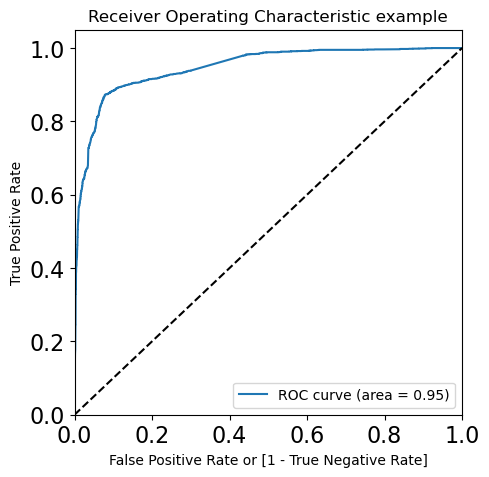

In [133]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn import metrics

# Define the draw_roc function
def draw_roc(actual, probs):
    # Calculate the ROC curve metrics using sklearn's roc_curve function
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate=False)

    # Calculate the Area Under the ROC Curve (AUC)
    auc_score = metrics.roc_auc_score(actual, probs)

    # Create a new figure for the ROC curve plot
    plt.figure(figsize=(5, 5))

    # Plot the ROC curve
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
    
    # Add a diagonal dashed line representing random chance
    plt.plot([0, 1], [0, 1], 'k--')

    # Set the x and y axis limits
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    # Label the x and y axes
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')

    # Set the title of the plot
    plt.title('Receiver Operating Characteristic example')

    # Add a legend to the plot
    plt.legend(loc="lower right")

    # Display the ROC curve plot
    plt.show()

    # Return None as this function primarily generates a plot
    return None

# Calling the draw_roc function with actual labels and predicted probabilities
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conver_prob)


In [134]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Converted, y_train_pred_final.Conver_prob, drop_intermediate = False )

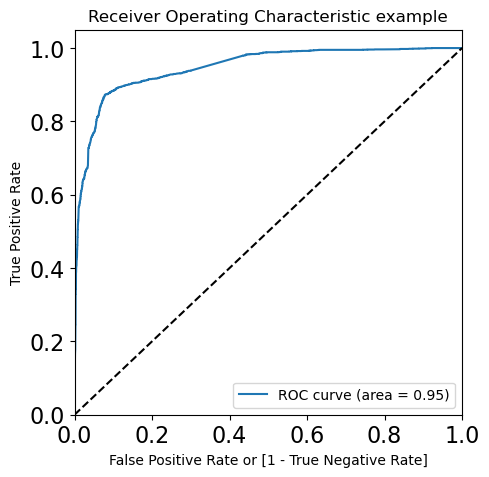

In [135]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conver_prob)

In [136]:
(y_train_pred_final.Converted, y_train_pred_final.Conver_prob)

(0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: Converted, Length: 6351, dtype: int64,
 0       0.273412
 1       0.401167
 2       0.000860
 3       0.977232
 4       0.997263
           ...   
 6346    0.459145
 6347    0.751860
 6348    0.388188
 6349    0.048892
 6350    0.036646
 Name: Conver_prob, Length: 6351, dtype: float64)

### Optimal cutoff probability is that probability where we get balanced sensitivity and specificity

In [137]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conver_prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,y_train_pred,Conver_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.273412,0.273412,0,1,1,1,0,0,0,0,0,0,0
1,0,0.401167,0.401167,0,1,1,1,1,1,0,0,0,0,0
2,0,0.000860,0.000860,0,1,0,0,0,0,0,0,0,0,0
3,1,0.977232,0.977232,1,1,1,1,1,1,1,1,1,1,1
4,1,0.997263,0.997263,1,1,1,1,1,1,1,1,1,1,1


In [138]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.385136  1.000000  0.000000
0.1   0.1  0.715163  0.983238  0.547247
0.2   0.2  0.842072  0.916190  0.795647
0.3   0.3  0.891356  0.886754  0.894238
0.4   0.4  0.902063  0.872445  0.920615
0.5   0.5  0.898284  0.845053  0.931626
0.6   0.6  0.889309  0.802944  0.943406
0.7   0.7  0.875768  0.742437  0.959283
0.8   0.8  0.842387  0.622240  0.980282
0.9   0.9  0.810109  0.520850  0.991293


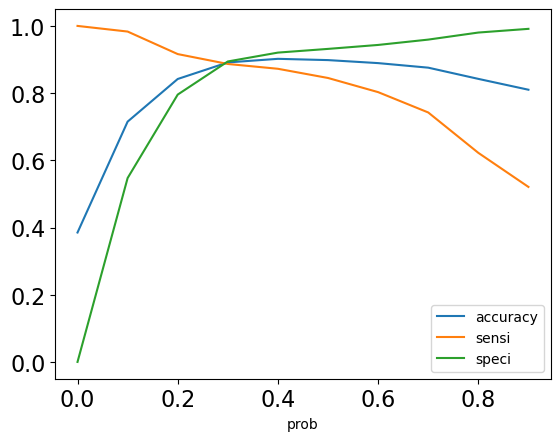

In [139]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

### Our optimal cutoff   -  0.3 

### at 0.3 both sensitivity and specificity are good and balanced.

      prob            0.3                         
      accuracy        0.890254  
      sensi           0.886345            
      speci           0.892702

# Step 12 : Model Evaluation Metrics - with optimal threshold 0.3

#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [140]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conver_prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Converted,y_train_pred,Conver_prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.273412,0.273412,0,1,1,1,0,0,0,0,0,0,0,0
1,0,0.401167,0.401167,0,1,1,1,1,1,0,0,0,0,0,1
2,0,0.000860,0.000860,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.977232,0.977232,1,1,1,1,1,1,1,1,1,1,1,1
4,1,0.997263,0.997263,1,1,1,1,1,1,1,1,1,1,1,1


In [141]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8913556920170052

In [142]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3492,  413],
       [ 277, 2169]], dtype=int64)

In [143]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [144]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8867538838920687


# parameters                                           #train data          #test data

accuracy                                                    0.8913           0.8821

Precision /Positive predictive value                        0.8400           0.8180

sensitivity / Recall                                        0.8867           0.8685

specificity                                                 0.8942           0.8898

false postive rate                                          0.1057           0.1101

Negative predictive value                                   0.9265           0.9222
   

In [145]:
# Let us calculate specificity
TN / float(TN+FP)

0.8942381562099871

In [146]:
# Calculate false postive rate - predicting converted when customer does not have converted
print(FP/ float(TN+FP))

0.1057618437900128


In [147]:
# Positive predictive value /precision
print (TP / float(TP+FP))

0.8400464756003099


In [148]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9265057044308835


## STEP 13 : HERE IS A TRADE-OFF BETWEEN PRECISION AND RECALL AS WELL

Using sklearn utilities for the same

In [149]:
from sklearn.metrics import precision_score, recall_score

In [150]:
precision_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.8856041131105399

In [151]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.predicted)

0.8450531479967294

### Precision and recall tradeoff

In [152]:
from sklearn.metrics import precision_recall_curve

In [153]:
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: Converted, Length: 6351, dtype: int64,
 0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: predicted, Length: 6351, dtype: int64)

In [154]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conver_prob)

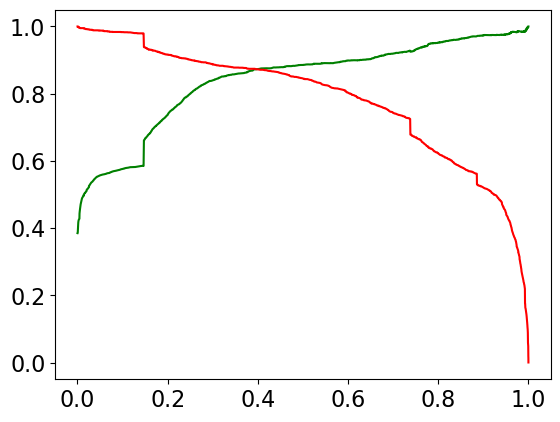

In [155]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Step 14 : Making predictions on the test set

In [156]:
# Scale the test set as well using just 'transform'

X_test[["TotalVisits","Total Time Spent on Website","Page Views Per Visit"  ]] = scaler.transform(X_test[["TotalVisits", "Total Time Spent on Website", "Page Views Per Visit"]])

In [157]:
X_test = X_test[col]
X_test.head()

,Do Not Email,Total Time Spent on Website,Lead Origin_Lead Add Form,Lead Origin_Lead Import,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_SMS Sent,Last Notable Activity_Unsubscribed
3271,0,0.070530,0,0,1,0,0,0,0,0,1,0,0,0,0
1490,0,0.679695,0,0,0,1,0,0,0,0,1,0,0,0,0
7936,0,0.033243,0,0,1,0,0,0,0,0,1,0,0,0,0
4216,0,0.000000,1,0,0,0,0,1,0,0,0,0,0,0,0
3830,0,0.073675,0,0,1,0,0,0,0,0,1,0,0,0,0


In [158]:
X_test_sm = sm.add_constant(X_test)

Making predictions on the test set

In [159]:
y_test_pred = result6.predict(X_test_sm)

In [160]:
y_test_pred[:10]

3271    0.189799
1490    0.983639
7936    0.165865
4216    0.999731
3830    0.191934
1800    0.778792
6507    0.017848
4821    0.005556
4223    0.992170
4714    0.146621
dtype: float64

In [161]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [162]:
# Let's see the head
y_pred_1.head()

,0
3271,0.189799
1490,0.983639
7936,0.165865
4216,0.999731
3830,0.191934


In [163]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [164]:
# Putting CustID to index         #doubt
y_test_df["Prospect ID"] = y_test_df.index

In [165]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [166]:
# Appending y_test_df and y_pred_1  #doubt
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [167]:
y_pred_final.head()

,Converted,Prospect ID,0
0,0,3271,0.189799
1,1,1490,0.983639
2,0,7936,0.165865
3,1,4216,0.999731
4,0,3830,0.191934


In [168]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Conversion_Prob'})

In [169]:
# Rearranging the columns   "Prospect ID","Converted","Conversion_prob"
new_column_order = ["Prospect ID","Converted","Conversion_Prob"]
y_pred_final = y_pred_final[new_column_order]

In [170]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Prospect ID,Converted,Conversion_Prob
0,3271,0,0.189799
1,1490,1,0.983639
2,7936,0,0.165865
3,4216,1,0.999731
4,3830,0,0.191934


In [171]:
# Make predictions on the test set using 0.3 as the cutoff

y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.30 else 0)


In [172]:
y_pred_final.head()

,Prospect ID,Converted,Conversion_Prob,final_predicted
0,3271,0,0.189799,0
1,1490,1,0.983639,1
2,7936,0,0.165865,0
3,4216,1,0.999731,1
4,3830,0,0.191934,0


## STEP 15 : LETS CHECK THE OVERALL METRICS ON TEST DATA

In [173]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.8821153139919207

In [174]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted)
confusion2

array([[1543,  191],
       [ 130,  859]], dtype=int64)

In [175]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [176]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8685540950455005

In [177]:
# Let us calculate specificity
TN / float(TN+FP)

0.8898500576701269

In [178]:
# Calculate false postive rate - predicting converted when customer does not have converted 
print(FP/ float(TN+FP))

0.11014994232987313


In [179]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8180952380952381


In [180]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9222952779438135


### Precision and recall tradeoff - test data

In [181]:
#Precision and recall tradeoff
from sklearn.metrics import precision_recall_curve
y_train_pred_final.Converted, y_train_pred_final.predicted

(0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: Converted, Length: 6351, dtype: int64,
 0       0
 1       0
 2       0
 3       1
 4       1
        ..
 6346    0
 6347    1
 6348    0
 6349    0
 6350    0
 Name: predicted, Length: 6351, dtype: int64)

In [182]:
print(y_train_pred_final.columns)

Index([      'Converted',    'y_train_pred',     'Conver_prob',
             'predicted',               0.0,               0.1,
                     0.2,               0.3,               0.4,
                     0.5,               0.6,               0.7,
                     0.8,               0.9, 'final_predicted'],
      dtype='object')


In [183]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conver_prob)

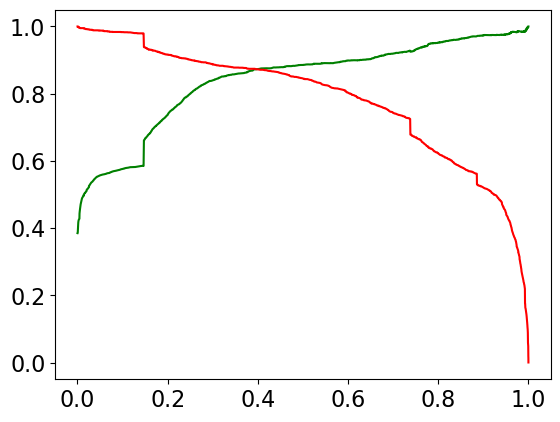

In [184]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Making Predictions on the Test Set
Let's now make predicitons on the test set.

In [185]:
y_test_pred = result6.predict(sm.add_constant(X_test))

In [186]:
y_test_pred[:10]

3271    0.189799
1490    0.983639
7936    0.165865
4216    0.999731
3830    0.191934
1800    0.778792
6507    0.017848
4821    0.005556
4223    0.992170
4714    0.146621
dtype: float64

In [187]:
# Converting y_pred to a dataframe

y_pred_1 = pd.DataFrame(y_test_pred)

In [188]:
# Let's see the head

y_pred_1.head()

,0
3271,0.189799
1490,0.983639
7936,0.165865
4216,0.999731
3830,0.191934


In [189]:
# Converting y_test to dataframe

y_test_df = pd.DataFrame(y_test)

In [190]:
# Remove index for both dataframes to append them side by side 

y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [191]:
# Append y_test_df and y_pred_1

y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [192]:
# Check 'y_pred_final'

y_pred_final.head()

,Converted,0
0,0,0.189799
1,1,0.983639
2,0,0.165865
3,1,0.999731
4,0,0.191934


In [193]:
# Rename the column 

y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})

In [194]:
# Let's see the head of y_pred_final

y_pred_final.head()

,Converted,Conversion_Prob
0,0,0.189799
1,1,0.983639
2,0,0.165865
3,1,0.999731
4,0,0.191934


In [195]:
# Make predictions on the test set using 0.3 as the cutoff

y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.3 else 0)

In [196]:
# Check y_pred_final

y_pred_final.head()

,Converted,Conversion_Prob,final_predicted
0,0,0.189799,0
1,1,0.983639,1
2,0,0.165865,0
3,1,0.999731,1
4,0,0.191934,0


In [197]:
# Let's check the overall accuracy

metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)

0.8821153139919207

In [198]:
confusion2 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion2

array([[1543,  191],
       [ 130,  859]], dtype=int64)

In [200]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [201]:
# Calculate Precision /Positive predictive value 
TP/(TP+FP)

0.8180952380952381

In [202]:
# Let's see the sensitivity of our logistic regression model/ Calculate Recall
TP/(TP+FN)

0.8685540950455005

In [203]:
# Let us calculate specificity
TN / float(TN+FP)

0.8898500576701269

In [204]:
# Calculate false postive rate - predicting converted when customer does not have converted
print(FP/ float(TN+FP))

0.11014994232987313


In [205]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9222952779438135


### conversion_percentage

In [206]:
conversion_percentage = (TP / (TP + FN)) * 100
conversion_percentage

86.85540950455005

## STEP 16 : COMPARISON OF THE METRICS OF TRAIN AND TEST DATA:-

#Lets compare the metrics obtained from both train and test data:-


# parameters                                             #train data           #test data

# accuracy                                                    0.8913           0.8821

# Precision /Positive predictive value                        0.8400           0.8180

# sensitivity / Recall                                        0.8867           0.8685

# specificity                                                 0.8942           0.8898

# false postive rate                                          0.1057           0.1101

# Negative predictive value                                   0.9265           0.9222
   


# INTUTION MODEL

In [207]:
leads_data=pd.read_csv("Leads.csv")

In [208]:
leads_data.head(3)

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened


In [209]:
leads_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

# Data Cleaning

since id wont contribute anything to model we can remove both "Prospect ID" and "Lead Number"

In [210]:
len(leads_data["Prospect ID"].unique())

9240

In [211]:
len(leads_data["Lead Number"].unique())

9240

Removed low Valued data for lead Origins

In [212]:
origins=leads_data["Lead Origin"].unique()
origins

array(['API', 'Landing Page Submission', 'Lead Add Form', 'Lead Import',
       'Quick Add Form'], dtype=object)

In [213]:
leads_data["Lead Origin"].value_counts()

Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: Lead Origin, dtype: int64

In [214]:
leads_data=leads_data[leads_data["Lead Origin"]!="Quick Add Form"]

Combined all low frequency for Lead Source

In [215]:
sources=leads_data["Lead Source"].unique()
sources

array(['Olark Chat', 'Organic Search', 'Direct Traffic', 'Google',
       'Referral Sites', 'Welingak Website', 'Reference', 'google',
       'Facebook', nan, 'blog', 'Pay per Click Ads', 'bing',
       'Social Media', 'WeLearn', 'Click2call', 'Live Chat',
       'welearnblog_Home', 'youtubechannel', 'testone', 'Press_Release',
       'NC_EDM'], dtype=object)

In [216]:
leads_data["Lead Source"].value_counts()

Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64

In [217]:
leads_data["Lead Source"]=leads_data["Lead Source"].replace({"google":"Google","Facebook":"Others","bing":"Others",
                                                             "Click2call":"Others","Press_Release":"Others","Press_Release":"Others",
                                                             "Social Media":"Others","Live Chat":"Others","youtubechannel":"Others","testone":"Others",
                                                             "Pay per Click Ads":"Others","welearnblog_Home":"Others","WeLearn":"Others","blog":"Others",
                                                             "NC_EDM":"Others"
                                                            })

In [218]:
leads_data["Lead Source"].value_counts()

Google              2873
Direct Traffic      2543
Olark Chat          1755
Organic Search      1154
Reference            534
Welingak Website     142
Referral Sites       125
Others                78
Name: Lead Source, dtype: int64

Removing Null Values

In [219]:
df_null_values=leads_data.isnull().sum()

In [220]:
df_null_values.index

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [221]:
null_info = pd.DataFrame({
    'Null Count': leads_data.isnull().sum(),
    'Null Percentage': (leads_data.isnull().mean() * 100).round(2)
})

print("Null information for each column:")
print(null_info)

Null information for each column:
                                               Null Count  Null Percentage
Prospect ID                                             0             0.00
Lead Number                                             0             0.00
Lead Origin                                             0             0.00
Lead Source                                            35             0.38
Do Not Email                                            0             0.00
Do Not Call                                             0             0.00
Converted                                               0             0.00
TotalVisits                                           136             1.47
Total Time Spent on Website                             0             0.00
Page Views Per Visit                                  136             1.47
Last Activity                                         103             1.11
Country                                              2460         

Lead Source Null Values Are Filled with Mode

In [222]:
leads_data["Lead Source"].fillna("Google",inplace=True)

In [223]:
leads_data["TotalVisits"].fillna(leads_data["TotalVisits"].mode(),inplace=True)

leads_data["Page Views Per Visit"].fillna(leads_data["Page Views Per Visit"].mode(),inplace=True)

In [224]:
leads_data["Last Activity"].value_counts()

Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    325
Email Link Clicked               267
Form Submitted on Website        116
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [225]:
leads_data["Last Activity"]=leads_data["Last Activity"].replace({"Unreachable":"Others","Unsubscribed":"Others",
                                                                 "Had a Phone Conversation":"Others","Approached upfront":"Others",
                                                                 "View in browser link Clicked":"Others","Email Received":"Others",
                                                                 "Email Marked Spam":"Others","Visited Booth in Tradeshow":"Others",
                                                                 "Resubscribed to emails":"Others"
                                                            })
leads_data["Last Activity"].fillna(leads_data["Last Activity"].mode(),inplace=True)

In [226]:
leads_data["Country"].value_counts()

India                   6492
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
Oman                       6
France                     6
unknown                    5
South Africa               4
Nigeria                    4
Germany                    4
Kuwait                     4
Canada                     4
Sweden                     3
China                      2
Asia/Pacific Region        2
Uganda                     2
Bangladesh                 2
Italy                      2
Belgium                    2
Netherlands                2
Ghana                      2
Philippines                2
Russia                     1
Switzerland                1
Vietnam                    1
Denmark                    1
Tanzania                   1
Liberia                    1
Malaysia      

In [227]:
df_india=leads_data[leads_data["Country"]=="India"]

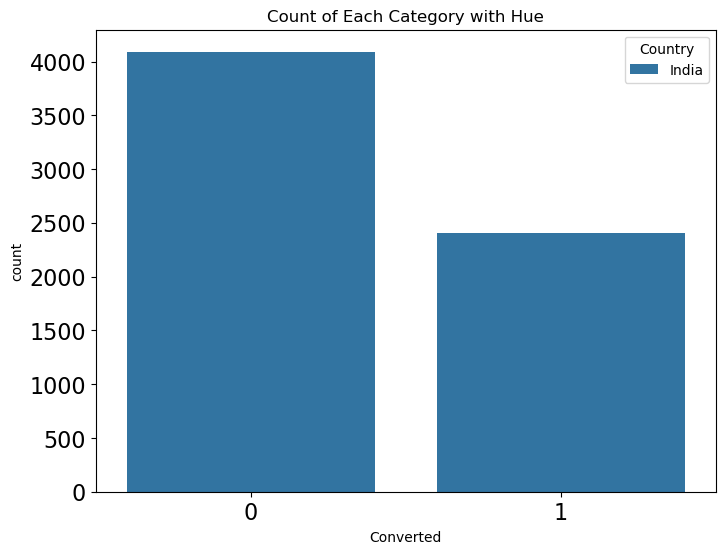

In [228]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Converted', hue='Country', data=df_india)
plt.title('Count of Each Category with Hue')
plt.show()

In [229]:
df_others=leads_data[leads_data["Country"]!="India"]

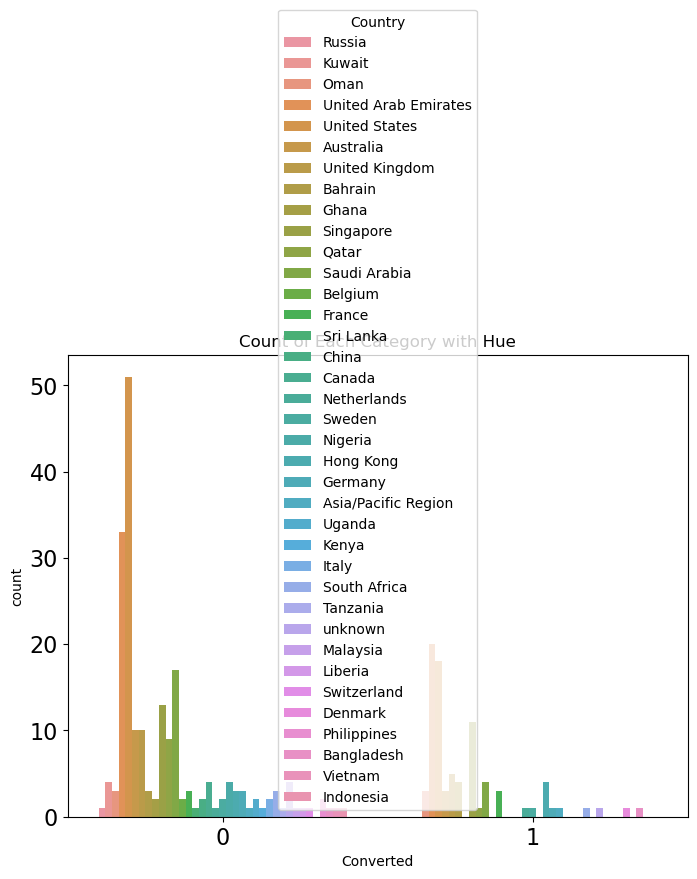

In [230]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Converted', hue='Country', data=df_others)
plt.title('Count of Each Category with Hue')
plt.show()

Not Found any Control over Country Column

In [231]:
leads_data["Country"].fillna("Not Specified",inplace=True)

In [232]:
leads_data["Specialization"].value_counts()

Select                               1942
Finance Management                    976
Human Resource Management             848
Marketing Management                  838
Operations Management                 503
Business Administration               403
IT Projects Management                366
Supply Chain Management               349
Banking, Investment And Insurance     338
Travel and Tourism                    203
Media and Advertising                 203
International Business                178
Healthcare Management                 159
Hospitality Management                114
E-COMMERCE                            111
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

Select Might Be Default Value

In [233]:
leads_data["Specialization"].fillna("Select",inplace=True)
leads_data["Specialization"]=leads_data["Specialization"].replace({"Select":"Not Specified"})
leads_data["Specialization"].value_counts()
leads_data["How did you hear about X Education"].value_counts()
leads_data["How did you hear about X Education"].isnull().sum()

2207

Select == 5043 && Null == 2207 
5043+2207~7250==85% Not ideal to have this column

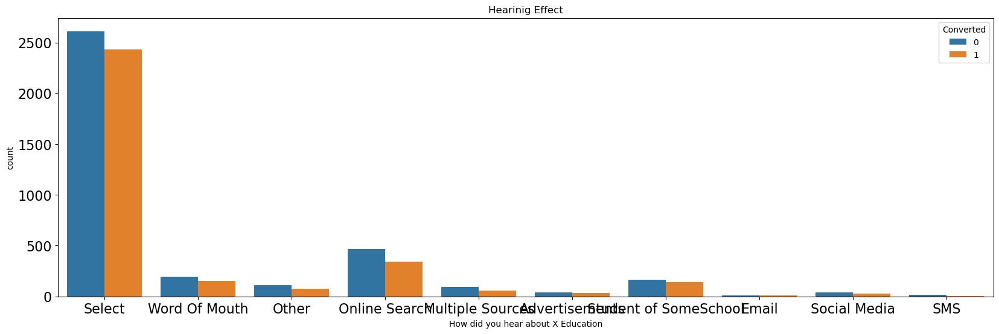

In [234]:
plt.figure(figsize=(20, 6))
sns.countplot(x='How did you hear about X Education', hue='Converted', data=leads_data)
plt.title('Hearinig Effect')
plt.show()

No Where it is biased to single type of reference
we can safely drop this column

In [235]:
leads_data.drop("How did you hear about X Education",axis=1,inplace=True)


In [236]:
leads_data["What is your current occupation"].value_counts()

Unemployed              5599
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [237]:
leads_data["What is your current occupation"].isnull().sum()

2690

In [238]:
leads_data["What is your current occupation"].fillna("Other",inplace=True)

In [239]:
leads_data["What matters most to you in choosing a course"].value_counts()

Better Career Prospects      6527
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

Column Wont Makes Sense, since it is MonoPoly With Single Category

In [240]:
leads_data.drop("What matters most to you in choosing a course",axis=1,inplace=True)

In [241]:
leads_data["Tags"].value_counts()

Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with EINS                                     12
Lost to Others

In [242]:
leads_data["Tags"].isnull().sum()

3352

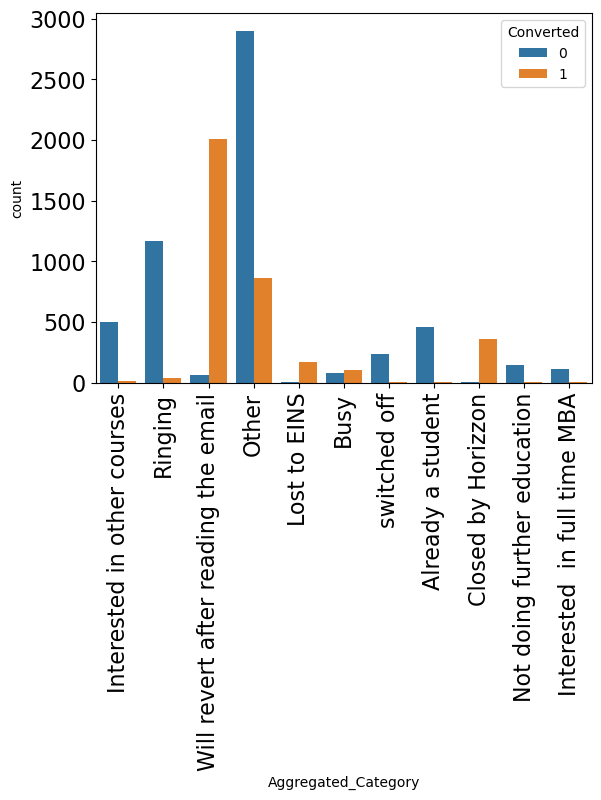

In [243]:
top_categories = leads_data["Tags"].value_counts().nlargest(10).index
leads_data['Aggregated_Category'] = leads_data['Tags'].where(leads_data['Tags'].isin(top_categories), 'Other')

sns.countplot(x='Aggregated_Category', hue='Converted', data=leads_data)
plt.xticks(rotation=90)
plt.show()

In [244]:
leads_data["Aggregated_Category"].value_counts()

Other                                  3765
Will revert after reading the email    2072
Ringing                                1203
Interested in other courses             513
Already a student                       465
Closed by Horizzon                      358
switched off                            240
Busy                                    186
Lost to EINS                            175
Not doing further education             145
Interested  in full time MBA            117
Name: Aggregated_Category, dtype: int64

In [245]:
tags_null=leads_data[leads_data["Tags"].isnull()]
tags_null["Tags"].fillna("Exp",inplace=True)

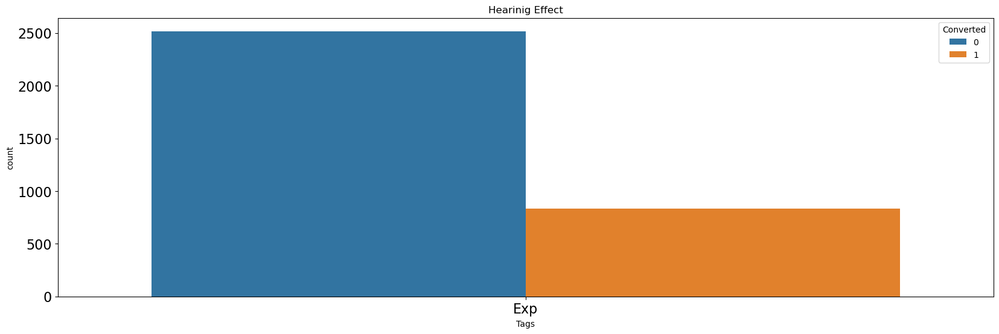

In [246]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Tags', hue='Converted', data=tags_null)
plt.title('Hearinig Effect')
plt.show()

In [247]:
leads_data["Converted"].value_counts()

0    5679
1    3560
Name: Converted, dtype: int64

In [248]:
tags_null["Converted"].value_counts()

0    2517
1     835
Name: Converted, dtype: int64

Not Ideal to remove Null Values Since it is contributing to #30% of conversions and 50% of Non Conversions

In [249]:
leads_data["Tags"].fillna("Not Specified",inplace=True)

In [250]:
leads_data["Lead Quality"].value_counts()

Might be             1560
Not Sure             1092
High in Relevance     637
Worst                 601
Low in Relevance      583
Name: Lead Quality, dtype: int64

In [251]:
leads_data["Lead Quality"].isnull().sum()

4766

In [252]:
data_leads_null=leads_data[leads_data["Lead Quality"].isnull()]

In [253]:
data_leads_null["Converted"].value_counts()

0    3743
1    1023
Name: Converted, dtype: int64

since 1023 people are converted in Lead Quality mentioned as Null
so Straight Away we can convert those 1023 into high relavance
and 3743 people are not enrolled so we can consider "Low In Relevance"

In [254]:
leads_data["Lead Quality"].value_counts()

Might be             1560
Not Sure             1092
High in Relevance     637
Worst                 601
Low in Relevance      583
Name: Lead Quality, dtype: int64

In [255]:
leads_data["Lead Quality"]=np.where((leads_data["Lead Quality"].isnull()) & (leads_data["Converted"]==1),'High in Relevance',leads_data["Lead Quality"])
leads_data["Lead Quality"]=np.where((leads_data["Lead Quality"].isnull()) & (leads_data["Converted"]==0),"Low in Relevance",leads_data["Lead Quality"])

In [256]:
leads_data["Lead Quality"].isnull().sum()

0

In [257]:
leads_data[leads_data["Lead Profile"]=="Potential Lead"]["Converted"].value_counts()

1    1267
0     346
Name: Converted, dtype: int64

80% of Potential Leads are successfully converted

In [258]:
leads_data["Lead Quality"]=np.where((leads_data["Lead Quality"].isnull()) & (leads_data["Lead Profile"]=="Potential Lead"),'High in Relevance',leads_data["Lead Quality"])


In [259]:
leads_data["Lead Profile"].value_counts()

Select                         4145
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

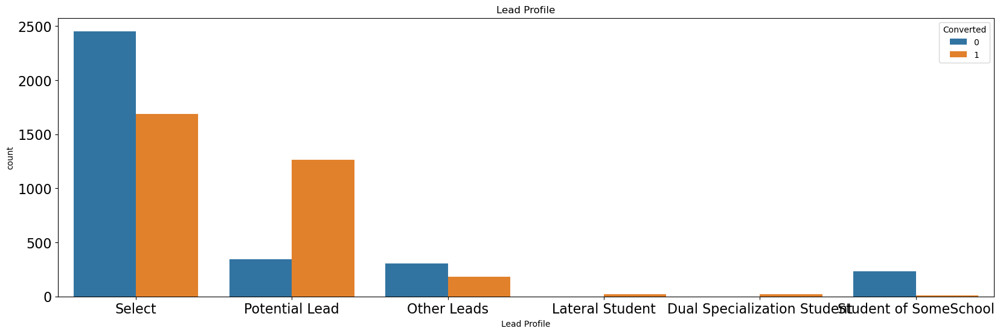

In [260]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Lead Profile', hue='Converted', data=leads_data)
plt.title('Lead Profile')
plt.show()

In [261]:
leads_data["Lead Profile"].isnull().sum()

2709

In [262]:
leads_data["Lead Profile"]=np.where((leads_data["Lead Profile"]=="Select") & (leads_data["Converted"]==1),'Potential Lead',leads_data["Lead Profile"])
leads_data["Lead Profile"]=np.where((leads_data["Lead Profile"].isnull()) & (leads_data["Converted"]==1),'Potential Lead',leads_data["Lead Profile"])
leads_data["Lead Profile"]=np.where((leads_data["Lead Profile"].isnull()) & (leads_data["Converted"]==0),'Not Usefull',leads_data["Lead Profile"])
leads_data["Lead Profile"]=leads_data["Lead Profile"].rename({"Select":"Not Specified"})

In [263]:
leads_data["City"]=leads_data["City"].rename({
    "Select":"Not Specified"
})
leads_data["City"].fillna("Not Specified",inplace=True)
leads_data[leads_data["Asymmetrique Activity Index"]=="03.Low"]["Asymmetrique Activity Score"].value_counts()
leads_data[leads_data["Asymmetrique Activity Index"]=="02.Medium"]["Asymmetrique Activity Score"].value_counts()
leads_data[leads_data["Asymmetrique Activity Index"]=="01.High"]["Asymmetrique Activity Score"].value_counts()

16.0    467
17.0    349
18.0      5
Name: Asymmetrique Activity Score, dtype: int64

In [264]:
def assign_score(value):
    if(value=="01.High"):
        return 17.0
    elif(value=="02.Medium"):
        return 15.0 
    else:
        return 10.0
        

In [265]:
good_activity=["Olark Chat Conversation","Page Visited on Website","Converted to Lead","Form Submitted on Website"
              "Had a Phone Conversation","Approached upfront","Resubscribed to emails"]
medium_activity=["Olark Chat Conversation","Page Visited on Website","Form Submitted on Website"]
leads_data["Asymmetrique Activity Index"]=np.where((leads_data["Asymmetrique Activity Index"].isnull()) & (leads_data["Last Activity"].isin(good_activity)),'01.High',leads_data["Asymmetrique Activity Index"])
leads_data["Asymmetrique Activity Index"]=np.where((leads_data["Asymmetrique Activity Index"].isnull()) & (leads_data["Converted"]==1),'01.High',leads_data["Asymmetrique Activity Index"])
leads_data["Asymmetrique Activity Index"]=np.where((leads_data["Asymmetrique Activity Index"].isnull()) & (leads_data["Converted"]==0) & (leads_data["Last Activity"].isin(medium_activity)),'02.Medium',leads_data["Asymmetrique Activity Index"])
leads_data["Asymmetrique Activity Index"]=np.where((leads_data["Asymmetrique Activity Index"].isnull()) & (leads_data["Converted"]==0),'03.Low',leads_data["Asymmetrique Activity Index"])

leads_data["Asymmetrique Profile Index"]=np.where((leads_data["Asymmetrique Profile Index"].isnull()) & (leads_data["Converted"]==1) & (leads_data["Lead Profile"]=="Potential Lead"),'01.High',leads_data["Asymmetrique Profile Index"])
leads_data["Asymmetrique Profile Index"]=np.where((leads_data["Asymmetrique Profile Index"].isnull()) & (leads_data["Converted"]==1) & (leads_data["Lead Profile"]=="Not Usefull"),'02.Medium',leads_data["Asymmetrique Profile Index"])
leads_data["Asymmetrique Profile Index"]=np.where((leads_data["Asymmetrique Profile Index"].isnull()) & (leads_data["Converted"]==1),'02.Medium',leads_data["Asymmetrique Profile Index"])
leads_data["Asymmetrique Profile Index"]=np.where((leads_data["Asymmetrique Profile Index"].isnull()) & (leads_data["Converted"]==0),'03.Low',leads_data["Asymmetrique Profile Index"])


In [266]:
leads_data["Asymmetrique Activity Score"]=leads_data["Asymmetrique Activity Index"].apply(assign_score)
leads_data["Asymmetrique Profile Score"]=leads_data["Asymmetrique Profile Index"].apply(assign_score)

In [267]:
leads_data.dropna(inplace=True)

# Data Visulization

In [268]:
def Quantify_function(column):
    percentage = leads_data.groupby(column)['Converted'].mean() * 100
    return percentage

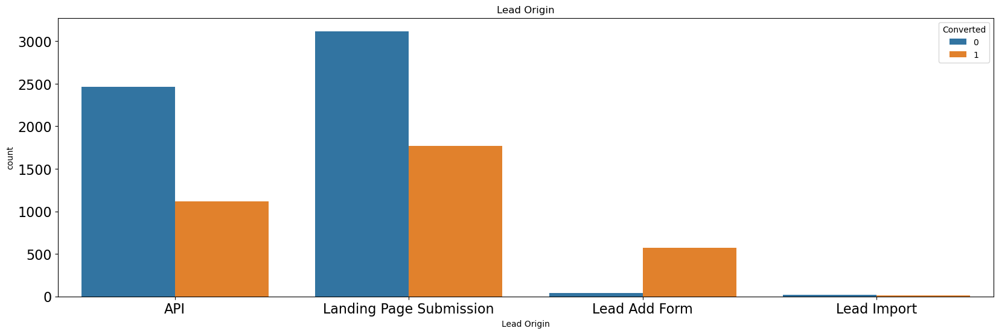

In [269]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Lead Origin', hue='Converted', data=leads_data)
plt.title('Lead Origin')
plt.show()

Converting Lead Origin Category Variables into Quantify Parameters

In [270]:
leads_data["origin_percentage"]=leads_data["Lead Origin"].map(Quantify_function("Lead Origin"))
leads_data.head(3)

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity,Aggregated_Category,origin_percentage
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,Not Specified,Not Specified,Unemployed,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified,Interested in other courses,31.162661
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Not Specified,Unemployed,No,No,No,No,No,No,No,No,Ringing,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened,Ringing,31.162661
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,15.0,17.0,No,Yes,Email Opened,Will revert after reading the email,36.185018


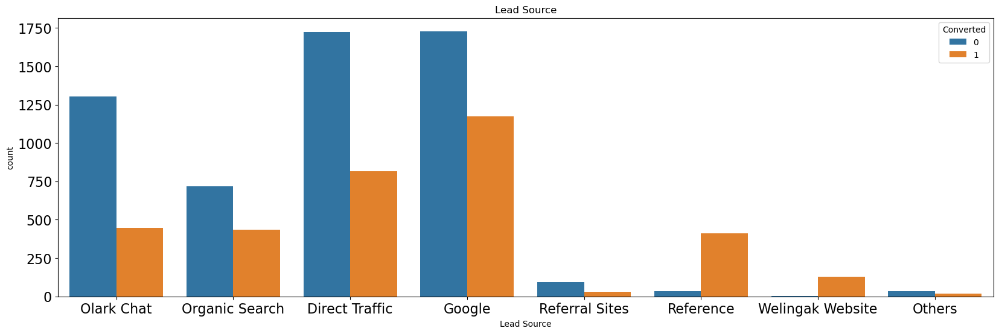

In [271]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Lead Source', hue='Converted', data=leads_data)
plt.title('Lead Source')
plt.show()

In [272]:
leads_data["source_percentage"]=leads_data["Lead Source"].map(Quantify_function("Lead Source"))

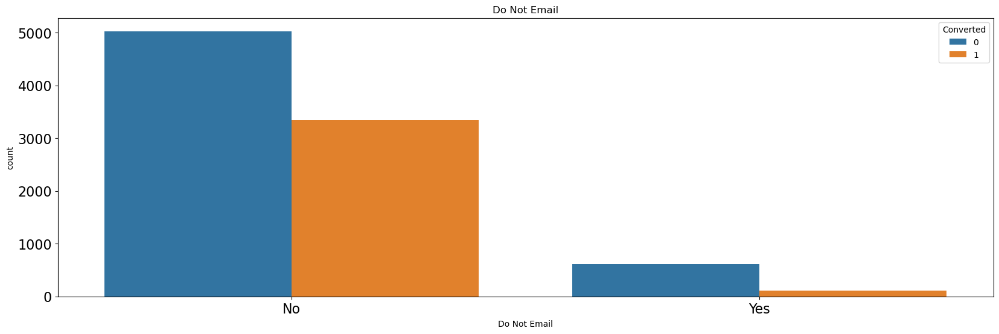

In [273]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Do Not Email', hue='Converted', data=leads_data)
plt.title('Do Not Email')
plt.show()

In [274]:
leads_data["do_not_mail_per"]=leads_data["Do Not Email"].map(Quantify_function("Do Not Email"))

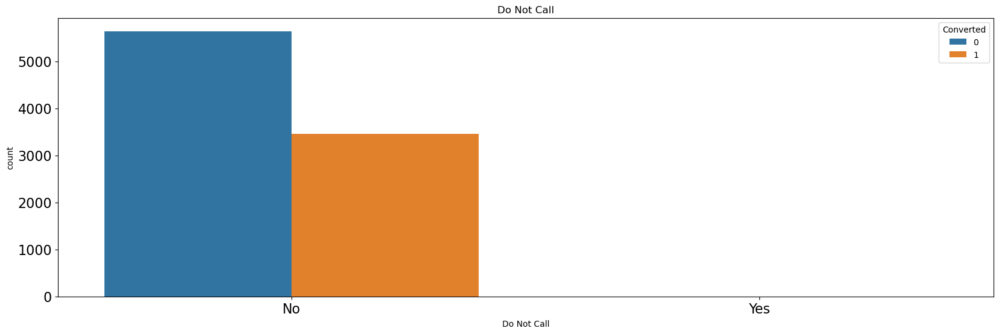

In [275]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Do Not Call', hue='Converted', data=leads_data)
plt.title('Do Not Call')
plt.show()

In [276]:
leads_data["do_not_call_per"]=leads_data["Do Not Call"].map(Quantify_function("Do Not Call"))

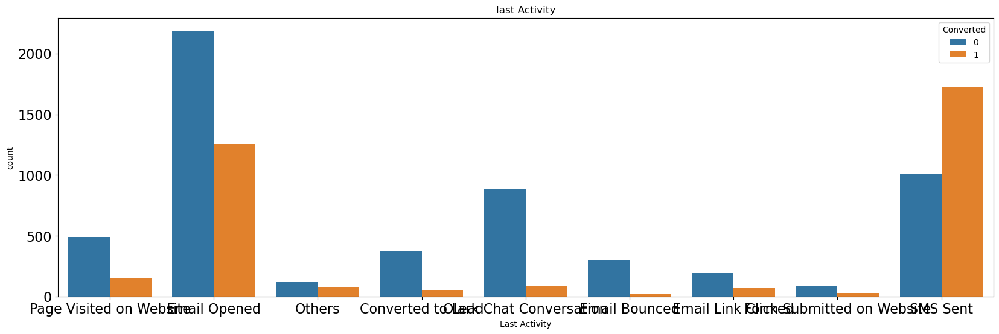

In [277]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Last Activity', hue='Converted', data=leads_data)
plt.title('last Activity')
plt.show()
leads_data["last_act_per"]=leads_data["Last Activity"].map(Quantify_function("Last Activity"))

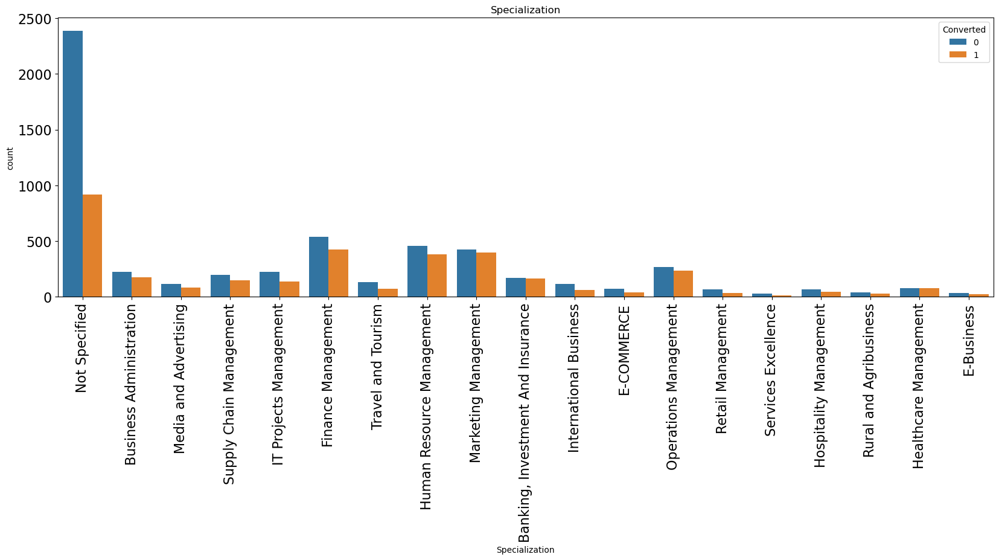

In [278]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Specialization', hue='Converted', data=leads_data)
plt.title('Specialization')
plt.xticks(rotation=90)
plt.show()
leads_data["Specialization_per"]=leads_data["Specialization"].map(Quantify_function("Specialization"))

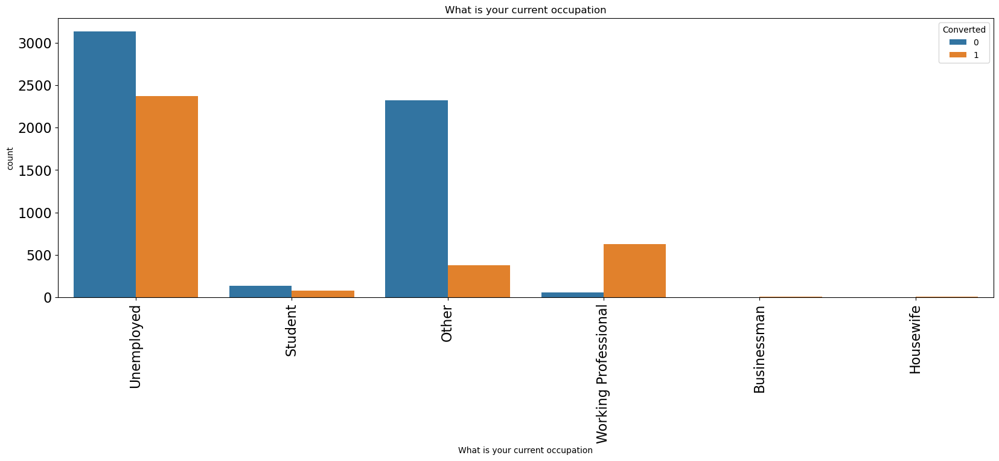

In [279]:

plt.figure(figsize=(20, 6))
sns.countplot(x='What is your current occupation', hue='Converted', data=leads_data)
plt.title('What is your current occupation')
plt.xticks(rotation=90)
plt.show()
leads_data["occupation_per"]=leads_data["What is your current occupation"].map(Quantify_function("What is your current occupation"))

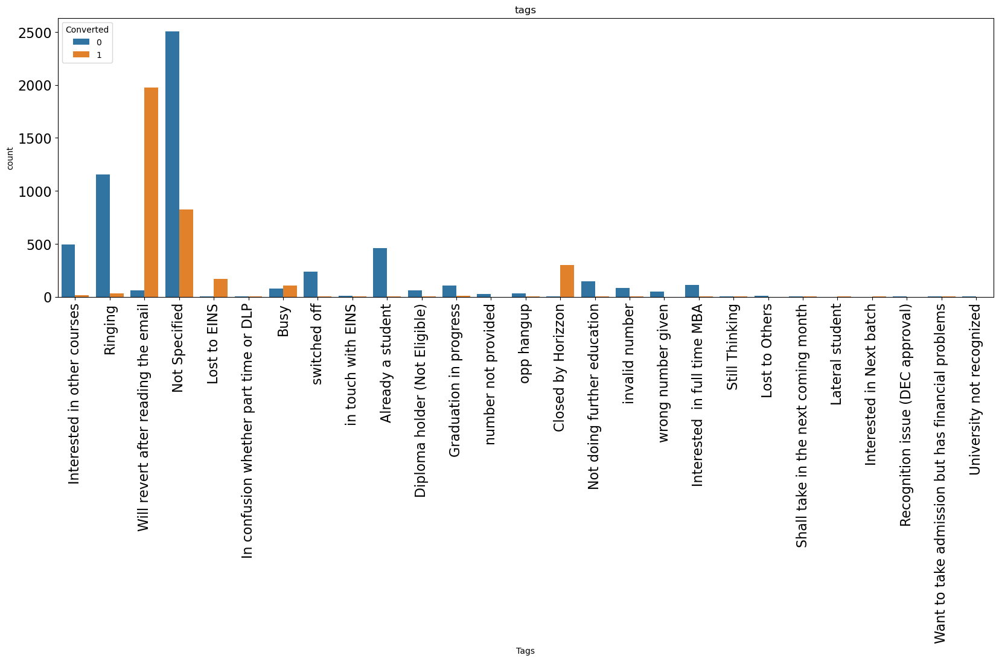

In [280]:

plt.figure(figsize=(20, 6))
sns.countplot(x='Tags', hue='Converted', data=leads_data)
plt.title('tags')
plt.xticks(rotation=90)
plt.show()
leads_data["tags_per"]=leads_data["Tags"].map(Quantify_function("Tags"))

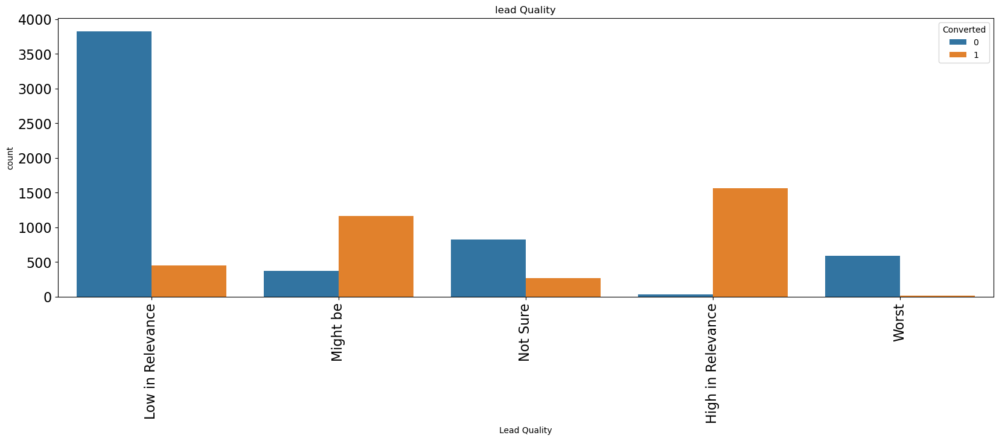

In [281]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Lead Quality', hue='Converted', data=leads_data)
plt.title('lead Quality')
plt.xticks(rotation=90)
plt.show()
leads_data["lead_quality_per"]=leads_data["Lead Quality"].map(Quantify_function("Lead Quality"))

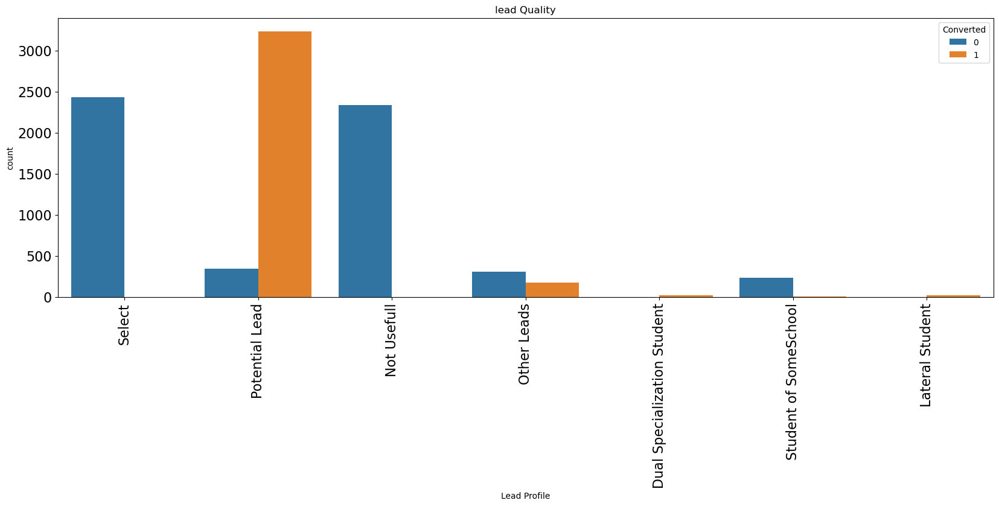

In [282]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Lead Profile', hue='Converted', data=leads_data)
plt.title('lead Quality')
plt.xticks(rotation=90)
plt.show()
leads_data["lead_profile_per"]=leads_data["Lead Profile"].map(Quantify_function("Lead Profile"))

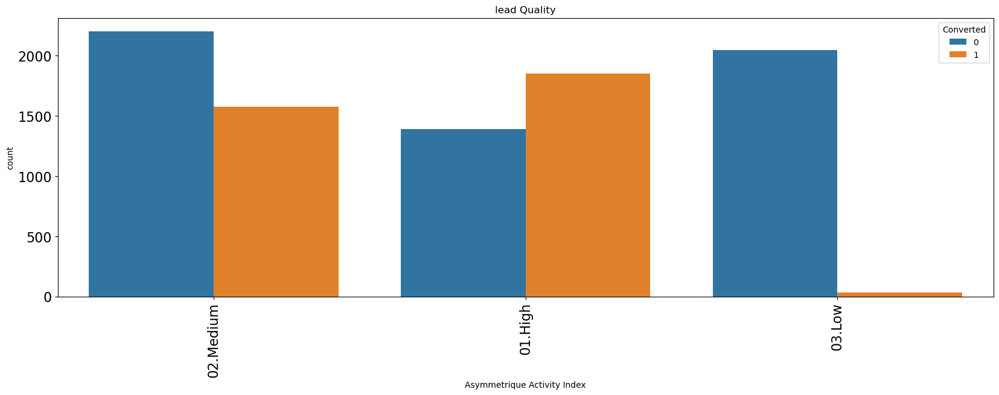

In [283]:
plt.figure(figsize=(20, 6))
sns.countplot(x='Asymmetrique Activity Index', hue='Converted', data=leads_data)
plt.title('lead Quality')
plt.xticks(rotation=90)
plt.show()
leads_data["activity_index_per"]=leads_data["Asymmetrique Activity Index"].map(Quantify_function("Asymmetrique Activity Index"))

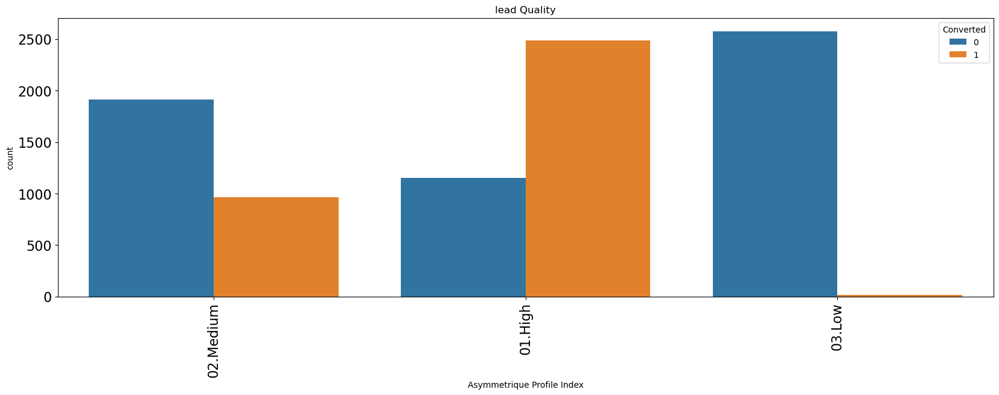

In [284]:

plt.figure(figsize=(20, 6))
sns.countplot(x='Asymmetrique Profile Index', hue='Converted', data=leads_data)
plt.title('lead Quality')
plt.xticks(rotation=90)
plt.show()
leads_data["profile_index_per"]=leads_data["Asymmetrique Profile Index"].map(Quantify_function("Asymmetrique Profile Index"))

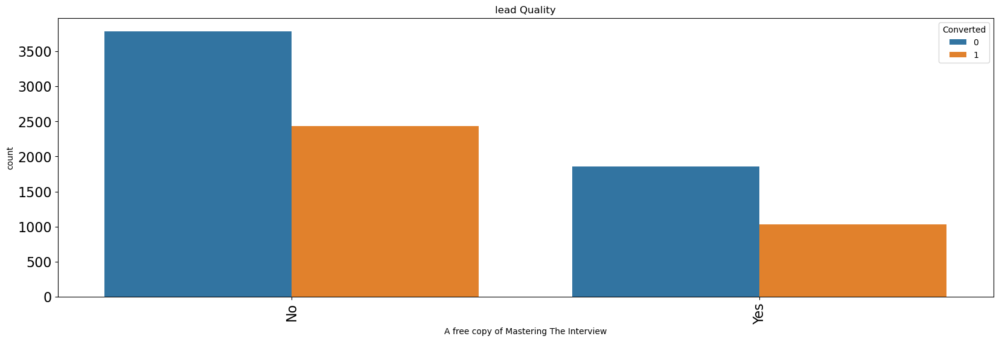

In [285]:
plt.figure(figsize=(20, 6))
sns.countplot(x='A free copy of Mastering The Interview', hue='Converted', data=leads_data)
plt.title('lead Quality')
plt.xticks(rotation=90)
plt.show()
leads_data["master_per"]=leads_data["A free copy of Mastering The Interview"].map(Quantify_function("A free copy of Mastering The Interview"))

# Filtered Columns

In [286]:
usefullColumns=[                        
"source_percentage",                         
"origin_percentage",                         
"do_not_mail_per",                           
 "do_not_call_per",                           
 "last_act_per",                             
 "Specialization_per",                       
 "occupation_per",                            
 "tags_per",                                  
 "lead_quality_per",                          
 "lead_profile_per",                          
 "activity_index_per",                        
 "profile_index_per","Converted","TotalVisits","Total Time Spent on Website",
    "Page Views Per Visit"
,"Asymmetrique Activity Score","Asymmetrique Profile Score","master_per"]

In [287]:
filtered_df2=leads_data[usefullColumns]
filtered_df2.head(5)

,source_percentage,origin_percentage,do_not_mail_per,do_not_call_per,last_act_per,Specialization_per,occupation_per,tags_per,lead_quality_per,lead_profile_per,activity_index_per,profile_index_per,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score,master_per
0,25.556189,31.162661,39.96897,38.006812,23.593750,27.845036,43.057070,2.554028,10.625876,0.000000,41.677693,33.437609,0,0.0,0,0.0,15.0,15.0,39.115044
1,37.781629,31.162661,39.96897,38.006812,36.456212,27.845036,43.057070,2.859546,10.625876,0.000000,41.677693,33.437609,0,5.0,674,2.5,15.0,15.0,39.115044
2,32.166732,36.185018,39.96897,38.006812,36.456212,43.859649,36.231884,97.100737,75.799087,90.464206,41.677693,68.335626,1,2.0,1532,2.0,15.0,17.0,35.664820
3,32.166732,36.185018,39.96897,38.006812,39.378238,41.584158,43.057070,2.859546,24.471021,0.000000,41.677693,68.335626,0,1.0,305,1.0,15.0,17.0,39.115044
4,40.420400,36.185018,39.96897,38.006812,12.616822,27.845036,43.057070,97.100737,75.799087,90.464206,41.677693,68.335626,1,2.0,1428,1.0,15.0,17.0,39.115044


In [288]:
filtered_df2.corr()

,source_percentage,origin_percentage,do_not_mail_per,do_not_call_per,last_act_per,Specialization_per,occupation_per,tags_per,lead_quality_per,lead_profile_per,activity_index_per,profile_index_per,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score,master_per
source_percentage,1.000000,0.913793,0.032328,0.027220,0.210159,0.108605,0.262403,0.293322,0.293260,0.300422,0.104282,0.266517,0.319348,-0.066685,-0.055263,-0.091407,0.103740,0.230308,0.165595
origin_percentage,0.913793,1.000000,0.006306,0.023973,0.192507,0.116376,0.253981,0.299444,0.286747,0.289991,0.114909,0.260699,0.310223,-0.131112,-0.151473,-0.202696,0.114694,0.219863,0.077706
do_not_mail_per,0.032328,0.006306,1.000000,0.004358,0.158322,0.006042,0.064862,0.120913,0.108346,0.124469,0.114843,0.087506,0.136553,-0.033842,0.047943,-0.033582,0.114644,0.096099,0.056098
do_not_call_per,0.027220,0.023973,0.004358,1.000000,-0.011936,0.018719,0.003703,0.023244,0.004923,0.017901,0.008058,0.006862,0.018927,0.003221,0.007062,-0.005918,0.008045,0.008347,0.010105
last_act_per,0.210159,0.192507,0.158322,-0.011936,1.000000,0.196531,0.226458,0.268635,0.405776,0.378104,-0.059541,0.300707,0.395843,0.054478,0.175950,0.154755,-0.060166,0.260355,-0.077001
Specialization_per,0.108605,0.116376,0.006042,0.018719,0.196531,1.000000,0.268460,0.226713,0.104757,0.182156,-0.054752,0.272004,0.173779,0.216271,0.274509,0.341483,-0.055599,0.181032,-0.422863
occupation_per,0.262403,0.253981,0.064862,0.003703,0.226458,0.268460,1.000000,0.383609,0.304157,0.434892,0.104834,0.268520,0.415385,0.029477,0.156687,0.044027,0.104217,0.246227,-0.045079
tags_per,0.293322,0.299444,0.120913,0.023244,0.268635,0.226713,0.383609,1.000000,0.505525,0.683226,0.348765,0.468318,0.790874,0.017753,0.284952,-0.001682,0.348596,0.445825,0.020781
lead_quality_per,0.293260,0.286747,0.108346,0.004923,0.405776,0.104757,0.304157,0.505525,1.000000,0.718845,0.290128,0.460384,0.751452,0.018191,0.254577,0.001123,0.290003,0.438232,0.033086
lead_profile_per,0.300422,0.289991,0.124469,0.017901,0.378104,0.182156,0.434892,0.683226,0.718845,1.000000,0.401193,0.596410,0.894637,0.031761,0.319398,0.002989,0.400701,0.569083,0.017906


In [289]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Assuming you have a DataFrame 'df' with features and target variable
# X should contain your features, and y should be your target variable

# Assuming 'target_column' is the name of your target variable column
X = filtered_df2.drop('Converted', axis=1)
y = filtered_df2['Converted']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features if needed (optional, but can be beneficial for logistic regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the logistic regression model
model = LogisticRegression(random_state=42)

# Train the model on the training data
model.fit(X_train_scaled, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)


Accuracy: 0.9912136188907194
Confusion Matrix:
[[1153    7]
 [   9  652]]
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1160
           1       0.99      0.99      0.99       661

    accuracy                           0.99      1821
   macro avg       0.99      0.99      0.99      1821
weighted avg       0.99      0.99      0.99      1821



# SUMMARY AND RECOMMENDATIONS:-

### conversion percentage of more than 99%  obtained(99.12) as per the problem statement and requirement from CEO.

### positive predictors with decreasing coefficient values:-
    

#### An a unit increase in the variable listed below, increases the conversion rate  by that coeffcicient units.


1.	Tags_Closed by Horizzon						8.2871

2.	Tags_Lost to EINS							8.2116

3.	Total Time Spent on Website					4.3958

4.	Lead Origin_Lead Add Form					3.8077

5.	Tags_Will revert after reading the email				3.6800

6.	Last Activity_Had a Phone Conversation				3.0146

7.	Tags_Busy								2.8829

8.	Last Notable Activity_SMS Sent					2.7956

9.	Lead Origin_Lead Import						2.1451

10.	Last Activity_Unsubscribed					2.3069

11.	What is your current occupation_Working Professional	1.3030


### Negative predictors with decreasing coefficient values:-

#### An a unit increase in the variable listed below,decreases the conversion rate  by that coeffcicient units.

1.	Do Not Email 							-1.8844

2.	Tags_Ringing							-1.6169

3.	What is your current occupation_Unemployed		-1.5669

4.	Tags_switched off							-1.0927


# Recommendations:-

## Analysing the above model, the comapany should focus on the following features:


** Increase marketing for**:  
    
    
- Company can focus on marketing more on Tags (indicating the current status of the lead) 
especially for "tags_Closed by Horizzon "and "Tags_Lost to EIN","tags_Will revert after reading the email"
to increase their sales.


- Company can focus on marketing more on Lead Origin (The origin identifier Including API, Landing Page Submission, etc.)
espacially on the categories Lead Add Form , Lead Import  since they are the next potential positive predictots.



- Company can focus on marketing more on the customer who spent more time 
on website since they have high potential for conversion.



- Focusing on the customers with whom Last Activity - Had a Phone Conversation - are likely to be converted.



- Focusing more on the  Working Professional categories who come under current occupation are likely to be converted
since X Education selling online courses to industry professionals are beneficiary to them.




** Decrease marketing for**: 
    
    
- Company can reduce their focus on the custoners who have  opted do not email , do not call , 
who do not pick their phone calls when called, whose phones are swithed off when called and unemployed categories.


- These customers are veryless likley to be converted and company can expect very less revenue out of these customers.



- The company may try to increase the revenue for less likely customers by
increasing the attractive offers and referral credit cash backs  to them.

    

    



    
